## Summary of Notebook

This notebook covers all trained models that I believe to be interesting. Overall, the models with the best performance for denoising Monte Carlo Path-traced images were those that were FCNN networks (Fully Convolutional Neural Networks), wherein all layers are convolutional layers, optionally with batch normalization occuring. Interestingly, the optimum depth was found to be much lower than what could be tested; this is most likely due to the issue of vanishing gradient. With networks of a depth > 10, noise would successfully be removed, but the resultant images were lacking much color. Conversely, networks of depth 5 < x < 15 performed much better, wherein color was preserved and the image was denoised. Additionally, it was found that ReLU as an activation function was perfectly suited to every layer within successful networks, and the bias of hiden layers actually got in the way of useful results, resulting in the most efficient networks being FCNNs with batch normalization, not utilizing biases.

### Best Overall Model
The best model overall was the "DnCNNPlusDepthPSNR" model.

## Timeline of Completion

#### Sunday March 6 - Completion of initial python-based ray-trace rendering engine
#### Sunday March 20 - Completion of the Monte Carlo Path Tracer and generation of test/training sets
		   - This was moved back a week due to issues implementing Monte Carlo
#### Sunday March 27 - Implementation of custom PSNR function suited to network
#### Sunday April 3 -  Expected first usable results from CNN
#### Sunday April 10 - Expected fine-tuning of network to optimize results
#### Sunday April 17 - Anticipated end of data collection; working on final paper
#### Friday April 29 - Anticipated Due Date for completed MS Project and Paper


## Section 1: Imports and Helper Methods

This section contains all of the imports used for training, as well as helper functions to simplify the code corresponding to the creation and training of each model.

In [1]:
import numpy as np

import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU') 
if len(physical_devices)>0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)

import matplotlib.pyplot as plt

from tensorflow.keras import layers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Model
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from sklearn.utils import shuffle
import cv2
import datetime
from tensorflow.python.keras.saving import hdf5_format  #used for saving models 
from keras.models import model_from_json # For loading models from json
import h5py

In [2]:
# Custom method to normalize depth array
# By default, the depth of any point that misses all spheres is 999,999
# Thus, to correct for this in the NN, we must manually normalize it
def normalizeDepthArray(depth):
    
    minDepth = 99999
    maxDepth = -99999
    
    # Find min and max (in points that hit)
    for sample in range(len(depth)):
        for i in range(len(depth[sample])):
            val = depth[sample][i]
            # For finding min,max, ignore rays that missed
            if (not val > 99999):
                if (val < minDepth):
                    minDepth = val
                if (val > maxDepth):
                    maxDepth = val
                    
    depthRange = maxDepth - minDepth
                    
                    
    # Correct depth by min and max
    for sample in range(len(depth)):
        for i in range(len(depth[sample])):
            val = depth[sample][i]
            # For finding min,max, ignore rays that missed
            if (not val > 99999):
                depth[sample][i] = (val - minDepth) / depthRange
            else:
                depth[sample][i] = (2 * depthRange) / depthRange
    
    
    return depth


# Loads a training dataset generated by my custom Path Tracer
def loadTestTrainDataset(count, directory = 'trainingSamples'):
    
    # Note the difference in size; y doesn't have depth channel
    x_set = np.zeros( shape = (count,100,100,4),dtype=np.float32)
    y_set = np.zeros( shape = (count,100,100,3),dtype=np.float32)
    
    for i in range(count):
        
        
        # Generate file paths formulaically
        imagePath = 'trainingSamples/{}_input.png'.format(i)
        depthPath = 'trainingSamples/{}_depth.csv'.format(i)
        
        # Load in depth values
        depth = np.genfromtxt(depthPath, delimiter=',').reshape(100,100,1)
        
        depth = normalizeDepthArray(depth)
        
        # Load in image
        # cv2 reads in grb mode, also switch this to rgb with list slicing
        image = cv2.imread(imagePath)[:,:,[2,1,0]] / 255.0
        
        # Append depth channel to image
        x_set[i] = np.append(image, depth, axis=2)
        
        
        # Load y without depth data
        
        imagePath = 'trainingSamples/{}_expected-out.png'.format(i)
        image = cv2.imread(imagePath)[:,:,[2,1,0]] / 255.0
        y_set[i] = image
    
    return x_set, y_set

# Renders n related sets of images, particularly a random subset of both
# Also titles images based on category, and index in given list
def renderComparison(imageComparisonList, subtitles = None, count = 6, fileName = None):
    
    # Add automatic titles if not enough are provided
    if subtitles == None or len(imageComparisonList) < 2:
        subtitles = [i for i in range(len(imageComparisonList))]
        
    # Store lengths for easier reading
    numLists = len(imageComparisonList)
    imageCount = len(imageComparisonList[0])
    
    # Randomly select image indexes and set up plot
    selection = np.random.randint( imageCount, size = count)
    plt.figure(figsize=(count*2, 2*numLists), dpi=100)
    
    # Iterate over chosen image indexes
    for i in range(count):
        index = selection[i]
        
        # Iterate over each image list, plotting
        for k in range(numLists):
            currentList = imageComparisonList[k]
            ax = plt.subplot(numLists, count, i + 1 + (k*count))
            ax.title.set_text('#{}, {}'.format(index, subtitles[k]))
            ax.set_axis_off()
            plt.imshow(currentList[index].squeeze())
        
        
    if (fileName != None):
        plt.savefig(fileName)
    plt.show()
    
# NOTE ABOUT PSNR
# As "Peak Signal-to-noise-Ratio", we want to MAXIMIZE, not minimize this value
# To simplify training, we will simply negate this value in our custom functions

# Tensor-based Peak Signal-to-Noise Ratio (PSNR)
# This custom method is OK with input and output being of different dimensions
# After cleaning up input to the network, however, this method is redundant
# Calculates, on log scale, amount of noise in predicted image given a ground truth image
# Note, that we negate this value so our NN minimizes noise
def customPSNR( y_true , y_pred ):

    psnr = tf.multiply(tf.constant(-1, dtype=tf.float32),
    tf.multiply(tf.constant(20, dtype=tf.float32),
        tf.math.divide(
            tf.math.log(
                tf.math.divide(
    
                    tf.math.reduce_max(y_true, axis = [1,2,3]),
                    tf.math.sqrt(
                        tf.math.reduce_mean (
                            tf.math.squared_difference(tf.cast(y_true,tf.float32) ,tf.cast(y_pred,tf.float32)) 
                        , axis = [1,2,3])
                    )
                )
            )
        , tf.math.log(tf.constant(10, dtype=tf.float32)) )
        )
    )
    
    
    return psnr

# Usage of built-in PSNR, with a specified maximum value
# Effectively the same as above, just mapping output to a different range (~1/4 of above function's output)
# Note, that we negate this value so our NN minimizes noise
def builtInPSNR(x,y):
    return tf.multiply(tf.constant(-1, dtype=tf.float32), tf.image.psnr(x, y, 255) )


# Train the specified model, introducing callbacks and recording metrics
# Essentially the function we learned to use in Homeworks, just modularized
# And, at the end, a visualization of output is rendered and saved to disk
def trainAndRenderModel(model, x_train, y_train, x_test, y_test, modelName, epochs = 100, batch_size = 32):
    
    # Callback setup to track model learning
    # From the homeworks
    %reload_ext tensorboard
    model_path = 'saved_models/{}.sav'.format(modelName)
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_cbk = TensorBoard(log_dir=log_dir, histogram_freq=1)
    early_stopping_cbk = EarlyStopping(monitor='val_loss', patience=100, verbose=0, mode='min')
    mcp_save_cbk = ModelCheckpoint(model_path+'.mcp.hdf5', save_best_only=True, monitor='val_loss', mode='min')
    reduce_lr_plateau_cbk = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min')
    callbacks = [early_stopping_cbk, mcp_save_cbk, reduce_lr_plateau_cbk, tensorboard_cbk]
    
    # Print out specifics of model
    model.summary()
    
    # Actually train the model by calling the fit function
    history = model.fit(x = x_train,
                        y = y_train,
                        epochs = epochs,
                        batch_size = batch_size,
                        validation_data = (x_test, y_test),
                        callbacks = callbacks
    )
    
    
    # Plotting of training history
    # Also derived from homeworks
    # Includes saving graph to file
    metrics = ['loss','mean_squared_error', 'binary_crossentropy', 'cosine_similarity', 'customPSNR', 'builtInPSNR']
    plt.figure( figsize=(15,15) , dpi=100)
    for i in range(len(metrics)):
        plt.subplot(3, 2, i+1)
        plt.plot( history.history[metrics[i]] , label='Train' , color='maroon')
        plt.plot( history.history['val_'+metrics[i]] , label='Test' , color='limegreen')
        plt.xlabel( 'Epoch' )
        plt.ylabel( metrics[i] )
        plt.title( '{} during Training {}'.format(metrics[i],modelName) )
        plt.legend( )
    plt.savefig(model_path+'-training-graph.png')
    plt.show( )
    
    
    
    # Use model to de-noise test set   
    predictions = model.predict(x_test)
    # Find residual noise by subtracting prediction from input
    noise = x_test[:,:,:,:3] - predictions
    # Then render a comparison of all image classes
    renderComparison(   [ x_test[:,:,:,:3], noise, predictions, y_test ], 
                        subtitles = ['input','noise','output', 'truth'],
                        count = 6,
                        fileName = model_path+'-output-comparison.png')

    # Finally, we save the final model to file and return output history
    save_model(model_path, model=model, name=modelName, description='Completed and Trained Model '+modelName )
    
    return [history, model]


## NOTE: These two helper function (save model, load model) are taken from the homeworks
# The only use is to save/load the trained models to file.

# Save model
def save_model(model_path, model, name, description):
    # This function takes the prefix of the model_path and a name and description as input
    # and saves the architecture as a json file and weights as additional file.
    # The best model is already saved by the mcp_callback during the fit() call with extension *.mcp.hdf5
    
    # Step 1: serialize model architecture to *.json file
    model_json = model.to_json()
    with open(model_path+".json", "w") as json_file:
        json_file.write(model_json)

    #Step 2: now the model weights + additional attributes as *.additional
    with h5py.File(model_path+'.additional', mode='w') as f:
        hdf5_format.save_model_to_hdf5(model, f)
        f.attrs['name'] = name
        f.attrs['description'] = description

#load model
def load_model(model_path):
    # This function loads from the 3 files: *.json, *.additional, *.mcp.hdf5 located at the model_path prefix
    # and returns the best model, it's name and description
    
    mode = []
    name = 'NA'
    descripton = 'NA'
    with open(model_path+'.json', 'r') as json_file:
        loaded_model_json = json_file.read()
        model = model_from_json(loaded_model_json) #load the architecture
        model.load_weights(model_path+'.mcp.hdf5') #load the weights (from the ModelCheckPoint)
        
        with h5py.File(model_path+'.additional', mode='r') as f: #load the additional name/description info
            name = f.attrs['name']
            description = f.attrs['description']
    return model
    #return [model, name, description]

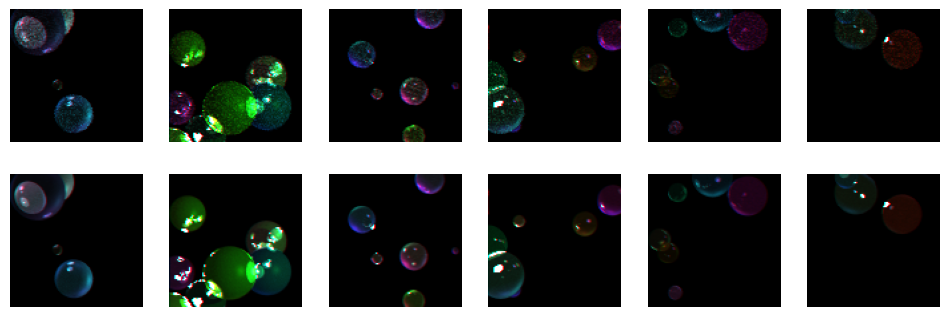

In [51]:
# Renders n related sets of images, particularly a random subset of both
# Also titles images based on category, and index in given list
def renderComparison(imageComparisonList, subtitles = None, count = 6, fileName = None):
    
    # Add automatic titles if not enough are provided
    if subtitles == None or len(imageComparisonList) < 2:
        subtitles = [i for i in range(len(imageComparisonList))]
        
    # Store lengths for easier reading
    numLists = len(imageComparisonList)
    imageCount = len(imageComparisonList[0])
    
    # Randomly select image indexes and set up plot
    selection = np.random.randint( imageCount, size = count)
    plt.figure(figsize=(count*2, 2*numLists), dpi=100)
    
    # Iterate over chosen image indexes
    for i in range(count):
        index = selection[i]
        
        # Iterate over each image list, plotting
        for k in range(numLists):
            currentList = imageComparisonList[k]
            ax = plt.subplot(numLists, count, i + 1 + (k*count))
            #ax.title.set_text('#{}, {}'.format(index, subtitles[k]))
            ax.set_axis_off()
            plt.imshow(currentList[index].squeeze())
        
        
    if (fileName != None):
        plt.savefig(fileName)
    plt.show()

#dataCount = 1000
#x_set, y_set = loadTestTrainDataset(dataCount)
    
renderComparison( [x_set[:,:,:,:-1], y_set], ['X','y'], 6)

In [ ]:
# Load full dataset (1000 entries)
dataCount = 1000
x_set, y_set = loadTestTrainDataset(dataCount)

# Shuffle x and y-set to negate bias in input order
x_set, y_set = shuffle(x_set, y_set) #, random_state=0) # Uncomment for repeatable shufflings


# NOTE the slice '[:,:,:,:-1]' represents convering each pixel from 4d to 3d (from color+depth to color)
# Here is a visualization of X vs y data (without Depth)
renderComparison( [x_set[:,:,:,:-1], y_set], ['X','y'], 6)

## Section 2: Proposed Models and General Evaluations
This section explores several unique potential neural networks, with the goal of determining what general architecture, activation functions, and loss function come together to form the best overall model. Overall, the model "DnCNNPlusDepthPSNR" performed the best. This model is comprised completely of Convolution layers, making it a FCNN. It is composed of 1 input layer, 5 hidden convolution layers, and one final convolution layer that outputs the cleaned image. The only activation function used is ReLU, and each convolution step is followed by a batch normalization step before the activation function. The loss function is my Custom PSNR tensor function.

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv1 (Conv2D)              (None, 100, 100, 128)     4736      
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 128)    512       
 ormalization)                                                   
                                                                 
 Pool1 (MaxPooling2D)        (None, 50, 50, 128)       0         
                                                                 
 Conv2 (Conv2D)              (None, 50, 50, 128)       147584    
                                                                 
 batch_normalization_1 (Batc  (None, 50, 50, 128)      512       
 hNormalization)                                                 
                                                                 
 Pool2 (MaxPooling2D)        (None, 25, 25, 128)       0

Epoch 16/100
24/24 [==============================] - 1s 51ms/step - loss: -24.8464 - mean_squared_error: 0.0044 - binary_crossentropy: 0.0974 - cosine_similarity: 0.2543 - customPSNR: -24.8464 - builtInPSNR: -73.1332 - val_loss: -18.1979 - val_mean_squared_error: 0.0150 - val_binary_crossentropy: 0.1792 - val_cosine_similarity: 0.2463 - val_customPSNR: -18.1979 - val_builtInPSNR: -66.4917 - lr: 1.0000e-04
Epoch 17/100
24/24 [==============================] - 1s 51ms/step - loss: -25.0533 - mean_squared_error: 0.0043 - binary_crossentropy: 0.0960 - cosine_similarity: 0.2545 - customPSNR: -25.0533 - builtInPSNR: -73.3401 - val_loss: -19.3337 - val_mean_squared_error: 0.0118 - val_binary_crossentropy: 0.1619 - val_cosine_similarity: 0.2479 - val_customPSNR: -19.3337 - val_builtInPSNR: -67.6275 - lr: 1.0000e-04
Epoch 18/100
24/24 [==============================] - 1s 52ms/step - loss: -25.0865 - mean_squared_error: 0.0043 - binary_crossentropy: 0.0957 - cosine_similarity: 0.2548 - customP

Epoch 36/100
24/24 [==============================] - 1s 50ms/step - loss: -25.5713 - mean_squared_error: 0.0040 - binary_crossentropy: 0.0936 - cosine_similarity: 0.2565 - customPSNR: -25.5713 - builtInPSNR: -73.8580 - val_loss: -25.7554 - val_mean_squared_error: 0.0038 - val_binary_crossentropy: 0.0927 - val_cosine_similarity: 0.2585 - val_customPSNR: -25.7554 - val_builtInPSNR: -74.0492 - lr: 1.0000e-04
Epoch 37/100
24/24 [==============================] - 1s 50ms/step - loss: -25.6378 - mean_squared_error: 0.0039 - binary_crossentropy: 0.0930 - cosine_similarity: 0.2567 - customPSNR: -25.6378 - builtInPSNR: -73.9245 - val_loss: -25.4688 - val_mean_squared_error: 0.0040 - val_binary_crossentropy: 0.0939 - val_cosine_similarity: 0.2585 - val_customPSNR: -25.4688 - val_builtInPSNR: -73.7626 - lr: 1.0000e-04
Epoch 38/100
24/24 [==============================] - 1s 50ms/step - loss: -25.5510 - mean_squared_error: 0.0039 - binary_crossentropy: 0.0933 - cosine_similarity: 0.2566 - customP

24/24 [==============================] - 1s 52ms/step - loss: -26.0463 - mean_squared_error: 0.0036 - binary_crossentropy: 0.0914 - cosine_similarity: 0.2578 - customPSNR: -26.0463 - builtInPSNR: -74.3331 - val_loss: -26.2352 - val_mean_squared_error: 0.0035 - val_binary_crossentropy: 0.0906 - val_cosine_similarity: 0.2599 - val_customPSNR: -26.2352 - val_builtInPSNR: -74.5290 - lr: 1.0000e-05
Epoch 76/100
24/24 [==============================] - 1s 50ms/step - loss: -26.0023 - mean_squared_error: 0.0037 - binary_crossentropy: 0.0915 - cosine_similarity: 0.2578 - customPSNR: -26.0023 - builtInPSNR: -74.2891 - val_loss: -26.1904 - val_mean_squared_error: 0.0035 - val_binary_crossentropy: 0.0908 - val_cosine_similarity: 0.2599 - val_customPSNR: -26.1904 - val_builtInPSNR: -74.4842 - lr: 1.0000e-05
Epoch 77/100
24/24 [==============================] - 1s 50ms/step - loss: -26.0086 - mean_squared_error: 0.0036 - binary_crossentropy: 0.0915 - cosine_similarity: 0.2578 - customPSNR: -26.0086

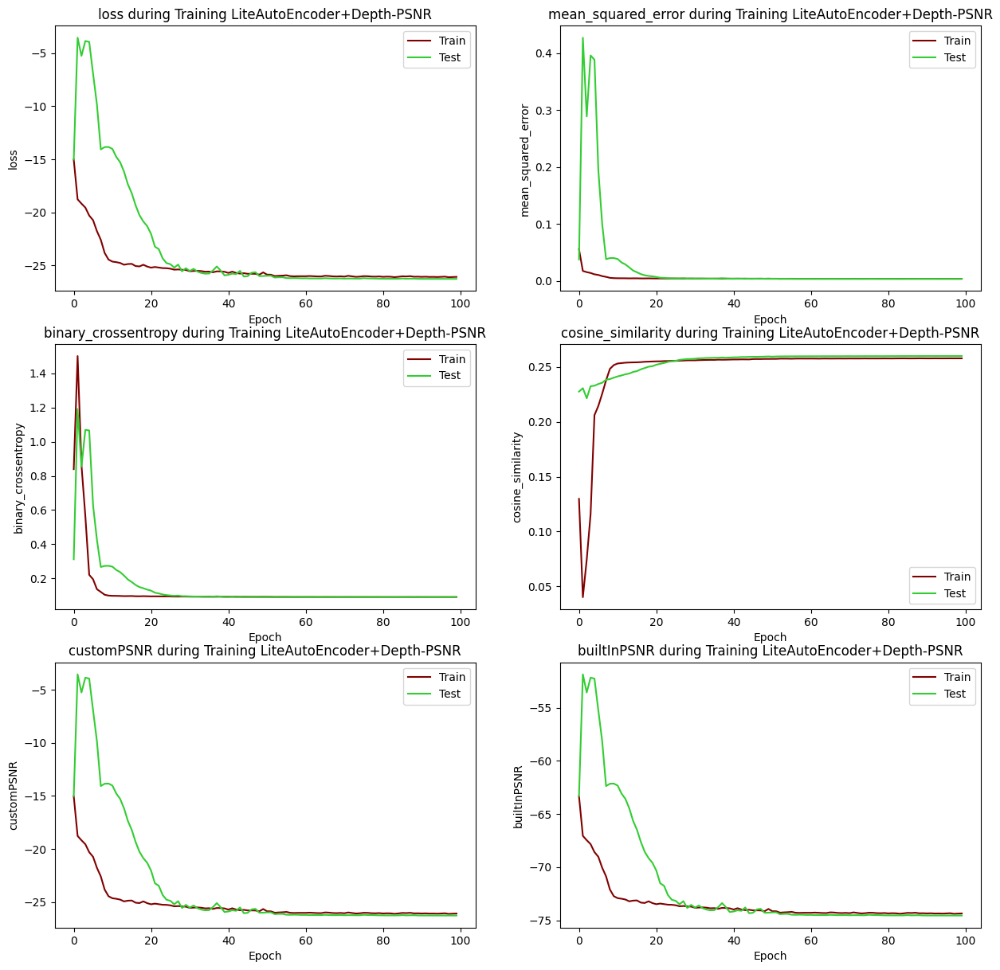

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


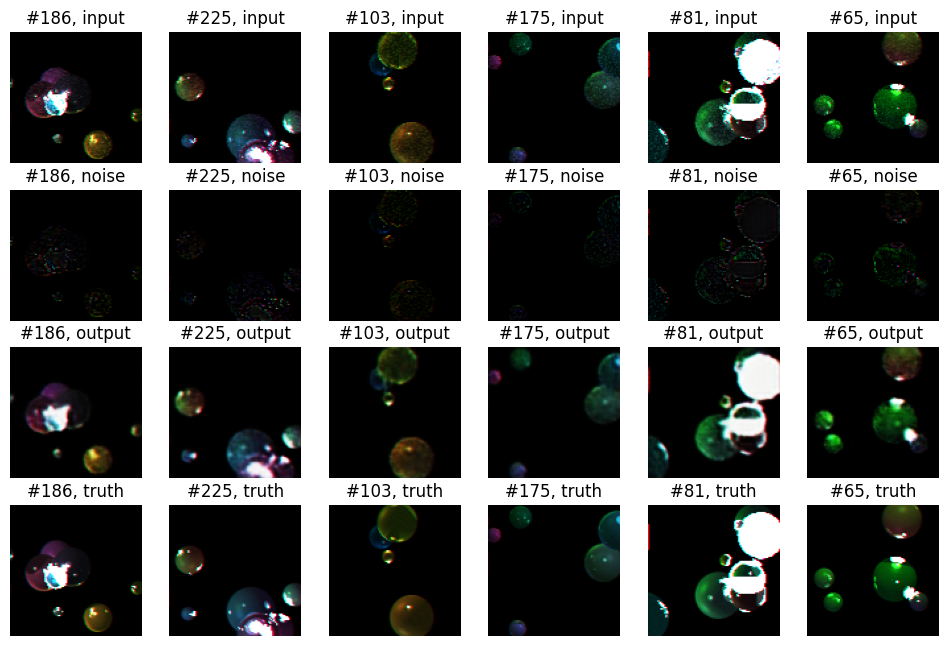

CPU times: total: 3min 1s
Wall time: 2min 7s


In [4]:
%%time

# Simple Auto-encoder for testing purposes
# Takes as input images with depth
# Not as interesting as FCNN and DnCNNs to come, but interesting

# Sorry for spoilers, but PSNR as loss works slightly better than MSE, so we will use this for our autoencoders
# This is demonstrated later in the notebook, but I decided to move autoencoders to the start
# as they do not perform as well ad DnCNN/FCNN (Deep network CNN or Full CNN)

def LiteAutoEncoderPlusDepth(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    # Create Layer Conv1
    model.add(
        tf.keras.layers.Conv2D(
                filters = 128,
                kernel_size = (3,3),
                activation = 'relu',
                padding = 'same',
                input_shape = (100,100,4),
                name = 'Conv1'
              )
    )
    
    model.add(tf.keras.layers.BatchNormalization())
    
    # Create Layer Pool1
    model.add(
        tf.keras.layers.MaxPool2D(
                pool_size=(2,2),
                name = 'Pool1'
                )
    )
    
    # Create Layer Conv2
    model.add(
        tf.keras.layers.Conv2D(
                filters = 128,
                kernel_size = (3,3),
                activation = 'relu',
                padding = 'same',
                name = 'Conv2'
              )
    )
    
    model.add(tf.keras.layers.BatchNormalization())
    
    # Create Layer Pool2
    model.add(
        tf.keras.layers.MaxPool2D( 
                pool_size=(2,2),
                name = 'Pool2'
                )
    )
    
    
    # DECODE
    
    model.add(
        tf.keras.layers.Conv2DTranspose(
            
            filters = 128,
            kernel_size = (3,3),
            strides = (2,2),
            padding = 'same',
            name = "ConvTranspose1"
            )
    )
    
    model.add(
        tf.keras.layers.Conv2DTranspose(
            
            filters = 128,
            kernel_size = (3,3),
            strides = (2,2),
            padding = 'same',
            name = "ConvTranspose2"
            )
    )
    
    
   
    
   # Create Layer Conv4
    model.add(
        tf.keras.layers.Conv2D(
                filters = 3,
                kernel_size = (3,3),
                activation = 'sigmoid',
                padding = 'same',
                name = 'Conv4'
              )
    )
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = LiteAutoEncoderPlusDepth(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )


# Define both x and y for training and test sets
test_size = 750

# For this setup, x is the noisy image and y is the 'noiseless' image
# Alternatively, you can set y as the residual noise, by subtracting the input from the noiseless image
x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'LiteAutoEncoder+Depth-PSNR', epochs = 100, batch_size = 32)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 EncodeConv1 (Conv2D)        (None, 100, 100, 128)     4736      
                                                                 
 batch_normalization_3 (Batc  (None, 100, 100, 128)    512       
 hNormalization)                                                 
                                                                 
 EncodePool1 (MaxPooling2D)  (None, 50, 50, 128)       0         
                                                                 
 EncodeConv2 (Conv2D)        (None, 50, 50, 64)        73792     
                                                                 
 batch_normalization_4 (Batc  (None, 50, 50, 64)       256       
 hNormalization)                                                 
                                                                 
 EncodePool2 (MaxPooling2D)  (None, 25, 25, 64)       

Epoch 14/100
24/24 [==============================] - 2s 75ms/step - loss: 0.1012 - mean_squared_error: 0.0074 - binary_crossentropy: 0.1012 - cosine_similarity: 0.2365 - customPSNR: -22.5156 - builtInPSNR: -70.8024 - val_loss: 0.1139 - val_mean_squared_error: 0.0109 - val_binary_crossentropy: 0.1139 - val_cosine_similarity: 0.2357 - val_customPSNR: -21.1697 - val_builtInPSNR: -69.4635 - lr: 0.0010
Epoch 15/100
24/24 [==============================] - 2s 78ms/step - loss: 0.1022 - mean_squared_error: 0.0077 - binary_crossentropy: 0.1022 - cosine_similarity: 0.2374 - customPSNR: -22.3243 - builtInPSNR: -70.6111 - val_loss: 0.1106 - val_mean_squared_error: 0.0093 - val_binary_crossentropy: 0.1106 - val_cosine_similarity: 0.2353 - val_customPSNR: -21.6405 - val_builtInPSNR: -69.9343 - lr: 0.0010
Epoch 16/100
24/24 [==============================] - 2s 76ms/step - loss: 0.1011 - mean_squared_error: 0.0073 - binary_crossentropy: 0.1011 - cosine_similarity: 0.2393 - customPSNR: -22.5765 - bu

Epoch 34/100
24/24 [==============================] - 2s 70ms/step - loss: 0.0933 - mean_squared_error: 0.0052 - binary_crossentropy: 0.0933 - cosine_similarity: 0.2558 - customPSNR: -24.3935 - builtInPSNR: -72.6802 - val_loss: 0.0934 - val_mean_squared_error: 0.0052 - val_binary_crossentropy: 0.0934 - val_cosine_similarity: 0.2583 - val_customPSNR: -24.5366 - val_builtInPSNR: -72.8304 - lr: 1.0000e-04
Epoch 35/100
24/24 [==============================] - 2s 76ms/step - loss: 0.0926 - mean_squared_error: 0.0050 - binary_crossentropy: 0.0926 - cosine_similarity: 0.2567 - customPSNR: -24.6182 - builtInPSNR: -72.9050 - val_loss: 0.0933 - val_mean_squared_error: 0.0052 - val_binary_crossentropy: 0.0933 - val_cosine_similarity: 0.2581 - val_customPSNR: -24.5579 - val_builtInPSNR: -72.8517 - lr: 1.0000e-04
Epoch 36/100
24/24 [==============================] - 2s 70ms/step - loss: 0.0925 - mean_squared_error: 0.0049 - binary_crossentropy: 0.0925 - cosine_similarity: 0.2568 - customPSNR: -24.6

Epoch 53/100
24/24 [==============================] - 2s 69ms/step - loss: 0.0921 - mean_squared_error: 0.0048 - binary_crossentropy: 0.0921 - cosine_similarity: 0.2572 - customPSNR: -24.7343 - builtInPSNR: -73.0210 - val_loss: 0.0930 - val_mean_squared_error: 0.0051 - val_binary_crossentropy: 0.0930 - val_cosine_similarity: 0.2592 - val_customPSNR: -24.6461 - val_builtInPSNR: -72.9399 - lr: 1.0000e-06
Epoch 54/100
24/24 [==============================] - 2s 67ms/step - loss: 0.0922 - mean_squared_error: 0.0048 - binary_crossentropy: 0.0922 - cosine_similarity: 0.2572 - customPSNR: -24.7239 - builtInPSNR: -73.0107 - val_loss: 0.0930 - val_mean_squared_error: 0.0051 - val_binary_crossentropy: 0.0930 - val_cosine_similarity: 0.2592 - val_customPSNR: -24.6459 - val_builtInPSNR: -72.9397 - lr: 1.0000e-06
Epoch 55/100
24/24 [==============================] - 2s 68ms/step - loss: 0.0922 - mean_squared_error: 0.0048 - binary_crossentropy: 0.0922 - cosine_similarity: 0.2572 - customPSNR: -24.6

Epoch 72/100
23/24 [===========================>..] - ETA: 0s - loss: 0.0921 - mean_squared_error: 0.0048 - binary_crossentropy: 0.0921 - cosine_similarity: 0.2572 - customPSNR: -24.7385 - builtInPSNR: -73.0283
Epoch 72: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-09.
24/24 [==============================] - 2s 70ms/step - loss: 0.0922 - mean_squared_error: 0.0048 - binary_crossentropy: 0.0922 - cosine_similarity: 0.2572 - customPSNR: -24.7227 - builtInPSNR: -73.0094 - val_loss: 0.0930 - val_mean_squared_error: 0.0051 - val_binary_crossentropy: 0.0930 - val_cosine_similarity: 0.2592 - val_customPSNR: -24.6461 - val_builtInPSNR: -72.9399 - lr: 1.0000e-08
Epoch 73/100
24/24 [==============================] - 2s 68ms/step - loss: 0.0922 - mean_squared_error: 0.0049 - binary_crossentropy: 0.0922 - cosine_similarity: 0.2572 - customPSNR: -24.6965 - builtInPSNR: -72.9833 - val_loss: 0.0930 - val_mean_squared_error: 0.0051 - val_binary_crossentropy: 0.0930 - val_cosine_simi

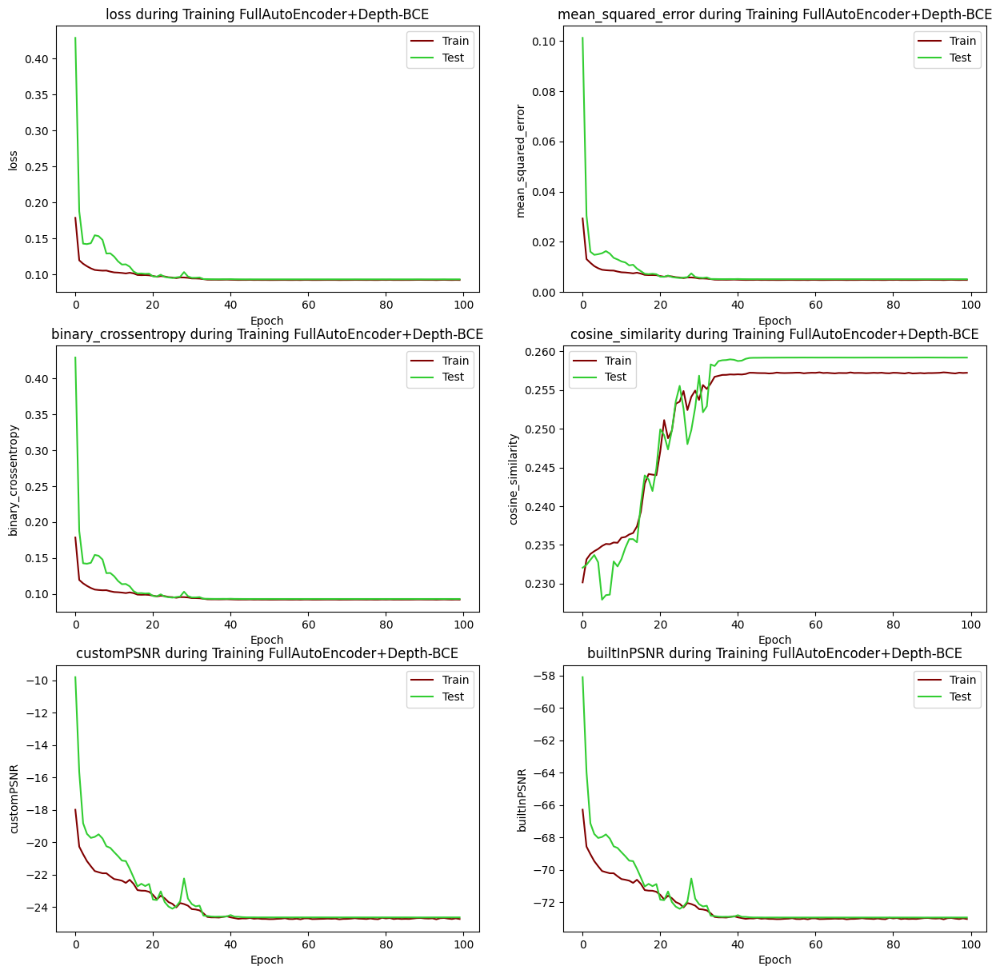

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


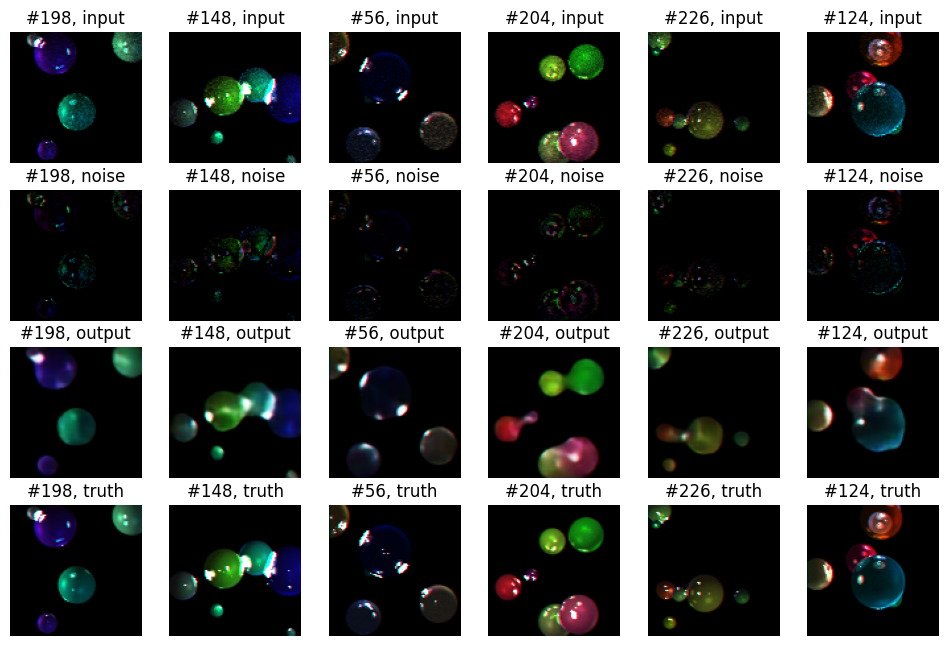

CPU times: total: 3min 40s
Wall time: 2min 48s


In [5]:
%%time

# More Complex Autoencoder
# Inspired by Week 13 A Lecture
# However, this is much deeper

# For some reason, this network only learns with Binary Cross Entropy
# This loss function was recommended in lecture for denoising with auto encoders
# If a different loss is used, the model fails to learn anything.
# This is a one-off scenario; in general, PSNR is the best loss for this application



def FullAutoEncoderPlusDepth(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    model.add(
        tf.keras.layers.Conv2D(
                filters = 128,
                kernel_size = (3,3),
                activation = 'relu',
                padding = 'same',
                input_shape = (100,100,4),
                name = 'EncodeConv1'
              )
    )
    
    model.add(tf.keras.layers.BatchNormalization())
    
    model.add(
        tf.keras.layers.MaxPool2D(
                pool_size=(2,2),
                padding = 'same',
                name = 'EncodePool1'
                )
    )
    
    model.add(
        tf.keras.layers.Conv2D(
                filters = 64,
                kernel_size = (3,3),
                activation = 'relu',
                padding = 'same',
                name = 'EncodeConv2'
              )
    )
    
    model.add(tf.keras.layers.BatchNormalization())
    
    model.add(
        tf.keras.layers.MaxPool2D( 
                pool_size=(2,2),
                padding = 'same',
                name = 'EncodePool2'
                )
    )
    
    model.add(
        tf.keras.layers.Conv2D(
                filters = 64,
                kernel_size = (3,3),
                activation = 'relu',
                padding = 'same',
                name = 'EncodeConv3'
              )
    )
    
    model.add(tf.keras.layers.BatchNormalization())
    
    model.add(
        tf.keras.layers.MaxPool2D( 
                pool_size=(2,2),
                padding = 'same',
                name = 'EncodePool3'
                )
    )
    
    model.add(
        tf.keras.layers.Conv2D(
                filters = 64,
                kernel_size = (3,3),
                activation = 'relu',
                padding = 'same',
                name = 'EncodeConv4'
              )
    )
    
    
    # DECODE
    
    
    model.add(
        tf.keras.layers.Conv2D(
                filters = 64,
                kernel_size = (3,3),
                activation = 'relu',
                padding = 'same',
                name = 'DecodeConv1'
              )
    )
    
    model.add(
        tf.keras.layers.UpSampling2D(
            size = 2,
            name = "Upsampling1"
        )
    )
    
    
    
    
    model.add(
        tf.keras.layers.Conv2D(
                filters = 64,
                kernel_size = (3,3),
                activation = 'relu',
                padding = 'same',
                name = 'DecodeConv2'
              )
    )
    
    model.add(
        tf.keras.layers.UpSampling2D(
            size = 2,
            name = "Upsampling2"
        )
    )
    
    model.add(
        tf.keras.layers.Conv2D(
                filters = 128,
                kernel_size = (3,3),
                activation = 'relu',
                padding = 'same',
                name = 'DecodeConv3'
              )
    )
    
    model.add(
        tf.keras.layers.UpSampling2D(
            size = 2,
            name = "Upsampling3"
        )
    )
    
    model.add(
        tf.keras.layers.Conv2D(
                filters = 128,
                kernel_size = (3,3),
                activation = 'relu',
                name = 'DecodeConv4'
              )
    )
    
    # Output layer
    model.add(
        tf.keras.layers.Conv2D(
                filters = 3,
                kernel_size = (3,3),
                activation = 'sigmoid',
                name = 'OutputLayer'
              )
    )
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = FullAutoEncoderPlusDepth(loss = 'binary_crossentropy', # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )


# Define both x and y for training and test sets
test_size = 750

# For this setup, x is the noisy image and y is the 'noiseless' image
# Alternatively, you can set y as the residual noise, by subtracting the input from the noiseless image
x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'FullAutoEncoder+Depth-BCE', epochs = 100, batch_size = 32)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      1792      
                                                                 
 conv0 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv1 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/100
24/24 [==============================] - 2s 67ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - binary_crossentropy: 0.1183 - cosine_similarity: 0.2157 - customPSNR: -25.3301 - builtInPSNR: -73.6169 - val_loss: 0.0142 - val_mean_squared_error: 0.0142 - val_binary_crossentropy: 0.2806 - val_cosine_similarity: 0.1193 - val_customPSNR: -19.6083 - val_builtInPSNR: -67.9020 - lr: 0.0010
Epoch 15/100
24/24 [==============================] - 2s 67ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - binary_crossentropy: 0.1142 - cosine_similarity: 0.2205 - customPSNR: -25.4998 - builtInPSNR: -73.7865 - val_loss: 0.0132 - val_mean_squared_error: 0.0132 - val_binary_crossentropy: 0.2338 - val_cosine_similarity: 0.1502 - val_customPSNR: -20.0184 - val_builtInPSNR: -68.3122 - lr: 0.0010
Epoch 16/100
24/24 [==============================] - 2s 69ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - binary_crossentropy: 0.1165 - cosine_similarity: 0.2165 - customPSNR: -25.5916 - bu

Epoch 53/100
24/24 [==============================] - 2s 65ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0930 - cosine_similarity: 0.2458 - customPSNR: -27.1161 - builtInPSNR: -75.4029 - val_loss: 0.0026 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0917 - val_cosine_similarity: 0.2494 - val_customPSNR: -27.6609 - val_builtInPSNR: -75.9547 - lr: 1.0000e-05
Epoch 54/100
24/24 [==============================] - 2s 63ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0936 - cosine_similarity: 0.2451 - customPSNR: -27.0450 - builtInPSNR: -75.3318 - val_loss: 0.0026 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0918 - val_cosine_similarity: 0.2492 - val_customPSNR: -27.6668 - val_builtInPSNR: -75.9606 - lr: 1.0000e-05
Epoch 55/100
23/24 [===========================>..] - ETA: 0s - loss: 0.0028 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0935 - cosine_similarity: 0.2450 - customPSNR: -27.0662 -

Epoch 90/100
24/24 [==============================] - ETA: 0s - loss: 0.0028 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0929 - cosine_similarity: 0.2458 - customPSNR: -27.1411 - builtInPSNR: -75.4279
Epoch 90: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-11.
24/24 [==============================] - 2s 65ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0929 - cosine_similarity: 0.2458 - customPSNR: -27.1411 - builtInPSNR: -75.4279 - val_loss: 0.0026 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0916 - val_cosine_similarity: 0.2494 - val_customPSNR: -27.6657 - val_builtInPSNR: -75.9595 - lr: 1.0000e-10
Epoch 91/100
24/24 [==============================] - 2s 64ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0931 - cosine_similarity: 0.2456 - customPSNR: -27.0812 - builtInPSNR: -75.3680 - val_loss: 0.0026 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0916 - val_cosine_simi

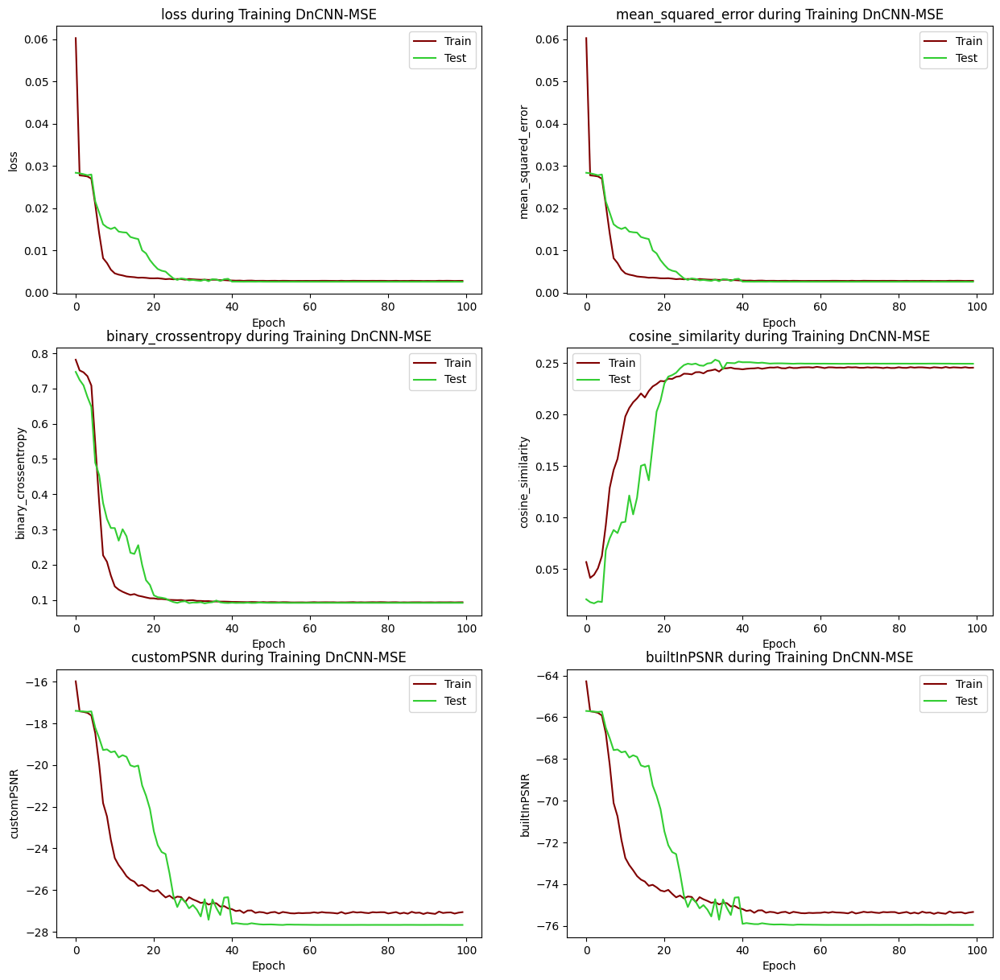

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

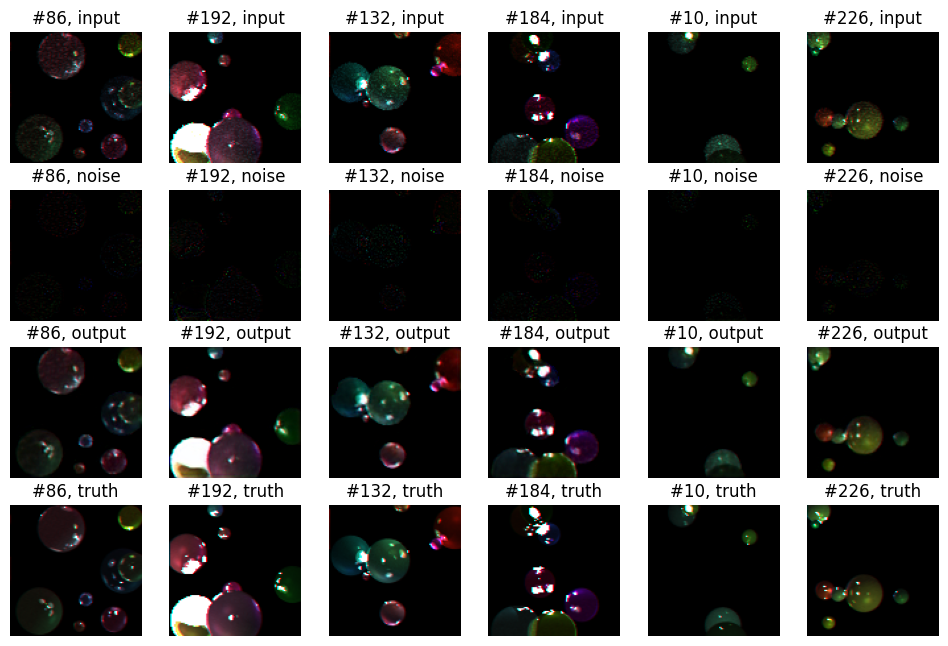

CPU times: total: 3min 32s
Wall time: 2min 40s


In [4]:
%%time

# Model based roughly on DnCNN model proposed in paper:
# "Beyond a Gaussian Denoiser: Residual Learning of Deep CNN for Image Denoising"
# by Zhang, et al.

# The main differences are that 15 fewer convolution layers are used (not actually needed)
# And each hidden convolution layer is of the format conv -> relu -> batch norm -> relu
# Versus the proposition in the paper, conv -> batch norm -> relu

# Additionally, the loss function here is MSE, not PSNR

# Note that this model does not take depth into account
def DnCNNMSE(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 3D pixels (Traditional RGB, no depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,3), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', activation = 'relu', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = DnCNNMSE(loss = 'mean_squared_error', # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )


# Define both x and y for training and test sets
test_size = 750

# For this setup, x is the noisy image and y is the 'noiseless' image
# Alternatively, you can set y as the residual noise, by subtracting the input from the noiseless image
x_train =x_set[:test_size][:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:][:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'DnCNN-MSE', epochs = 100, batch_size = 32)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 conv0 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv1 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/100
24/24 [==============================] - 2s 65ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - binary_crossentropy: 0.3461 - cosine_similarity: 0.1726 - customPSNR: -20.6684 - builtInPSNR: -68.9552 - val_loss: 0.0137 - val_mean_squared_error: 0.0137 - val_binary_crossentropy: 0.3310 - val_cosine_similarity: 0.1937 - val_customPSNR: -20.0086 - val_builtInPSNR: -68.3024 - lr: 0.0010
Epoch 15/100
24/24 [==============================] - 2s 64ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - binary_crossentropy: 0.3418 - cosine_similarity: 0.1758 - customPSNR: -20.6716 - builtInPSNR: -68.9584 - val_loss: 0.0138 - val_mean_squared_error: 0.0138 - val_binary_crossentropy: 0.3297 - val_cosine_similarity: 0.1899 - val_customPSNR: -19.9597 - val_builtInPSNR: -68.2535 - lr: 0.0010
Epoch 16/100
24/24 [==============================] - 2s 67ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - binary_crossentropy: 0.3334 - cosine_similarity: 0.1808 - customPSNR: -20.7573 - bu

Epoch 54/100
24/24 [==============================] - 2s 66ms/step - loss: 0.0032 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0983 - cosine_similarity: 0.2433 - customPSNR: -26.3180 - builtInPSNR: -74.6048 - val_loss: 0.0028 - val_mean_squared_error: 0.0028 - val_binary_crossentropy: 0.0931 - val_cosine_similarity: 0.2489 - val_customPSNR: -26.9621 - val_builtInPSNR: -75.2559 - lr: 1.0000e-04
Epoch 55/100
24/24 [==============================] - 2s 66ms/step - loss: 0.0031 - mean_squared_error: 0.0031 - binary_crossentropy: 0.0975 - cosine_similarity: 0.2438 - customPSNR: -26.4124 - builtInPSNR: -74.6992 - val_loss: 0.0028 - val_mean_squared_error: 0.0028 - val_binary_crossentropy: 0.0936 - val_cosine_similarity: 0.2484 - val_customPSNR: -27.1216 - val_builtInPSNR: -75.4154 - lr: 1.0000e-04
Epoch 56/100
24/24 [==============================] - 2s 66ms/step - loss: 0.0032 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0971 - cosine_similarity: 0.2439 - customPSNR: -26.3

Epoch 73/100
24/24 [==============================] - ETA: 0s - loss: 0.0031 - mean_squared_error: 0.0031 - binary_crossentropy: 0.0961 - cosine_similarity: 0.2451 - customPSNR: -26.5062 - builtInPSNR: -74.7930
Epoch 73: ReduceLROnPlateau reducing learning rate to 1.0000001111620805e-07.
24/24 [==============================] - 2s 64ms/step - loss: 0.0031 - mean_squared_error: 0.0031 - binary_crossentropy: 0.0961 - cosine_similarity: 0.2451 - customPSNR: -26.5062 - builtInPSNR: -74.7930 - val_loss: 0.0028 - val_mean_squared_error: 0.0028 - val_binary_crossentropy: 0.0926 - val_cosine_similarity: 0.2495 - val_customPSNR: -27.2013 - val_builtInPSNR: -75.4951 - lr: 1.0000e-06
Epoch 74/100
24/24 [==============================] - 2s 65ms/step - loss: 0.0031 - mean_squared_error: 0.0031 - binary_crossentropy: 0.0967 - cosine_similarity: 0.2444 - customPSNR: -26.4429 - builtInPSNR: -74.7297 - val_loss: 0.0028 - val_mean_squared_error: 0.0028 - val_binary_crossentropy: 0.0925 - val_cosine_sim

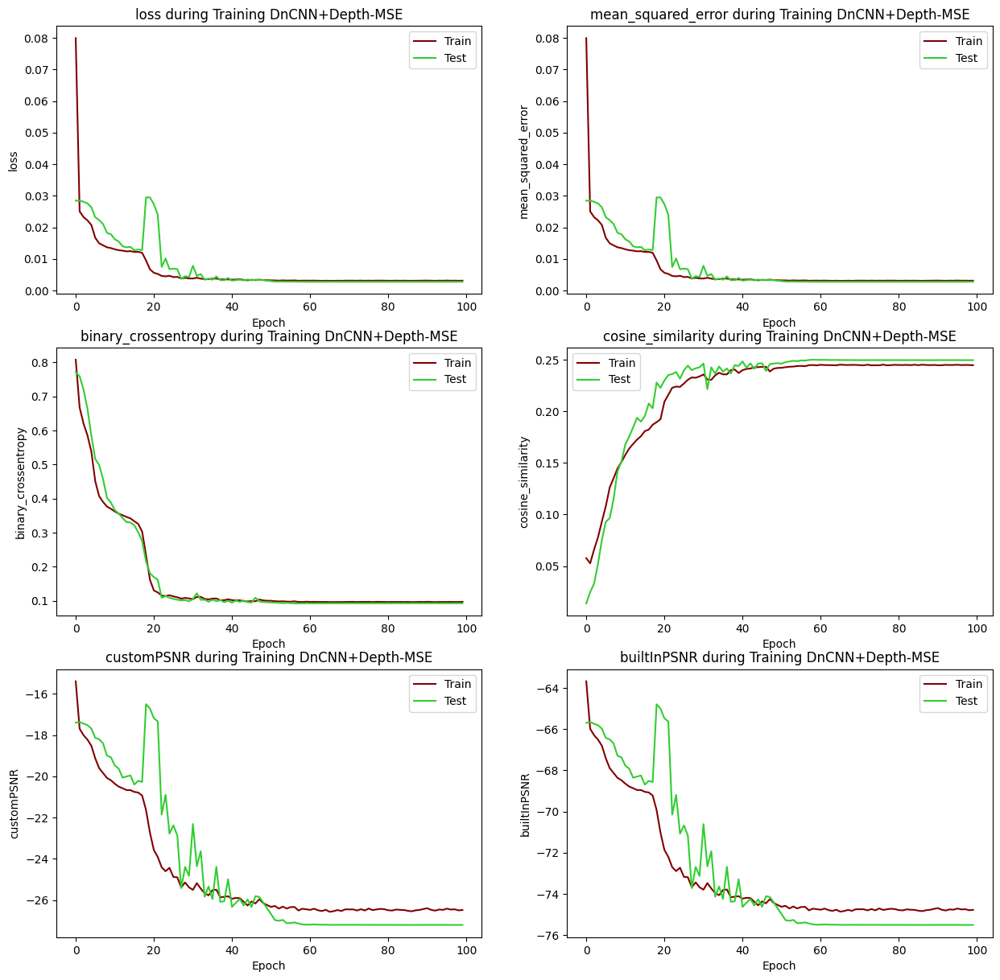

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


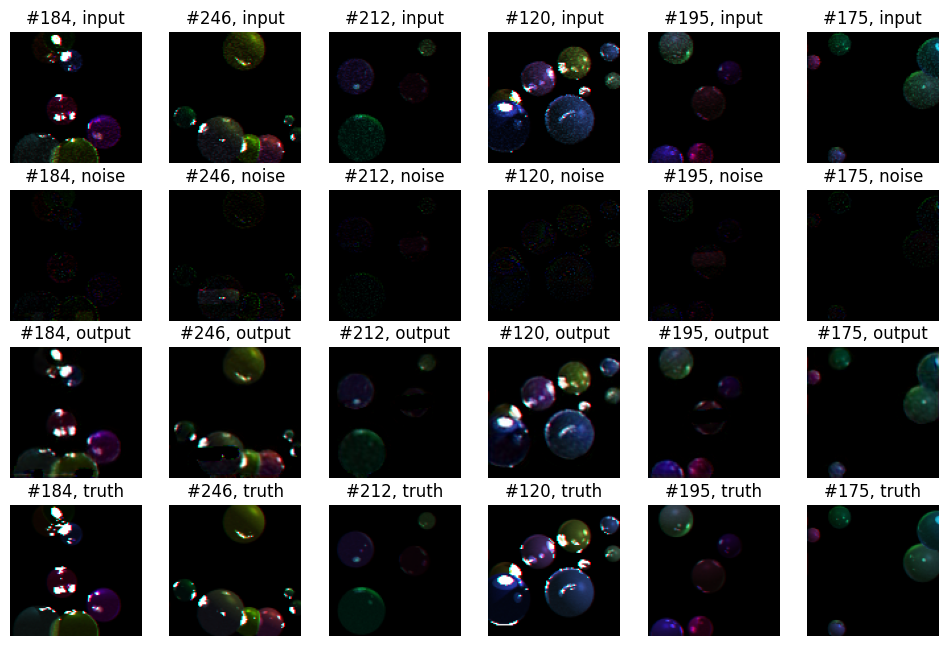

CPU times: total: 3min 34s
Wall time: 2min 40s


In [4]:
%%time

# Similar architecture to above network,
# However input image pixels are 4d in this case
# Each pixel has RGB, and Depth (provided by renderer)
# Additionally, the loss function here is MSE, not PSNR

def DnCNNPlusDepthMSE(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # Note, that pixels are 4d here (RGBD, where D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', activation = 'relu', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = DnCNNPlusDepthMSE(loss = 'mean_squared_error', # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'DnCNN+Depth-MSE', epochs = 100, batch_size = 32)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      1792      
                                                                 
 conv0 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv1 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/100
24/24 [==============================] - 2s 64ms/step - loss: -26.5946 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0930 - cosine_similarity: 0.2512 - customPSNR: -26.5946 - builtInPSNR: -74.8813 - val_loss: -21.4101 - val_mean_squared_error: 0.0096 - val_binary_crossentropy: 0.1160 - val_cosine_similarity: 0.2343 - val_customPSNR: -21.4101 - val_builtInPSNR: -69.7038 - lr: 0.0010
Epoch 15/100
24/24 [==============================] - 2s 65ms/step - loss: -26.6748 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0920 - cosine_similarity: 0.2516 - customPSNR: -26.6748 - builtInPSNR: -74.9616 - val_loss: -21.8628 - val_mean_squared_error: 0.0088 - val_binary_crossentropy: 0.1127 - val_cosine_similarity: 0.2332 - val_customPSNR: -21.8628 - val_builtInPSNR: -70.1566 - lr: 0.0010
Epoch 16/100
24/24 [==============================] - 1s 63ms/step - loss: -26.8415 - mean_squared_error: 0.0031 - binary_crossentropy: 0.0919 - cosine_similarity: 0.2519 - customPSNR: -26

24/24 [==============================] - 2s 63ms/step - loss: -27.7761 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0880 - cosine_similarity: 0.2557 - customPSNR: -27.7761 - builtInPSNR: -76.0629 - val_loss: -28.2968 - val_mean_squared_error: 0.0025 - val_binary_crossentropy: 0.0891 - val_cosine_similarity: 0.2594 - val_customPSNR: -28.2968 - val_builtInPSNR: -76.5906 - lr: 1.0000e-04
Epoch 54/100
24/24 [==============================] - 2s 63ms/step - loss: -27.8059 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0882 - cosine_similarity: 0.2555 - customPSNR: -27.8059 - builtInPSNR: -76.0927 - val_loss: -28.4641 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0868 - val_cosine_similarity: 0.2587 - val_customPSNR: -28.4641 - val_builtInPSNR: -76.7579 - lr: 1.0000e-04
Epoch 55/100
24/24 [==============================] - 1s 63ms/step - loss: -27.7935 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0883 - cosine_similarity: 0.2556 - customPSNR: -27.7935

Epoch 91/100
24/24 [==============================] - 1s 63ms/step - loss: -28.0013 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0876 - cosine_similarity: 0.2558 - customPSNR: -28.0013 - builtInPSNR: -76.2880 - val_loss: -28.4965 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0867 - val_cosine_similarity: 0.2584 - val_customPSNR: -28.4965 - val_builtInPSNR: -76.7903 - lr: 1.0000e-07
Epoch 92/100
24/24 [==============================] - ETA: 0s - loss: -27.9389 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0878 - cosine_similarity: 0.2558 - customPSNR: -27.9389 - builtInPSNR: -76.2257
Epoch 92: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-08.
24/24 [==============================] - 2s 63ms/step - loss: -27.9389 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0878 - cosine_similarity: 0.2558 - customPSNR: -27.9389 - builtInPSNR: -76.2257 - val_loss: -28.4968 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0867 - val_c

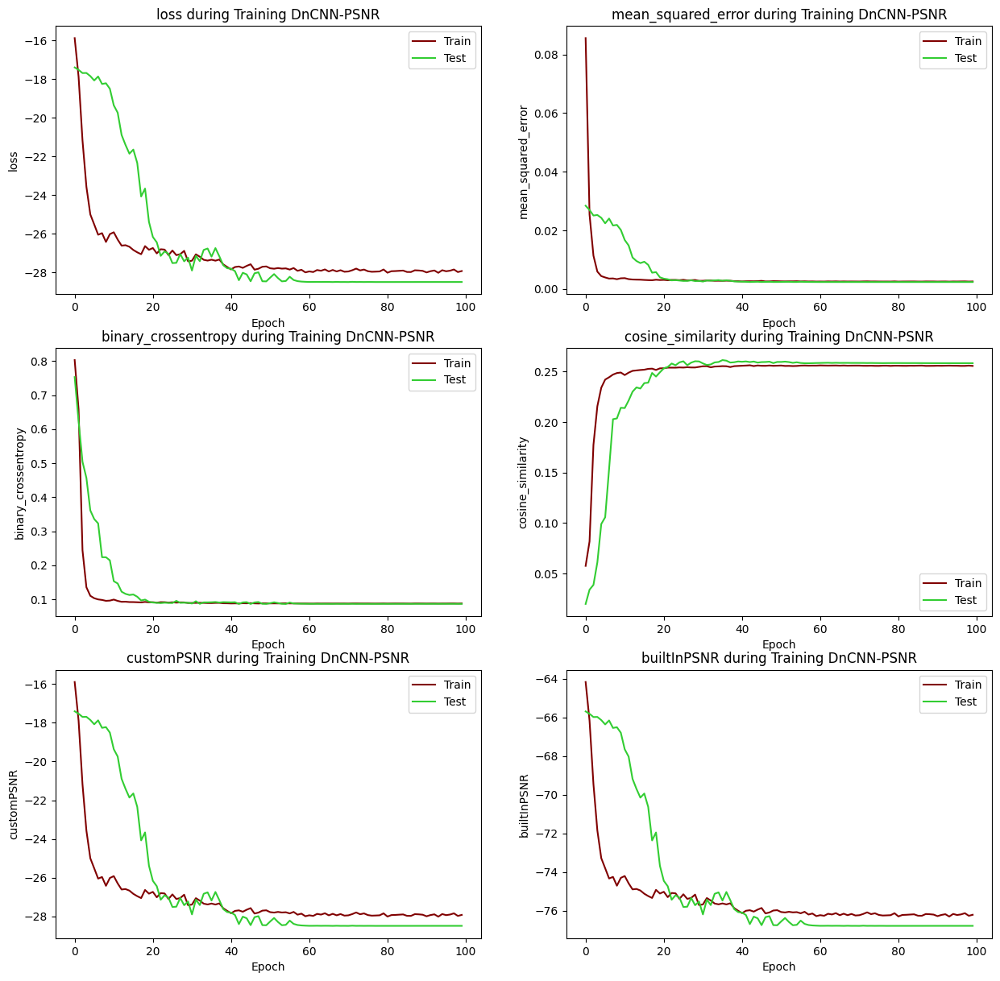

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

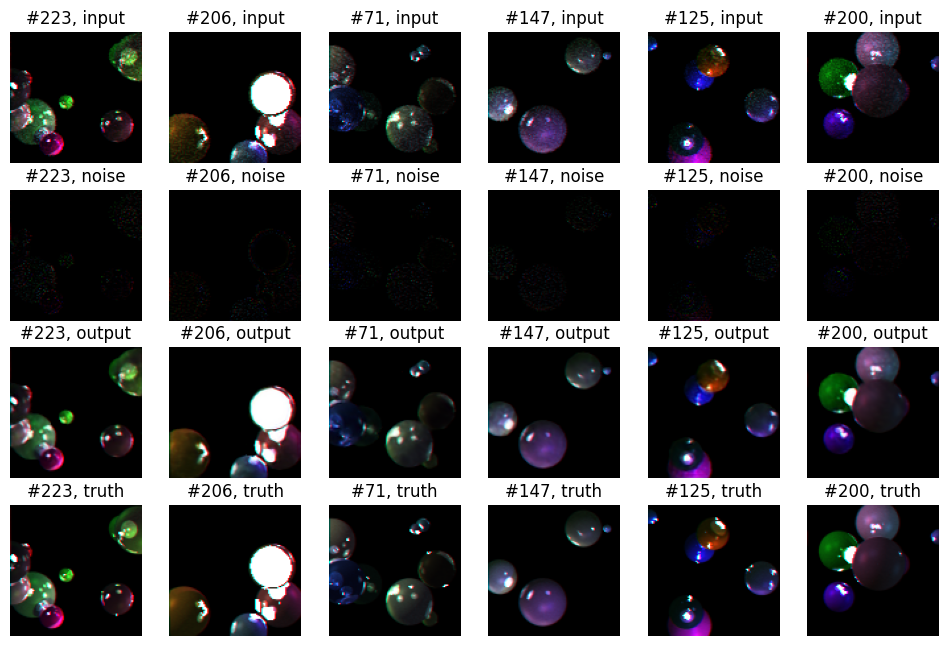

CPU times: total: 3min 41s
Wall time: 2min 39s


In [4]:
%%time

# Similar structure to above networks
# 3D pixels (No depth included)
# Diference is loss function is my custom tensor-PSNR function

def DnCNNPSNR(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 3D pixels (Traditional RGB, no depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,3), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution 'layers' without bias
    #    Includes batch normalization and additional ReLU after
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', activation = 'relu', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = DnCNNPSNR(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size][:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:][:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'DnCNN-PSNR', epochs = 100, batch_size = 32)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 conv0 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv1 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/100
24/24 [==============================] - 2s 65ms/step - loss: -26.1473 - mean_squared_error: 0.0035 - binary_crossentropy: 0.0952 - cosine_similarity: 0.2487 - customPSNR: -26.1473 - builtInPSNR: -74.4341 - val_loss: -25.4737 - val_mean_squared_error: 0.0043 - val_binary_crossentropy: 0.0946 - val_cosine_similarity: 0.2548 - val_customPSNR: -25.4737 - val_builtInPSNR: -73.7675 - lr: 0.0010
Epoch 15/100
24/24 [==============================] - 2s 71ms/step - loss: -26.3313 - mean_squared_error: 0.0033 - binary_crossentropy: 0.0932 - cosine_similarity: 0.2492 - customPSNR: -26.3313 - builtInPSNR: -74.6181 - val_loss: -26.5758 - val_mean_squared_error: 0.0031 - val_binary_crossentropy: 0.0920 - val_cosine_similarity: 0.2526 - val_customPSNR: -26.5758 - val_builtInPSNR: -74.8696 - lr: 0.0010
Epoch 16/100
24/24 [==============================] - 2s 64ms/step - loss: -26.6511 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0919 - cosine_similarity: 0.2507 - customPSNR: -26

24/24 [==============================] - 2s 69ms/step - loss: -27.3675 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0887 - cosine_similarity: 0.2539 - customPSNR: -27.3675 - builtInPSNR: -75.6543 - val_loss: -28.1281 - val_mean_squared_error: 0.0025 - val_binary_crossentropy: 0.0869 - val_cosine_similarity: 0.2572 - val_customPSNR: -28.1281 - val_builtInPSNR: -76.4219 - lr: 1.0000e-04
Epoch 54/100
24/24 [==============================] - 2s 64ms/step - loss: -27.2964 - mean_squared_error: 0.0029 - binary_crossentropy: 0.0890 - cosine_similarity: 0.2542 - customPSNR: -27.2964 - builtInPSNR: -75.5832 - val_loss: -28.1260 - val_mean_squared_error: 0.0025 - val_binary_crossentropy: 0.0869 - val_cosine_similarity: 0.2563 - val_customPSNR: -28.1260 - val_builtInPSNR: -76.4198 - lr: 1.0000e-04
Epoch 55/100
24/24 [==============================] - 2s 64ms/step - loss: -27.4126 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0887 - cosine_similarity: 0.2540 - customPSNR: -27.4126

24/24 [==============================] - 2s 64ms/step - loss: -27.4613 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2542 - customPSNR: -27.4613 - builtInPSNR: -75.7481 - val_loss: -28.1672 - val_mean_squared_error: 0.0025 - val_binary_crossentropy: 0.0870 - val_cosine_similarity: 0.2577 - val_customPSNR: -28.1672 - val_builtInPSNR: -76.4610 - lr: 1.0000e-04
Epoch 74/100
24/24 [==============================] - 2s 68ms/step - loss: -27.6071 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0879 - cosine_similarity: 0.2548 - customPSNR: -27.6071 - builtInPSNR: -75.8939 - val_loss: -28.0953 - val_mean_squared_error: 0.0025 - val_binary_crossentropy: 0.0867 - val_cosine_similarity: 0.2577 - val_customPSNR: -28.0953 - val_builtInPSNR: -76.3891 - lr: 1.0000e-04
Epoch 75/100
24/24 [==============================] - 2s 68ms/step - loss: -27.5870 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0884 - cosine_similarity: 0.2544 - customPSNR: -27.5870

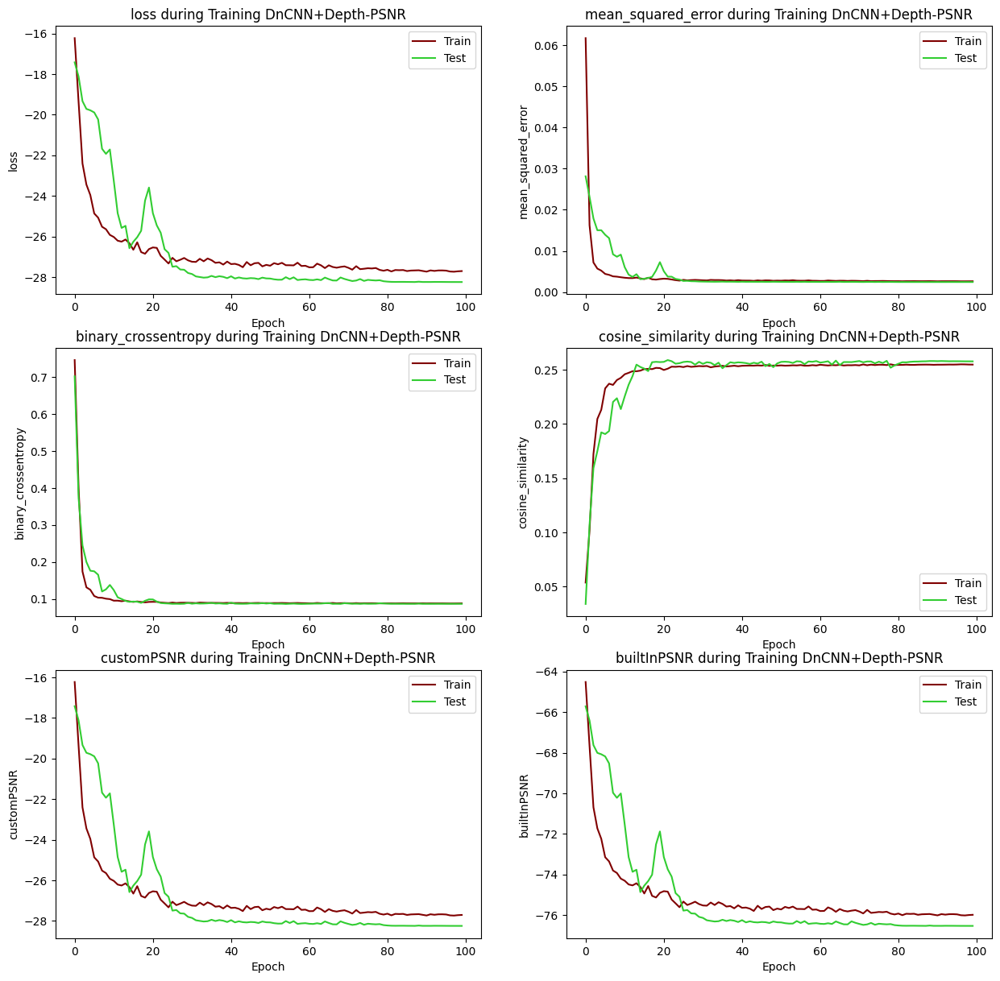

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

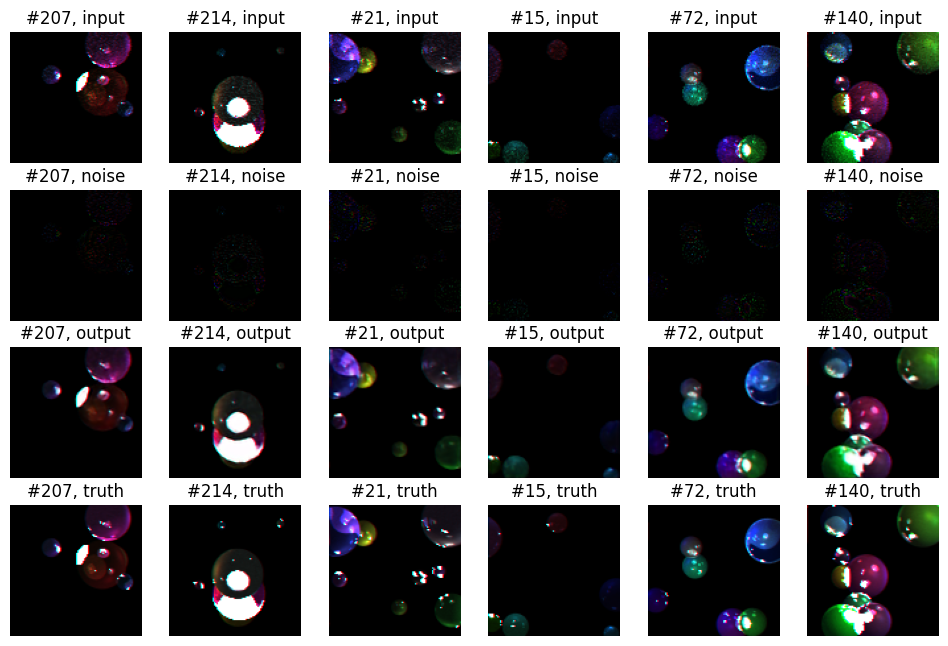

CPU times: total: 3min 27s
Wall time: 2min 51s


In [4]:
%%time

# Similar structure to above networks
# 4D pixels (Depth included)
# Loss function is my custom tensor-PSNR function

# This model actually performs the best out of all initial architectures!

def DnCNNPlusDepthPSNR(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution 'layers' without bias
    #    Includes batch normalization and additional ReLU after
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', activation = 'relu', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = DnCNNPlusDepthPSNR(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'DnCNN+Depth-PSNR', epochs = 100, batch_size = 32)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 conv0 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv1 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/100
24/24 [==============================] - 2s 66ms/step - loss: -21.1536 - mean_squared_error: 0.0116 - binary_crossentropy: 0.3256 - cosine_similarity: 0.1896 - customPSNR: -21.1536 - builtInPSNR: -69.4403 - val_loss: -21.3072 - val_mean_squared_error: 0.0116 - val_binary_crossentropy: 0.3257 - val_cosine_similarity: 0.1924 - val_customPSNR: -21.3072 - val_builtInPSNR: -69.6010 - lr: 0.0010
Epoch 15/100
24/24 [==============================] - 2s 71ms/step - loss: -21.2227 - mean_squared_error: 0.0115 - binary_crossentropy: 0.3235 - cosine_similarity: 0.1914 - customPSNR: -21.2227 - builtInPSNR: -69.5094 - val_loss: -21.3152 - val_mean_squared_error: 0.0115 - val_binary_crossentropy: 0.3235 - val_cosine_similarity: 0.1962 - val_customPSNR: -21.3152 - val_builtInPSNR: -69.6089 - lr: 0.0010
Epoch 16/100
24/24 [==============================] - 2s 63ms/step - loss: -21.1774 - mean_squared_error: 0.0116 - binary_crossentropy: 0.3260 - cosine_similarity: 0.1890 - customPSNR: -21

24/24 [==============================] - 2s 66ms/step - loss: -27.7434 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0875 - cosine_similarity: 0.2565 - customPSNR: -27.7434 - builtInPSNR: -76.0302 - val_loss: -28.1696 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0856 - val_cosine_similarity: 0.2609 - val_customPSNR: -28.1696 - val_builtInPSNR: -76.4634 - lr: 1.0000e-04
Epoch 54/100
24/24 [==============================] - 2s 65ms/step - loss: -27.6219 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0878 - cosine_similarity: 0.2567 - customPSNR: -27.6219 - builtInPSNR: -75.9087 - val_loss: -28.2163 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0855 - val_cosine_similarity: 0.2610 - val_customPSNR: -28.2163 - val_builtInPSNR: -76.5101 - lr: 1.0000e-04
Epoch 55/100
24/24 [==============================] - 2s 65ms/step - loss: -27.4895 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0884 - cosine_similarity: 0.2559 - customPSNR: -27.4895

24/24 [==============================] - 2s 64ms/step - loss: -27.7231 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0875 - cosine_similarity: 0.2567 - customPSNR: -27.7231 - builtInPSNR: -76.0099 - val_loss: -28.3367 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0863 - val_cosine_similarity: 0.2602 - val_customPSNR: -28.3367 - val_builtInPSNR: -76.6305 - lr: 1.0000e-04
Epoch 74/100
24/24 [==============================] - 2s 66ms/step - loss: -27.7391 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0874 - cosine_similarity: 0.2571 - customPSNR: -27.7391 - builtInPSNR: -76.0259 - val_loss: -28.3298 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0862 - val_cosine_similarity: 0.2607 - val_customPSNR: -28.3298 - val_builtInPSNR: -76.6236 - lr: 1.0000e-04
Epoch 75/100
24/24 [==============================] - 1s 59ms/step - loss: -27.6249 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0877 - cosine_similarity: 0.2566 - customPSNR: -27.6249

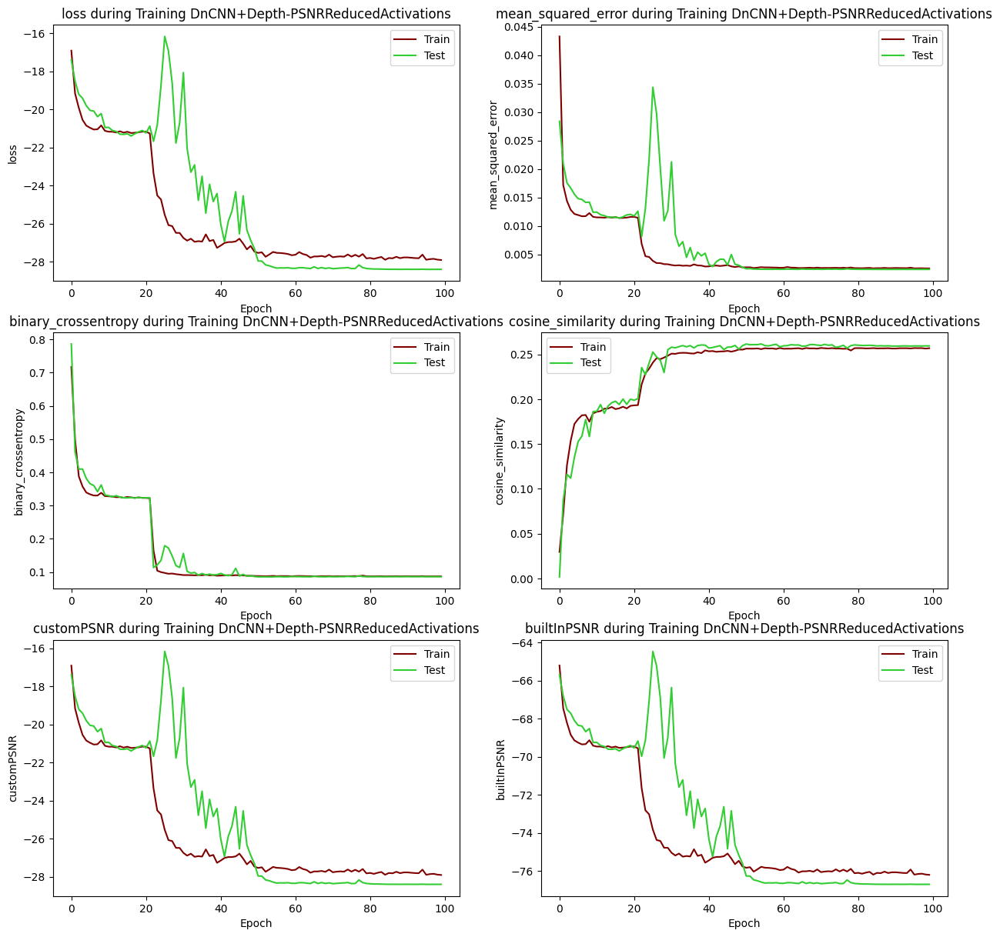

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

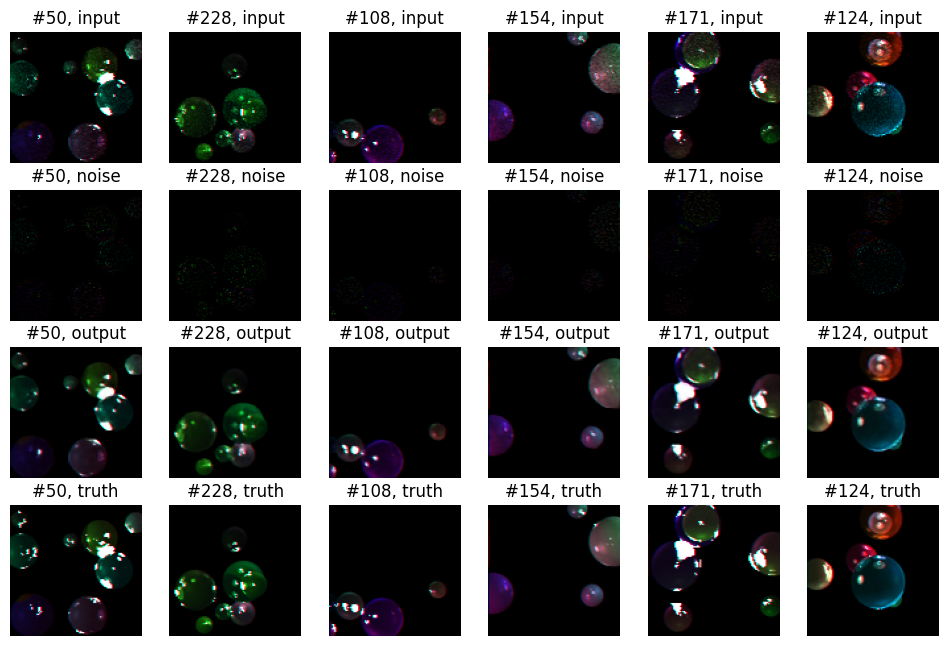

CPU times: total: 3min 16s
Wall time: 2min 41s


In [4]:
%%time

# Model based closer on DnCNN model proposed in paper:
# "Beyond a Gaussian Denoiser: Residual Learning of Deep CNN for Image Denoising"
# by Zhang, et al.

# Unlike above methods, the conv2d layer has no activation
# Thus, the hidden layer structure is conv -> bn -> relu

# This model performs okay, but versions with additional activation layer perform marginally better



def DnCNNPlusDepthPSNRReducedActivationCount(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = DnCNNPlusDepthPSNRReducedActivationCount(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'DnCNN+Depth-PSNRReducedActivations', epochs = 100, batch_size = 32)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      1792      
                                                                 
 conv0 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv1 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/100
24/24 [==============================] - 1s 63ms/step - loss: 0.1254 - mean_squared_error: 0.0131 - binary_crossentropy: 0.1254 - cosine_similarity: 0.2218 - customPSNR: -20.2763 - builtInPSNR: -68.5631 - val_loss: 0.1471 - val_mean_squared_error: 0.0128 - val_binary_crossentropy: 0.1471 - val_cosine_similarity: 0.2281 - val_customPSNR: -19.7894 - val_builtInPSNR: -68.0832 - lr: 0.0010
Epoch 15/100
24/24 [==============================] - 2s 63ms/step - loss: 0.1709 - mean_squared_error: 0.0156 - binary_crossentropy: 0.1709 - cosine_similarity: 0.2193 - customPSNR: -20.0899 - builtInPSNR: -68.3767 - val_loss: 0.1480 - val_mean_squared_error: 0.0141 - val_binary_crossentropy: 0.1480 - val_cosine_similarity: 0.2264 - val_customPSNR: -19.7636 - val_builtInPSNR: -68.0574 - lr: 0.0010
Epoch 16/100
24/24 [==============================] - 2s 63ms/step - loss: 0.1226 - mean_squared_error: 0.0136 - binary_crossentropy: 0.1226 - cosine_similarity: 0.2240 - customPSNR: -20.8487 - bu

Epoch 34/100
24/24 [==============================] - 2s 63ms/step - loss: 0.1055 - mean_squared_error: 0.0084 - binary_crossentropy: 0.1055 - cosine_similarity: 0.2320 - customPSNR: -21.8761 - builtInPSNR: -70.1628 - val_loss: 0.1016 - val_mean_squared_error: 0.0067 - val_binary_crossentropy: 0.1016 - val_cosine_similarity: 0.2328 - val_customPSNR: -22.7670 - val_builtInPSNR: -71.0608 - lr: 1.0000e-04
Epoch 35/100
24/24 [==============================] - 2s 65ms/step - loss: 0.1027 - mean_squared_error: 0.0071 - binary_crossentropy: 0.1027 - cosine_similarity: 0.2315 - customPSNR: -22.5441 - builtInPSNR: -70.8309 - val_loss: 0.0999 - val_mean_squared_error: 0.0062 - val_binary_crossentropy: 0.0999 - val_cosine_similarity: 0.2331 - val_customPSNR: -23.0880 - val_builtInPSNR: -71.3818 - lr: 1.0000e-04
Epoch 36/100
24/24 [==============================] - 2s 66ms/step - loss: 0.1013 - mean_squared_error: 0.0067 - binary_crossentropy: 0.1013 - cosine_similarity: 0.2316 - customPSNR: -22.7

24/24 [==============================] - 2s 63ms/step - loss: 0.1025 - mean_squared_error: 0.0065 - binary_crossentropy: 0.1025 - cosine_similarity: 0.2274 - customPSNR: -22.9896 - builtInPSNR: -71.2764 - val_loss: 0.1002 - val_mean_squared_error: 0.0061 - val_binary_crossentropy: 0.1002 - val_cosine_similarity: 0.2284 - val_customPSNR: -23.3617 - val_builtInPSNR: -71.6555 - lr: 1.0000e-07
Epoch 73/100
24/24 [==============================] - 2s 63ms/step - loss: 0.1026 - mean_squared_error: 0.0065 - binary_crossentropy: 0.1026 - cosine_similarity: 0.2275 - customPSNR: -22.9711 - builtInPSNR: -71.2579 - val_loss: 0.1002 - val_mean_squared_error: 0.0061 - val_binary_crossentropy: 0.1002 - val_cosine_similarity: 0.2285 - val_customPSNR: -23.3656 - val_builtInPSNR: -71.6594 - lr: 1.0000e-07
Epoch 74/100
24/24 [==============================] - 2s 63ms/step - loss: 0.1026 - mean_squared_error: 0.0066 - binary_crossentropy: 0.1026 - cosine_similarity: 0.2275 - customPSNR: -22.9117 - builtIn

Epoch 91/100
24/24 [==============================] - 2s 63ms/step - loss: 0.1021 - mean_squared_error: 0.0065 - binary_crossentropy: 0.1021 - cosine_similarity: 0.2277 - customPSNR: -23.0053 - builtInPSNR: -71.2921 - val_loss: 0.1002 - val_mean_squared_error: 0.0061 - val_binary_crossentropy: 0.1002 - val_cosine_similarity: 0.2286 - val_customPSNR: -23.3629 - val_builtInPSNR: -71.6567 - lr: 1.0000e-10
Epoch 92/100
24/24 [==============================] - 2s 63ms/step - loss: 0.1024 - mean_squared_error: 0.0066 - binary_crossentropy: 0.1024 - cosine_similarity: 0.2275 - customPSNR: -22.9924 - builtInPSNR: -71.2792 - val_loss: 0.1002 - val_mean_squared_error: 0.0061 - val_binary_crossentropy: 0.1002 - val_cosine_similarity: 0.2286 - val_customPSNR: -23.3612 - val_builtInPSNR: -71.6550 - lr: 1.0000e-10
Epoch 93/100
24/24 [==============================] - 2s 64ms/step - loss: 0.1029 - mean_squared_error: 0.0067 - binary_crossentropy: 0.1029 - cosine_similarity: 0.2275 - customPSNR: -22.8

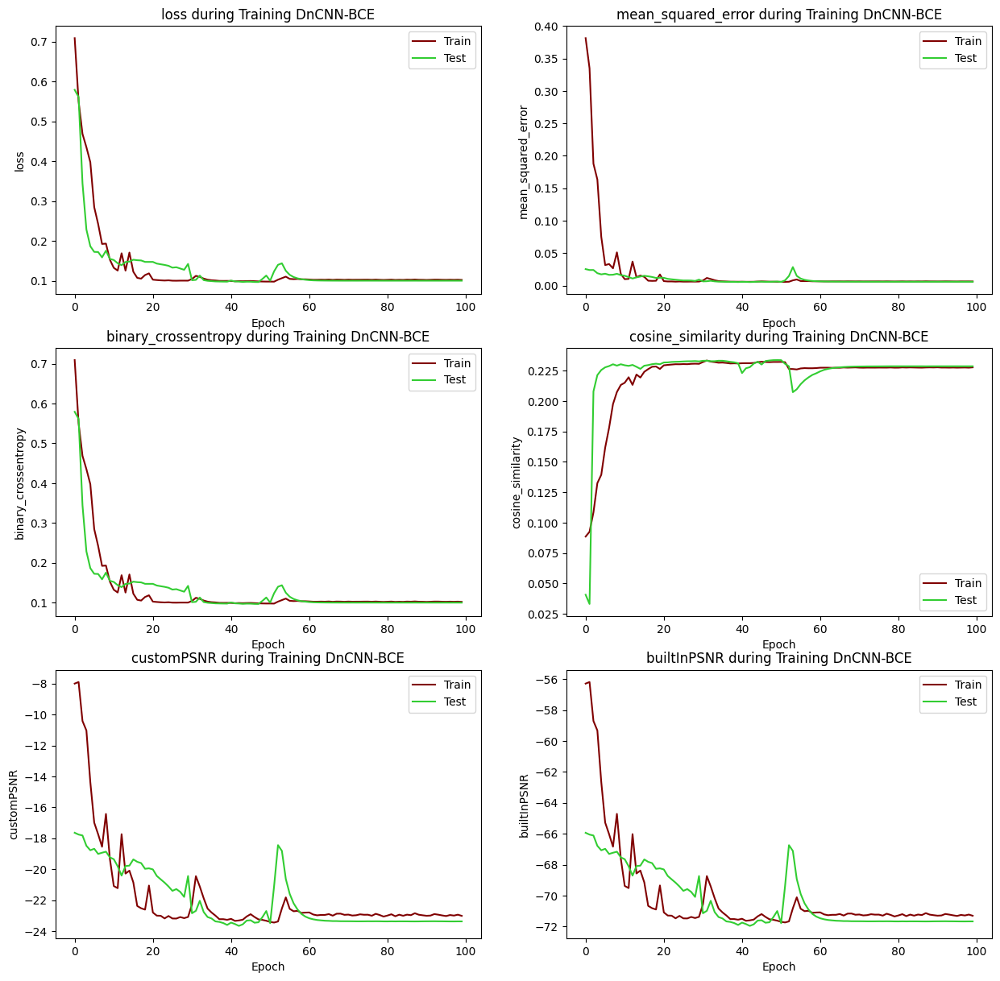

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

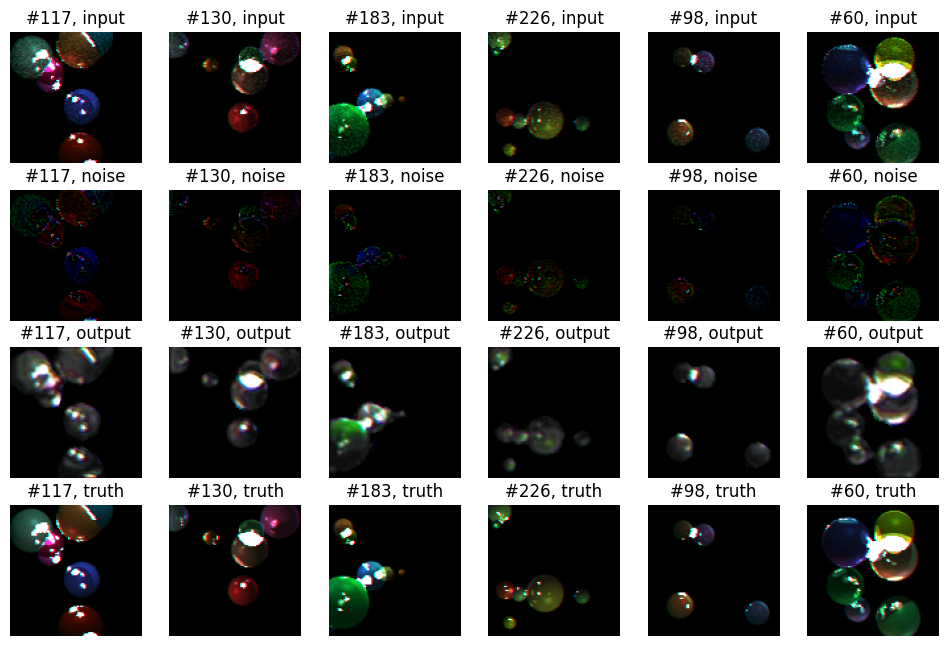

CPU times: total: 3min 25s
Wall time: 2min 43s


In [4]:
%%time

# Similar structure to above networks
# 3D pixels ( NO depth included)
# Diference is loss function is binary crossentropy, as suggested in the denoising lecture


def DnCNNBCE(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 3D pixels (Traditional RGB, no depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,3), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', activation = 'relu', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = DnCNNBCE(loss = 'binary_crossentropy', # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size][:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:][:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'DnCNN-BCE', epochs = 100, batch_size = 32)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 conv0 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv1 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/100
24/24 [==============================] - 2s 63ms/step - loss: 0.2644 - mean_squared_error: 0.0162 - binary_crossentropy: 0.2644 - cosine_similarity: 0.1948 - customPSNR: -19.2997 - builtInPSNR: -67.5865 - val_loss: 0.5713 - val_mean_squared_error: 0.0638 - val_binary_crossentropy: 0.5713 - val_cosine_similarity: 0.1982 - val_customPSNR: -12.9796 - val_builtInPSNR: -61.2734 - lr: 0.0010
Epoch 15/100
24/24 [==============================] - 2s 63ms/step - loss: 0.2388 - mean_squared_error: 0.0165 - binary_crossentropy: 0.2388 - cosine_similarity: 0.1948 - customPSNR: -19.2913 - builtInPSNR: -67.5781 - val_loss: 0.3666 - val_mean_squared_error: 0.0341 - val_binary_crossentropy: 0.3666 - val_cosine_similarity: 0.1954 - val_customPSNR: -15.8862 - val_builtInPSNR: -64.1800 - lr: 0.0010
Epoch 16/100
24/24 [==============================] - 1s 63ms/step - loss: 0.1932 - mean_squared_error: 0.0127 - binary_crossentropy: 0.1932 - cosine_similarity: 0.2015 - customPSNR: -20.0967 - bu

Epoch 34/100
24/24 [==============================] - 2s 63ms/step - loss: 0.1133 - mean_squared_error: 0.0085 - binary_crossentropy: 0.1133 - cosine_similarity: 0.2250 - customPSNR: -21.5708 - builtInPSNR: -69.8576 - val_loss: 0.1095 - val_mean_squared_error: 0.0086 - val_binary_crossentropy: 0.1095 - val_cosine_similarity: 0.2283 - val_customPSNR: -21.4510 - val_builtInPSNR: -69.7448 - lr: 1.0000e-04
Epoch 35/100
24/24 [==============================] - 2s 64ms/step - loss: 0.1124 - mean_squared_error: 0.0079 - binary_crossentropy: 0.1124 - cosine_similarity: 0.2243 - customPSNR: -21.8876 - builtInPSNR: -70.1744 - val_loss: 0.1069 - val_mean_squared_error: 0.0076 - val_binary_crossentropy: 0.1069 - val_cosine_similarity: 0.2285 - val_customPSNR: -21.9608 - val_builtInPSNR: -70.2546 - lr: 1.0000e-04
Epoch 36/100
24/24 [==============================] - 2s 65ms/step - loss: 0.1112 - mean_squared_error: 0.0078 - binary_crossentropy: 0.1112 - cosine_similarity: 0.2243 - customPSNR: -21.9

24/24 [==============================] - 2s 65ms/step - loss: 0.1011 - mean_squared_error: 0.0064 - binary_crossentropy: 0.1011 - cosine_similarity: 0.2297 - customPSNR: -22.9292 - builtInPSNR: -71.2160 - val_loss: 0.0986 - val_mean_squared_error: 0.0060 - val_binary_crossentropy: 0.0986 - val_cosine_similarity: 0.2317 - val_customPSNR: -23.1827 - val_builtInPSNR: -71.4765 - lr: 1.0000e-04
Epoch 75/100
24/24 [==============================] - 2s 65ms/step - loss: 0.1011 - mean_squared_error: 0.0064 - binary_crossentropy: 0.1011 - cosine_similarity: 0.2297 - customPSNR: -22.8903 - builtInPSNR: -71.1771 - val_loss: 0.0984 - val_mean_squared_error: 0.0060 - val_binary_crossentropy: 0.0984 - val_cosine_similarity: 0.2320 - val_customPSNR: -23.1567 - val_builtInPSNR: -71.4505 - lr: 1.0000e-04
Epoch 76/100
24/24 [==============================] - 2s 65ms/step - loss: 0.1009 - mean_squared_error: 0.0064 - binary_crossentropy: 0.1009 - cosine_similarity: 0.2299 - customPSNR: -22.9096 - builtIn

Epoch 93/100
24/24 [==============================] - 2s 64ms/step - loss: 0.1016 - mean_squared_error: 0.0066 - binary_crossentropy: 0.1016 - cosine_similarity: 0.2298 - customPSNR: -22.7688 - builtInPSNR: -71.0556 - val_loss: 0.0999 - val_mean_squared_error: 0.0063 - val_binary_crossentropy: 0.0999 - val_cosine_similarity: 0.2309 - val_customPSNR: -22.9855 - val_builtInPSNR: -71.2793 - lr: 1.0000e-06
Epoch 94/100
24/24 [==============================] - 2s 63ms/step - loss: 0.1016 - mean_squared_error: 0.0066 - binary_crossentropy: 0.1016 - cosine_similarity: 0.2298 - customPSNR: -22.7579 - builtInPSNR: -71.0446 - val_loss: 0.0998 - val_mean_squared_error: 0.0062 - val_binary_crossentropy: 0.0998 - val_cosine_similarity: 0.2310 - val_customPSNR: -22.9858 - val_builtInPSNR: -71.2796 - lr: 1.0000e-06
Epoch 95/100
24/24 [==============================] - 2s 63ms/step - loss: 0.1016 - mean_squared_error: 0.0066 - binary_crossentropy: 0.1016 - cosine_similarity: 0.2297 - customPSNR: -22.7

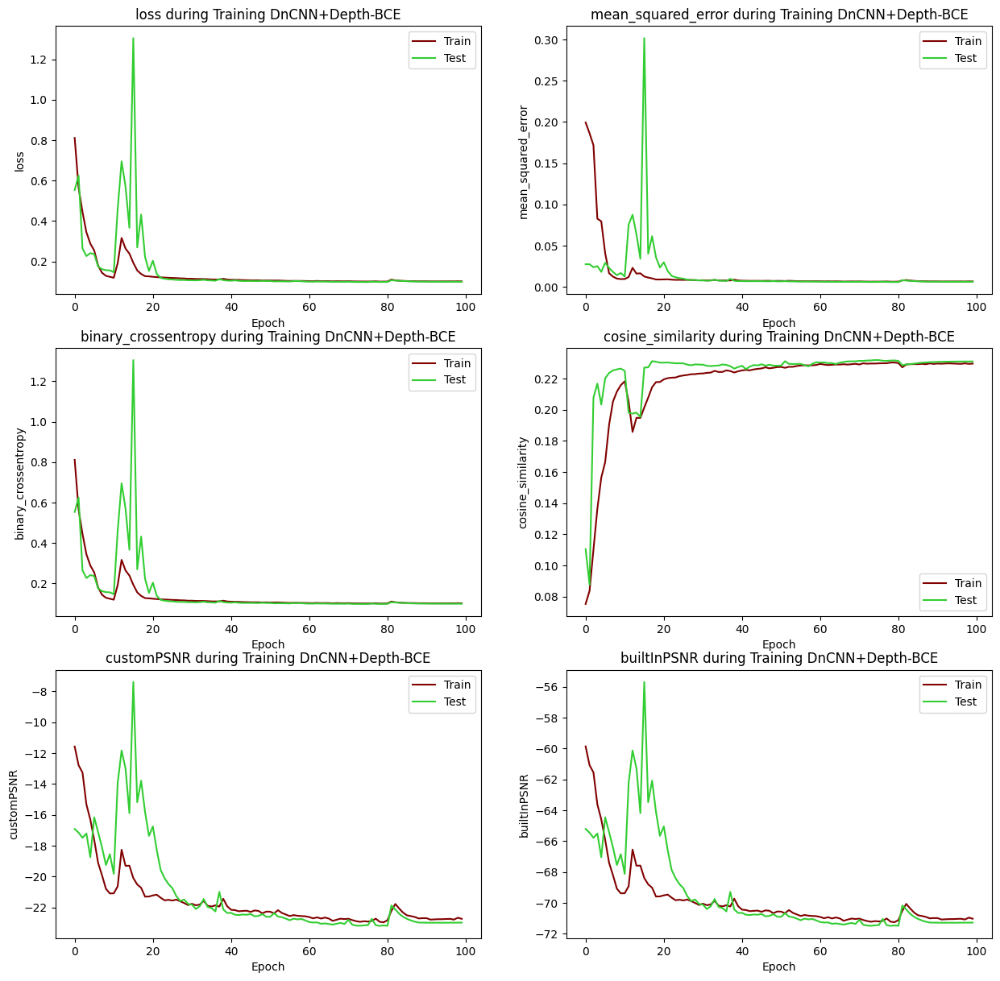

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


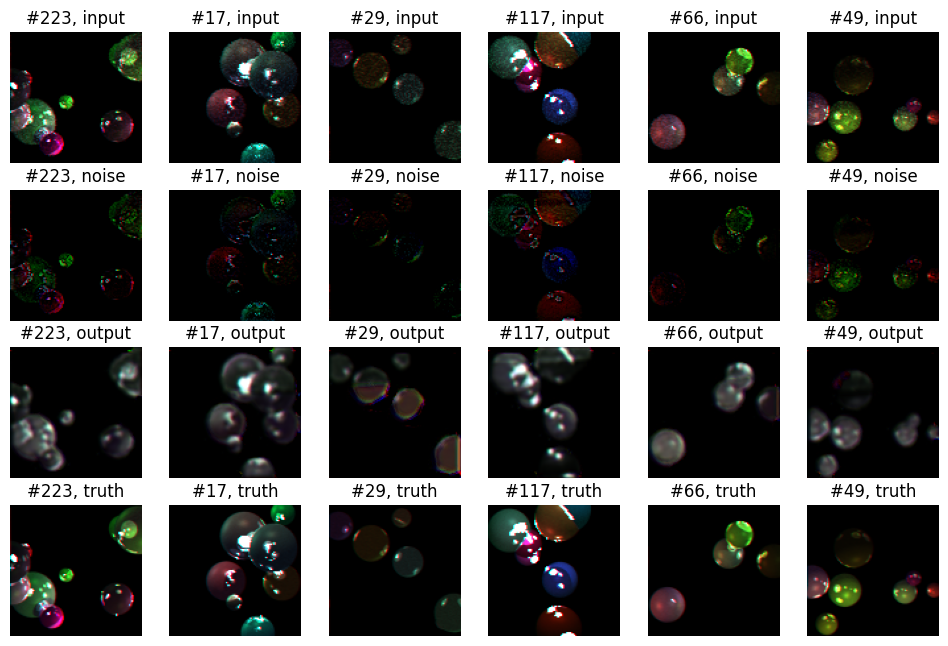

CPU times: total: 3min 39s
Wall time: 2min 39s


In [4]:
%%time

# Similar structure to above networks
# 4D pixels (Depth included)
# Diference is loss function is binary crossentropy, as suggested in the denoising lecture


def DnCNNPlusDepthBCE(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D= depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', activation = 'relu', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = DnCNNPlusDepthBCE(loss = 'binary_crossentropy', # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] # [:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'DnCNN+Depth-BCE', epochs = 100, batch_size = 32)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      1792      
                                                                 
 conv0 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv1 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

 conv17 (Conv2D)             (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_17 (Bat  (None, 100, 100, 64)     256       
 chNormalization)                                                
                                                                 
 activation_17 (Activation)  (None, 100, 100, 64)      0         
                                                                 
 conv18 (Conv2D)             (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_18 (Bat  (None, 100, 100, 64)     256       
 chNormalization)                                                
                                                                 
 activation_18 (Activation)  (None, 100, 100, 64)      0         
                                                                 
 conv19 (Conv2D)             (None, 100, 100, 64)      36864     
          

24/24 [==============================] - 6s 256ms/step - loss: -24.5089 - mean_squared_error: 0.0046 - binary_crossentropy: 0.0949 - cosine_similarity: 0.2313 - customPSNR: -24.5089 - builtInPSNR: -72.7956 - val_loss: -22.9387 - val_mean_squared_error: 0.0061 - val_binary_crossentropy: 0.1009 - val_cosine_similarity: 0.2327 - val_customPSNR: -22.9387 - val_builtInPSNR: -71.2325 - lr: 0.0010
Epoch 32/100
24/24 [==============================] - 6s 256ms/step - loss: -24.4751 - mean_squared_error: 0.0046 - binary_crossentropy: 0.0952 - cosine_similarity: 0.2313 - customPSNR: -24.4751 - builtInPSNR: -72.7619 - val_loss: -23.4611 - val_mean_squared_error: 0.0056 - val_binary_crossentropy: 0.1012 - val_cosine_similarity: 0.2317 - val_customPSNR: -23.4611 - val_builtInPSNR: -71.7549 - lr: 0.0010
Epoch 33/100
24/24 [==============================] - 6s 256ms/step - loss: -24.5842 - mean_squared_error: 0.0045 - binary_crossentropy: 0.0947 - cosine_similarity: 0.2315 - customPSNR: -24.5842 - bu

Epoch 70/100
24/24 [==============================] - 6s 264ms/step - loss: -25.0669 - mean_squared_error: 0.0041 - binary_crossentropy: 0.0931 - cosine_similarity: 0.2364 - customPSNR: -25.0669 - builtInPSNR: -73.3537 - val_loss: -25.1824 - val_mean_squared_error: 0.0039 - val_binary_crossentropy: 0.0915 - val_cosine_similarity: 0.2389 - val_customPSNR: -25.1824 - val_builtInPSNR: -73.4762 - lr: 1.0000e-04
Epoch 71/100
24/24 [==============================] - 6s 263ms/step - loss: -25.2132 - mean_squared_error: 0.0040 - binary_crossentropy: 0.0924 - cosine_similarity: 0.2369 - customPSNR: -25.2132 - builtInPSNR: -73.5000 - val_loss: -25.2044 - val_mean_squared_error: 0.0039 - val_binary_crossentropy: 0.0916 - val_cosine_similarity: 0.2393 - val_customPSNR: -25.2044 - val_builtInPSNR: -73.4982 - lr: 1.0000e-04
Epoch 72/100
24/24 [==============================] - 6s 256ms/step - loss: -25.2437 - mean_squared_error: 0.0040 - binary_crossentropy: 0.0925 - cosine_similarity: 0.2366 - cust

Epoch 90/100
24/24 [==============================] - 6s 257ms/step - loss: -25.6511 - mean_squared_error: 0.0037 - binary_crossentropy: 0.0917 - cosine_similarity: 0.2392 - customPSNR: -25.6511 - builtInPSNR: -73.9379 - val_loss: -25.3460 - val_mean_squared_error: 0.0038 - val_binary_crossentropy: 0.0916 - val_cosine_similarity: 0.2403 - val_customPSNR: -25.3460 - val_builtInPSNR: -73.6398 - lr: 1.0000e-04
Epoch 91/100
24/24 [==============================] - 6s 257ms/step - loss: -25.5865 - mean_squared_error: 0.0037 - binary_crossentropy: 0.0923 - cosine_similarity: 0.2391 - customPSNR: -25.5865 - builtInPSNR: -73.8733 - val_loss: -25.2857 - val_mean_squared_error: 0.0038 - val_binary_crossentropy: 0.0913 - val_cosine_similarity: 0.2418 - val_customPSNR: -25.2857 - val_builtInPSNR: -73.5795 - lr: 1.0000e-04
Epoch 92/100
24/24 [==============================] - 6s 257ms/step - loss: -25.7353 - mean_squared_error: 0.0036 - binary_crossentropy: 0.0916 - cosine_similarity: 0.2394 - cust

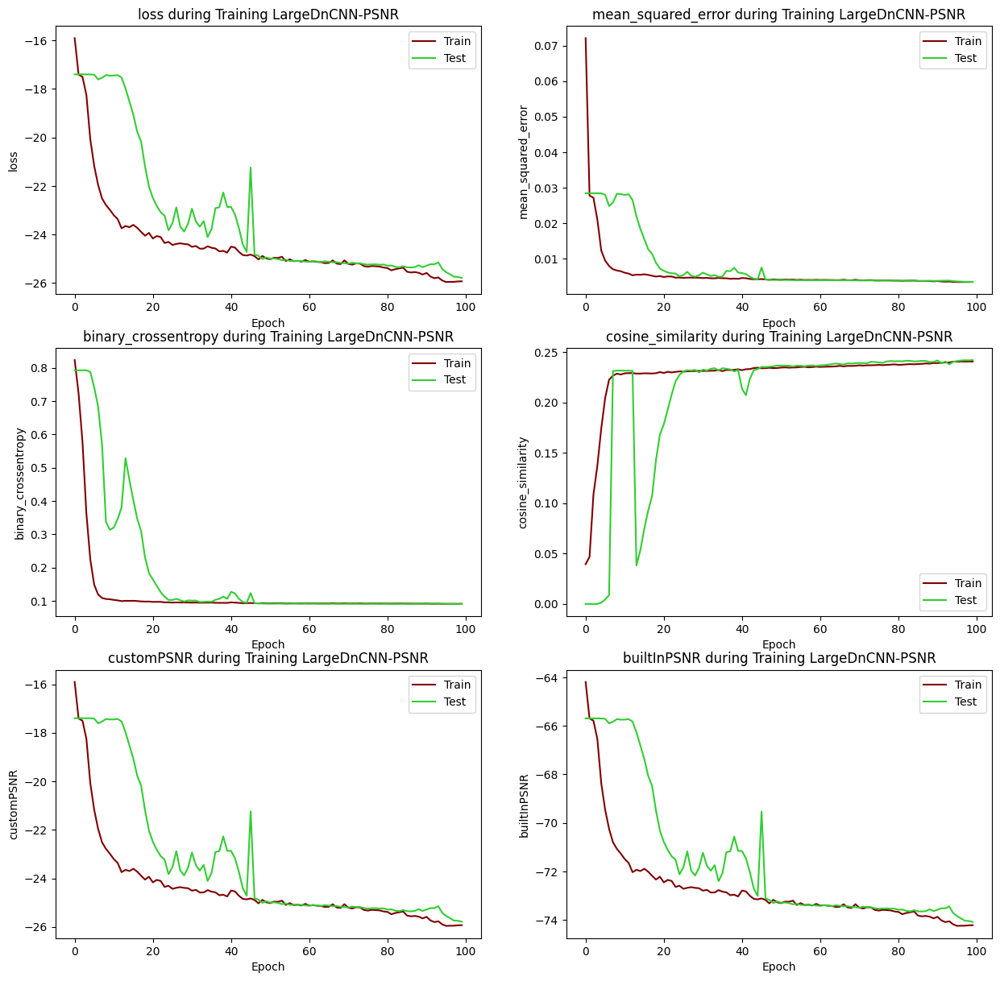

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

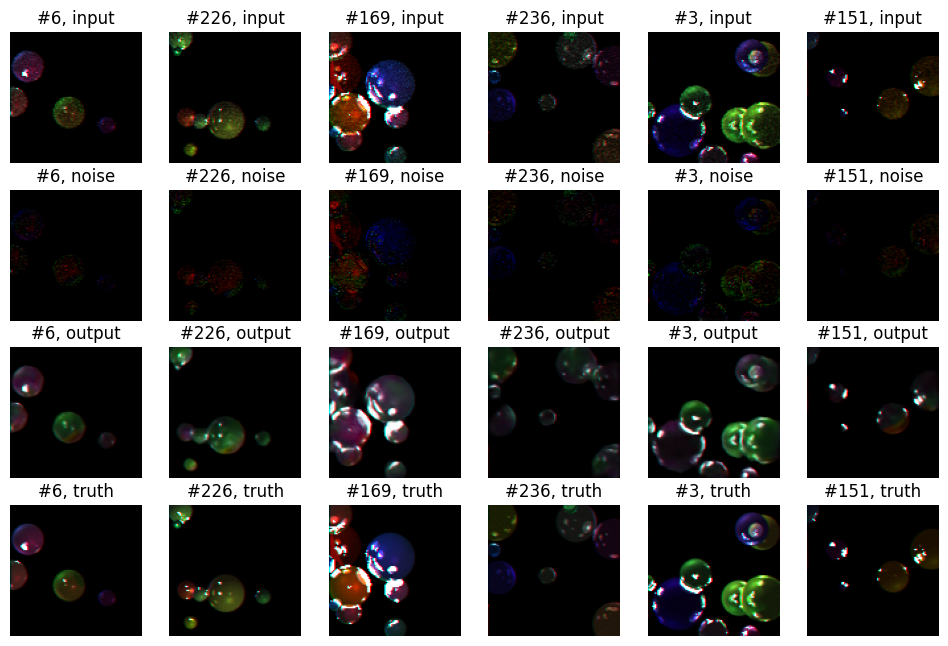

CPU times: total: 11min 51s
Wall time: 10min 29s


In [4]:
%%time


# Much deper structure compared to above networks
# 3D pixels (No depth included)
# Loss function is my custom PSNR
# Rather than 5 repeated conv -> relu -> bn > relu blocks, we have 25
# This experiences vanishing gradient; doesn't learn proper coloring of output image well

def LargeDnCNN(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 3D pixels (Traditional RGB, no depth)
    
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,3), activation = 'relu', name = 'inputConv'))
    
    # 25 hidden convolution layers without bias
    for i in range(25):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', activation = 'relu', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = LargeDnCNN(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size][:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:][:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'LargeDnCNN-PSNR', epochs = 100, batch_size = 32)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 conv0 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv1 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

 conv17 (Conv2D)             (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_17 (Bat  (None, 100, 100, 64)     256       
 chNormalization)                                                
                                                                 
 activation_17 (Activation)  (None, 100, 100, 64)      0         
                                                                 
 conv18 (Conv2D)             (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_18 (Bat  (None, 100, 100, 64)     256       
 chNormalization)                                                
                                                                 
 activation_18 (Activation)  (None, 100, 100, 64)      0         
                                                                 
 conv19 (Conv2D)             (None, 100, 100, 64)      36864     
          

24/24 [==============================] - 6s 258ms/step - loss: -24.1035 - mean_squared_error: 0.0050 - binary_crossentropy: 0.0968 - cosine_similarity: 0.2325 - customPSNR: -24.1035 - builtInPSNR: -72.3903 - val_loss: -22.5880 - val_mean_squared_error: 0.0066 - val_binary_crossentropy: 0.1160 - val_cosine_similarity: 0.2220 - val_customPSNR: -22.5880 - val_builtInPSNR: -70.8818 - lr: 0.0010
Epoch 32/100
24/24 [==============================] - 6s 260ms/step - loss: -24.1333 - mean_squared_error: 0.0050 - binary_crossentropy: 0.0962 - cosine_similarity: 0.2332 - customPSNR: -24.1333 - builtInPSNR: -72.4200 - val_loss: -22.3106 - val_mean_squared_error: 0.0070 - val_binary_crossentropy: 0.1115 - val_cosine_similarity: 0.2341 - val_customPSNR: -22.3106 - val_builtInPSNR: -70.6044 - lr: 0.0010
Epoch 33/100
24/24 [==============================] - 6s 259ms/step - loss: -24.2240 - mean_squared_error: 0.0049 - binary_crossentropy: 0.0963 - cosine_similarity: 0.2327 - customPSNR: -24.2240 - bu

24/24 [==============================] - 6s 259ms/step - loss: -24.7148 - mean_squared_error: 0.0044 - binary_crossentropy: 0.0938 - cosine_similarity: 0.2339 - customPSNR: -24.7148 - builtInPSNR: -73.0015 - val_loss: -24.7324 - val_mean_squared_error: 0.0042 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2350 - val_customPSNR: -24.7324 - val_builtInPSNR: -73.0262 - lr: 1.0000e-05
Epoch 70/100
24/24 [==============================] - 6s 259ms/step - loss: -24.6887 - mean_squared_error: 0.0044 - binary_crossentropy: 0.0939 - cosine_similarity: 0.2338 - customPSNR: -24.6887 - builtInPSNR: -72.9755 - val_loss: -24.7345 - val_mean_squared_error: 0.0042 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2349 - val_customPSNR: -24.7345 - val_builtInPSNR: -73.0283 - lr: 1.0000e-05
Epoch 71/100
24/24 [==============================] - 6s 261ms/step - loss: -24.6044 - mean_squared_error: 0.0045 - binary_crossentropy: 0.0946 - cosine_similarity: 0.2335 - customPSNR: -24.6

24/24 [==============================] - 6s 260ms/step - loss: -24.7717 - mean_squared_error: 0.0043 - binary_crossentropy: 0.0938 - cosine_similarity: 0.2337 - customPSNR: -24.7717 - builtInPSNR: -73.0585 - val_loss: -24.7318 - val_mean_squared_error: 0.0042 - val_binary_crossentropy: 0.0930 - val_cosine_similarity: 0.2347 - val_customPSNR: -24.7318 - val_builtInPSNR: -73.0256 - lr: 1.0000e-07
Epoch 88/100
24/24 [==============================] - 6s 264ms/step - loss: -24.7426 - mean_squared_error: 0.0044 - binary_crossentropy: 0.0937 - cosine_similarity: 0.2339 - customPSNR: -24.7426 - builtInPSNR: -73.0293 - val_loss: -24.7312 - val_mean_squared_error: 0.0042 - val_binary_crossentropy: 0.0930 - val_cosine_similarity: 0.2347 - val_customPSNR: -24.7312 - val_builtInPSNR: -73.0250 - lr: 1.0000e-08
Epoch 89/100
24/24 [==============================] - 6s 259ms/step - loss: -24.7488 - mean_squared_error: 0.0043 - binary_crossentropy: 0.0937 - cosine_similarity: 0.2336 - customPSNR: -24.7

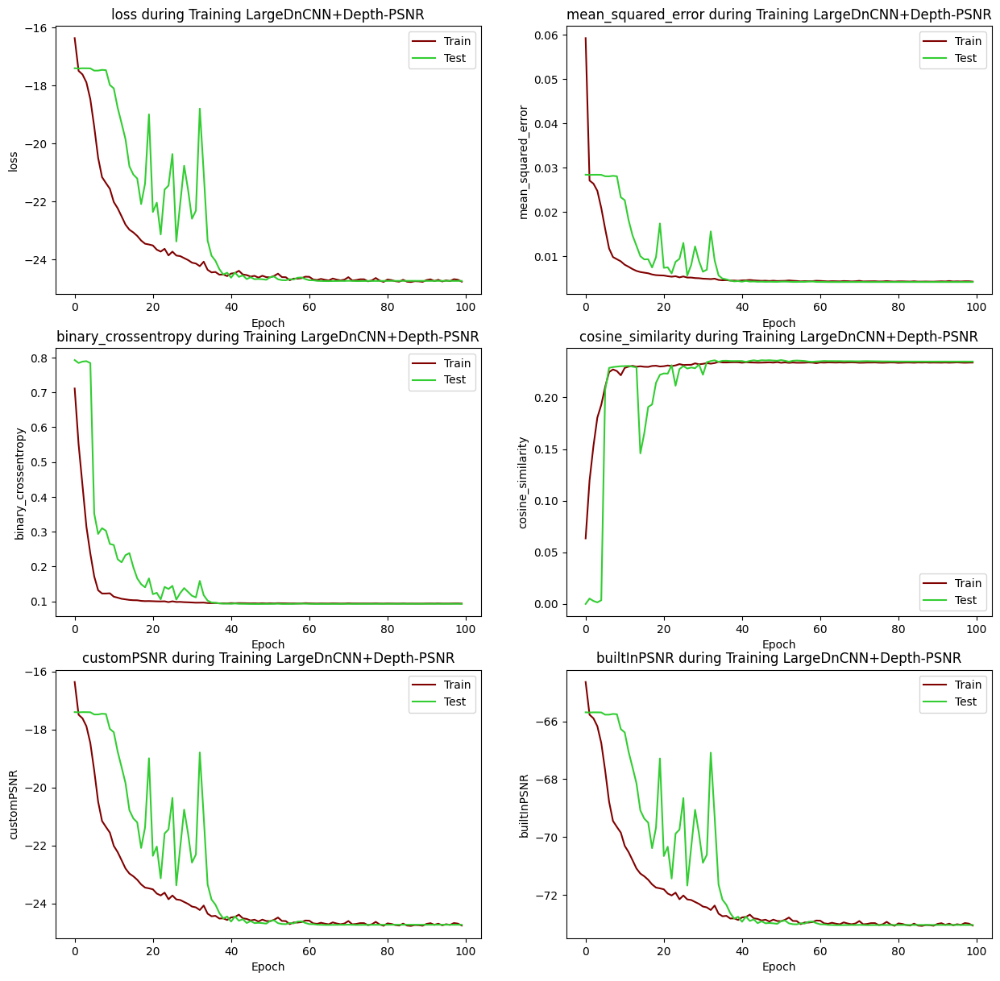

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


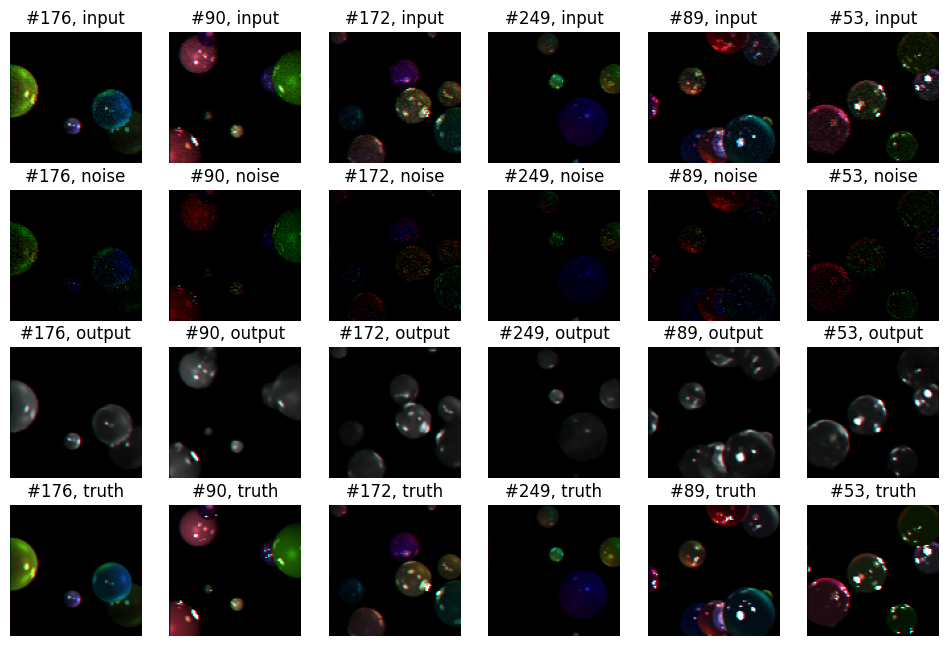

CPU times: total: 11min 53s
Wall time: 10min 32s


In [4]:
%%time

# Much deper structure compared to above networks
# 4D pixels (Depth included)
# Loss function is my custom PSNR
# Rather than 5 repeated conv -> relu -> bn > relu blocks, we have 25
# This experiences vanishing gradient; doesn't learn proper coloring of output image well

def LargeDnCNNPlusDepth(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 3D pixels (Traditional RGB, no depth)
    
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 25 hidden convolution layers without bias
    for i in range(25):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', activation = 'relu', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = LargeDnCNNPlusDepth(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'LargeDnCNN+Depth-PSNR', epochs = 100, batch_size = 32)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 128)     4736      
                                                                 
 conv0 (Conv2D)              (None, 100, 100, 64)      73728     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv1 (Conv2D)              (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

 conv17 (Conv2D)             (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_17 (Bat  (None, 100, 100, 64)     256       
 chNormalization)                                                
                                                                 
 activation_17 (Activation)  (None, 100, 100, 64)      0         
                                                                 
 conv18 (Conv2D)             (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_18 (Bat  (None, 100, 100, 64)     256       
 chNormalization)                                                
                                                                 
 activation_18 (Activation)  (None, 100, 100, 64)      0         
                                                                 
 conv19 (Conv2D)             (None, 100, 100, 64)      36864     
          

Epoch 17/100
24/24 [==============================] - 5s 215ms/step - loss: -23.8333 - mean_squared_error: 0.0053 - binary_crossentropy: 0.0986 - cosine_similarity: 0.2309 - customPSNR: -23.8333 - builtInPSNR: -72.1201 - val_loss: -22.7594 - val_mean_squared_error: 0.0068 - val_binary_crossentropy: 0.1170 - val_cosine_similarity: 0.2323 - val_customPSNR: -22.7594 - val_builtInPSNR: -71.0532 - lr: 0.0010
Epoch 18/100
24/24 [==============================] - 5s 218ms/step - loss: -23.6360 - mean_squared_error: 0.0056 - binary_crossentropy: 0.0999 - cosine_similarity: 0.2308 - customPSNR: -23.6360 - builtInPSNR: -71.9227 - val_loss: -22.4296 - val_mean_squared_error: 0.0073 - val_binary_crossentropy: 0.1157 - val_cosine_similarity: 0.2252 - val_customPSNR: -22.4296 - val_builtInPSNR: -70.7234 - lr: 0.0010
Epoch 19/100
24/24 [==============================] - 5s 215ms/step - loss: -23.9335 - mean_squared_error: 0.0052 - binary_crossentropy: 0.0989 - cosine_similarity: 0.2302 - customPSNR: 

Epoch 56/100
24/24 [==============================] - 5s 215ms/step - loss: -24.7959 - mean_squared_error: 0.0043 - binary_crossentropy: 0.0930 - cosine_similarity: 0.2337 - customPSNR: -24.7959 - builtInPSNR: -73.0827 - val_loss: -24.8534 - val_mean_squared_error: 0.0042 - val_binary_crossentropy: 0.0921 - val_cosine_similarity: 0.2353 - val_customPSNR: -24.8534 - val_builtInPSNR: -73.1472 - lr: 1.0000e-04
Epoch 57/100
24/24 [==============================] - 5s 216ms/step - loss: -24.8320 - mean_squared_error: 0.0042 - binary_crossentropy: 0.0932 - cosine_similarity: 0.2331 - customPSNR: -24.8320 - builtInPSNR: -73.1188 - val_loss: -24.8548 - val_mean_squared_error: 0.0041 - val_binary_crossentropy: 0.0922 - val_cosine_similarity: 0.2349 - val_customPSNR: -24.8548 - val_builtInPSNR: -73.1486 - lr: 1.0000e-04
Epoch 58/100
24/24 [==============================] - 5s 216ms/step - loss: -24.8421 - mean_squared_error: 0.0042 - binary_crossentropy: 0.0929 - cosine_similarity: 0.2335 - cust

Epoch 76/100
24/24 [==============================] - 5s 217ms/step - loss: -24.9486 - mean_squared_error: 0.0042 - binary_crossentropy: 0.0925 - cosine_similarity: 0.2336 - customPSNR: -24.9486 - builtInPSNR: -73.2354 - val_loss: -24.8793 - val_mean_squared_error: 0.0041 - val_binary_crossentropy: 0.0922 - val_cosine_similarity: 0.2343 - val_customPSNR: -24.8793 - val_builtInPSNR: -73.1731 - lr: 1.0000e-04
Epoch 77/100
24/24 [==============================] - 5s 215ms/step - loss: -24.9765 - mean_squared_error: 0.0041 - binary_crossentropy: 0.0926 - cosine_similarity: 0.2334 - customPSNR: -24.9765 - builtInPSNR: -73.2633 - val_loss: -24.9054 - val_mean_squared_error: 0.0041 - val_binary_crossentropy: 0.0916 - val_cosine_similarity: 0.2361 - val_customPSNR: -24.9054 - val_builtInPSNR: -73.1992 - lr: 1.0000e-04
Epoch 78/100
24/24 [==============================] - 5s 221ms/step - loss: -24.9944 - mean_squared_error: 0.0041 - binary_crossentropy: 0.0924 - cosine_similarity: 0.2337 - cust

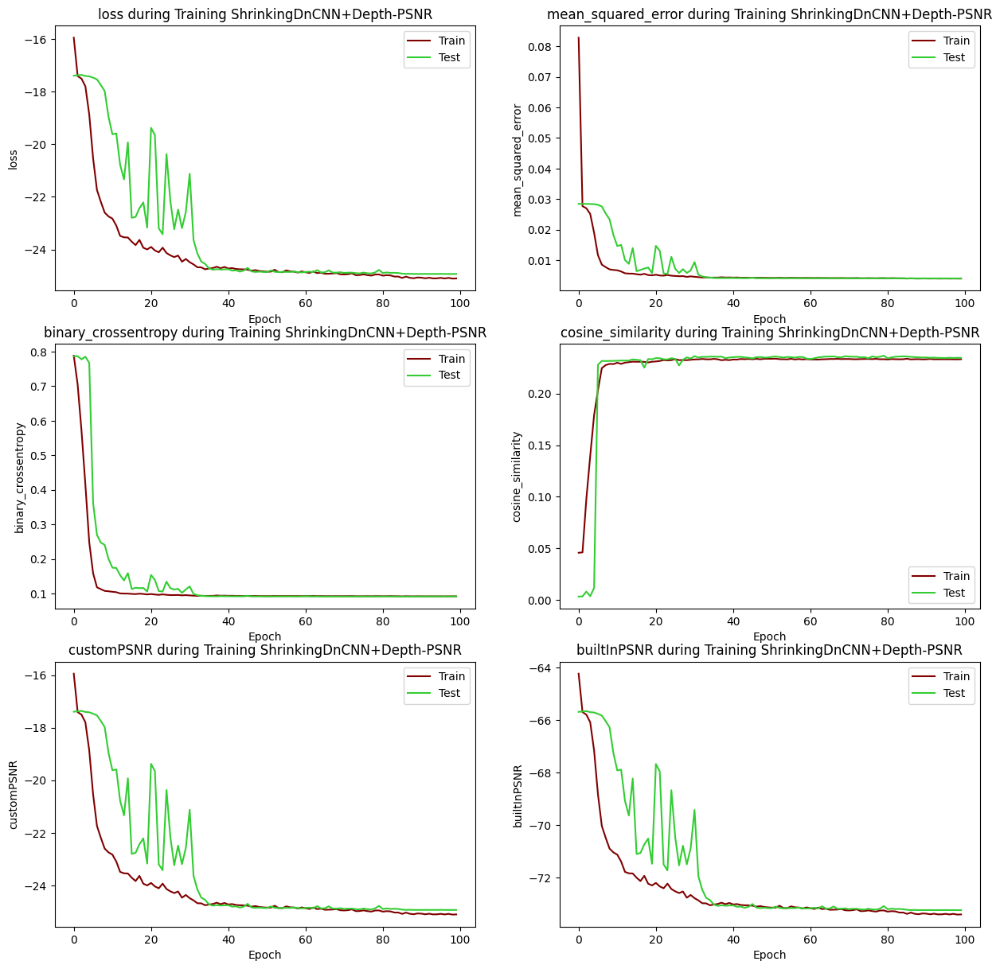

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

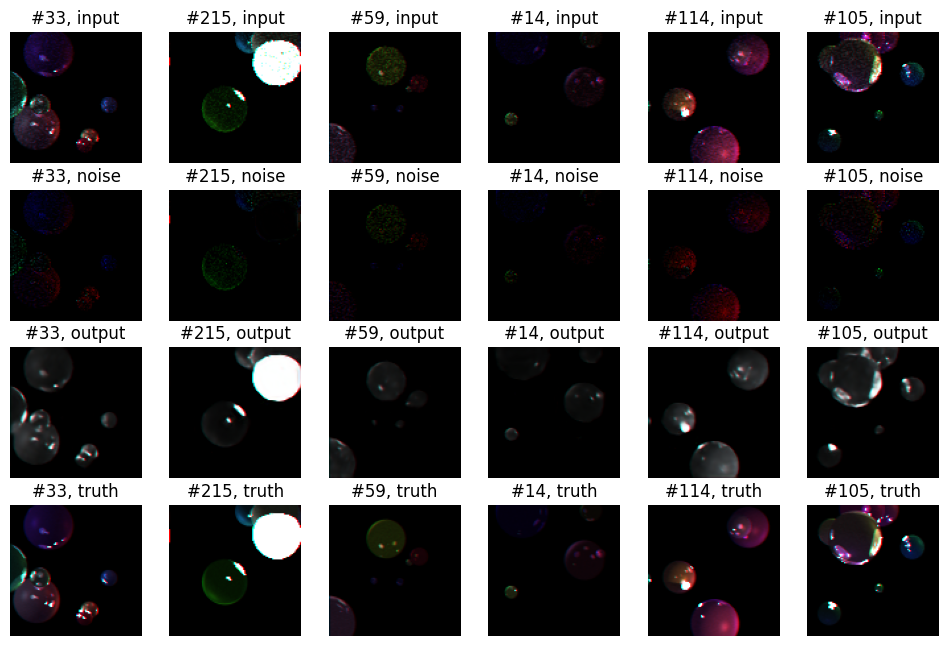

CPU times: total: 9min 50s
Wall time: 8min 50s


In [4]:
%%time

# Test with many more initial filters, and 20 aformentioned hidden layer blocks
# Completely loses meaning of color; reduces all output images to grayscale


def ShrinkingDnCNNPlusDepth(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (Traditional RGB, no depth)
    # Input layer has most filters, 20 hidden layers only have 64
    model.add(tf.keras.layers.Conv2D(128, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 20 hidden convolution layers without bias
    for i in range(20):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', activation = 'relu', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = ShrinkingDnCNNPlusDepth(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'ShrinkingDnCNN+Depth-PSNR', epochs = 100, batch_size = 32)

## Section 3: Optimization of Best Discovered Model
Now that the best architecture has been determined (DnCNNPlusDepthPSNR), we manipulate hyperparameters in order to create the best overall model.

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 internalConv0 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 internalConv1 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/100
47/47 [==============================] - 2s 35ms/step - loss: -18.8865 - mean_squared_error: 0.0197 - binary_crossentropy: 0.5576 - cosine_similarity: 0.1223 - customPSNR: -18.8865 - builtInPSNR: -67.1733 - val_loss: -18.9336 - val_mean_squared_error: 0.0200 - val_binary_crossentropy: 0.5694 - val_cosine_similarity: 0.1125 - val_customPSNR: -18.9336 - val_builtInPSNR: -67.2274 - lr: 0.0010
Epoch 15/100
47/47 [==============================] - 2s 36ms/step - loss: -18.8880 - mean_squared_error: 0.0197 - binary_crossentropy: 0.5588 - cosine_similarity: 0.1214 - customPSNR: -18.8880 - builtInPSNR: -67.1747 - val_loss: -18.9484 - val_mean_squared_error: 0.0200 - val_binary_crossentropy: 0.5650 - val_cosine_similarity: 0.1189 - val_customPSNR: -18.9484 - val_builtInPSNR: -67.2422 - lr: 0.0010
Epoch 16/100
47/47 [==============================] - 2s 37ms/step - loss: -18.8668 - mean_squared_error: 0.0198 - binary_crossentropy: 0.5578 - cosine_similarity: 0.1224 - customPSNR: -18

47/47 [==============================] - 2s 38ms/step - loss: -27.5256 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0882 - cosine_similarity: 0.2554 - customPSNR: -27.5256 - builtInPSNR: -75.8124 - val_loss: -28.3410 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0859 - val_cosine_similarity: 0.2611 - val_customPSNR: -28.3410 - val_builtInPSNR: -76.6348 - lr: 0.0010
Epoch 55/100
47/47 [==============================] - 2s 36ms/step - loss: -27.5937 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0880 - cosine_similarity: 0.2557 - customPSNR: -27.5937 - builtInPSNR: -75.8804 - val_loss: -28.2419 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0862 - val_cosine_similarity: 0.2594 - val_customPSNR: -28.2419 - val_builtInPSNR: -76.5357 - lr: 0.0010
Epoch 56/100
47/47 [==============================] - 2s 42ms/step - loss: -27.5224 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0883 - cosine_similarity: 0.2555 - customPSNR: -27.5224 - built

Epoch 73/100
47/47 [==============================] - 2s 39ms/step - loss: -28.0643 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2578 - customPSNR: -28.0643 - builtInPSNR: -76.3510 - val_loss: -28.5451 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0859 - val_cosine_similarity: 0.2608 - val_customPSNR: -28.5451 - val_builtInPSNR: -76.8389 - lr: 1.0000e-05
Epoch 74/100
47/47 [==============================] - 2s 37ms/step - loss: -28.0515 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0866 - cosine_similarity: 0.2577 - customPSNR: -28.0515 - builtInPSNR: -76.3383 - val_loss: -28.5489 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0859 - val_cosine_similarity: 0.2607 - val_customPSNR: -28.5489 - val_builtInPSNR: -76.8427 - lr: 1.0000e-05
Epoch 75/100
47/47 [==============================] - 2s 38ms/step - loss: -28.0715 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0866 - cosine_similarity: 0.2579 - customP

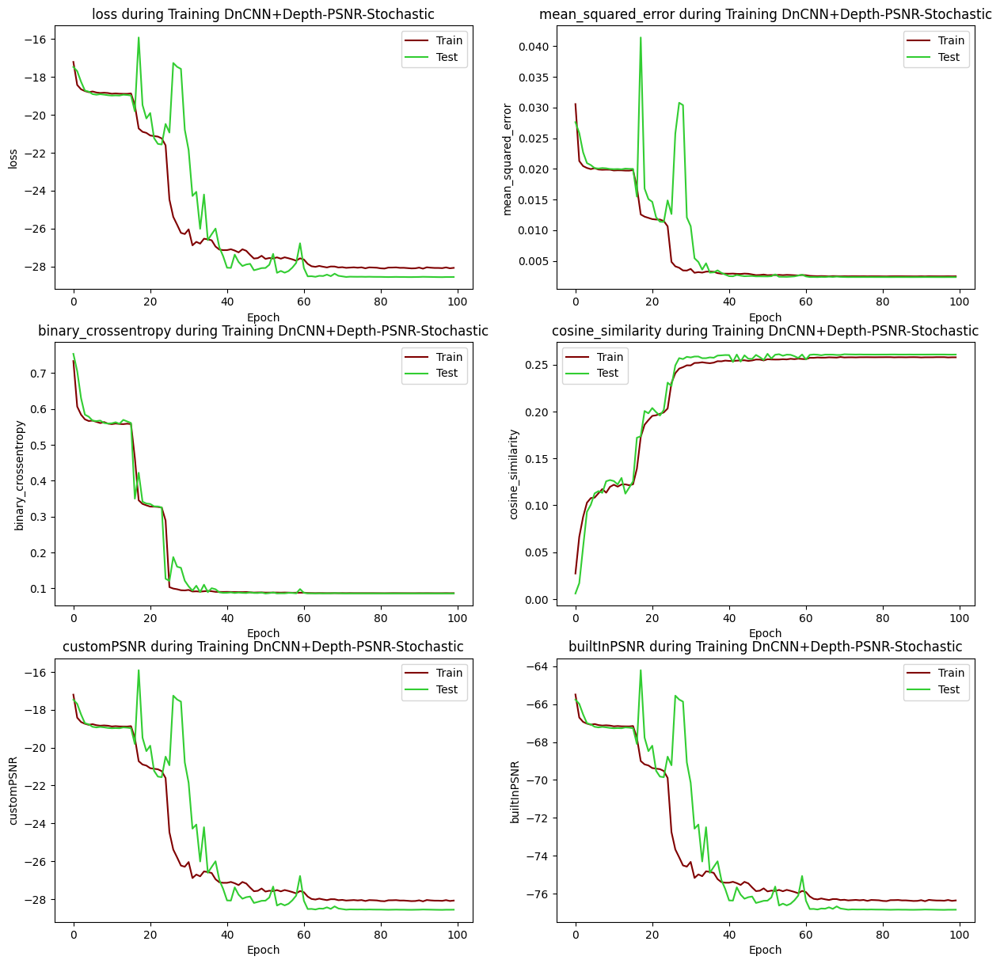

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

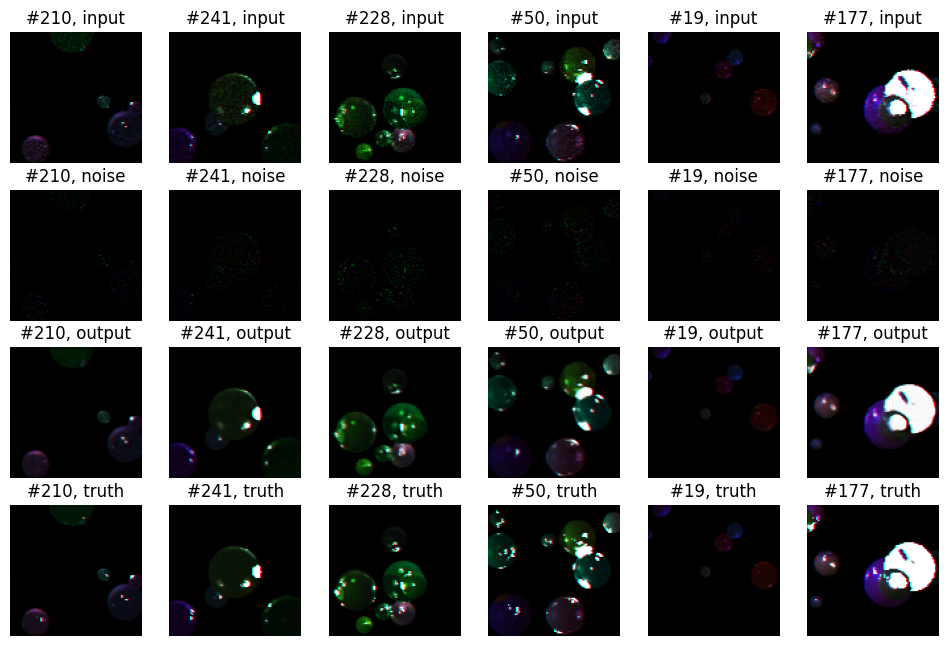

CPU times: total: 3min 47s
Wall time: 2min 57s


In [4]:
%%time

# Similar to "DnCNNPlusDepthPSNR", but with batch size being reduced by half, to 16
# Improves moderately over version with batch size 32

def optimalModelTrial1(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = optimalModelTrial1(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'DnCNN+Depth-PSNR-16', epochs = 100, batch_size = 16)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 internalConv0 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 internalConv1 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/100
94/94 [==============================] - 2s 22ms/step - loss: -27.0030 - mean_squared_error: 0.0030 - binary_crossentropy: 0.0900 - cosine_similarity: 0.2521 - customPSNR: -27.0030 - builtInPSNR: -75.2897 - val_loss: -26.5749 - val_mean_squared_error: 0.0030 - val_binary_crossentropy: 0.0875 - val_cosine_similarity: 0.2579 - val_customPSNR: -26.5749 - val_builtInPSNR: -74.8687 - lr: 0.0010
Epoch 15/100
94/94 [==============================] - 2s 21ms/step - loss: -26.9197 - mean_squared_error: 0.0030 - binary_crossentropy: 0.0902 - cosine_similarity: 0.2524 - customPSNR: -26.9197 - builtInPSNR: -75.2065 - val_loss: -26.3556 - val_mean_squared_error: 0.0035 - val_binary_crossentropy: 0.0888 - val_cosine_similarity: 0.2561 - val_customPSNR: -26.3556 - val_builtInPSNR: -74.6494 - lr: 0.0010
Epoch 16/100
94/94 [==============================] - 2s 21ms/step - loss: -27.0462 - mean_squared_error: 0.0029 - binary_crossentropy: 0.0896 - cosine_similarity: 0.2522 - customPSNR: -27

94/94 [==============================] - ETA: 0s - loss: -28.1599 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2578 - customPSNR: -28.1599 - builtInPSNR: -76.4466
Epoch 52: ReduceLROnPlateau reducing learning rate to 1.0000000656873453e-06.
94/94 [==============================] - 2s 24ms/step - loss: -28.1599 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2578 - customPSNR: -28.1599 - builtInPSNR: -76.4466 - val_loss: -28.4922 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0858 - val_cosine_similarity: 0.2607 - val_customPSNR: -28.4922 - val_builtInPSNR: -76.7860 - lr: 1.0000e-05
Epoch 53/100
94/94 [==============================] - 2s 22ms/step - loss: -28.1636 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0864 - cosine_similarity: 0.2578 - customPSNR: -28.1636 - builtInPSNR: -76.4504 - val_loss: -28.5019 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0858 - val_cosine_simila

Epoch 70/100
94/94 [==============================] - 2s 21ms/step - loss: -28.1643 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0864 - cosine_similarity: 0.2578 - customPSNR: -28.1643 - builtInPSNR: -76.4510 - val_loss: -28.4969 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0858 - val_cosine_similarity: 0.2606 - val_customPSNR: -28.4969 - val_builtInPSNR: -76.7907 - lr: 1.0000e-08
Epoch 71/100
94/94 [==============================] - 2s 22ms/step - loss: -28.1617 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2578 - customPSNR: -28.1617 - builtInPSNR: -76.4485 - val_loss: -28.5136 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0858 - val_cosine_similarity: 0.2605 - val_customPSNR: -28.5136 - val_builtInPSNR: -76.8074 - lr: 1.0000e-08
Epoch 72/100
94/94 [==============================] - 2s 22ms/step - loss: -28.1565 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2577 - customP

Epoch 89/100
94/94 [==============================] - 2s 22ms/step - loss: -28.1673 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2577 - customPSNR: -28.1673 - builtInPSNR: -76.4540 - val_loss: -28.5282 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0857 - val_cosine_similarity: 0.2605 - val_customPSNR: -28.5282 - val_builtInPSNR: -76.8220 - lr: 1.0000e-10
Epoch 90/100
94/94 [==============================] - 2s 22ms/step - loss: -28.1690 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0864 - cosine_similarity: 0.2578 - customPSNR: -28.1690 - builtInPSNR: -76.4558 - val_loss: -28.5194 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0858 - val_cosine_similarity: 0.2605 - val_customPSNR: -28.5194 - val_builtInPSNR: -76.8131 - lr: 1.0000e-10
Epoch 91/100
94/94 [==============================] - 2s 22ms/step - loss: -28.1471 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0864 - cosine_similarity: 0.2578 - customP

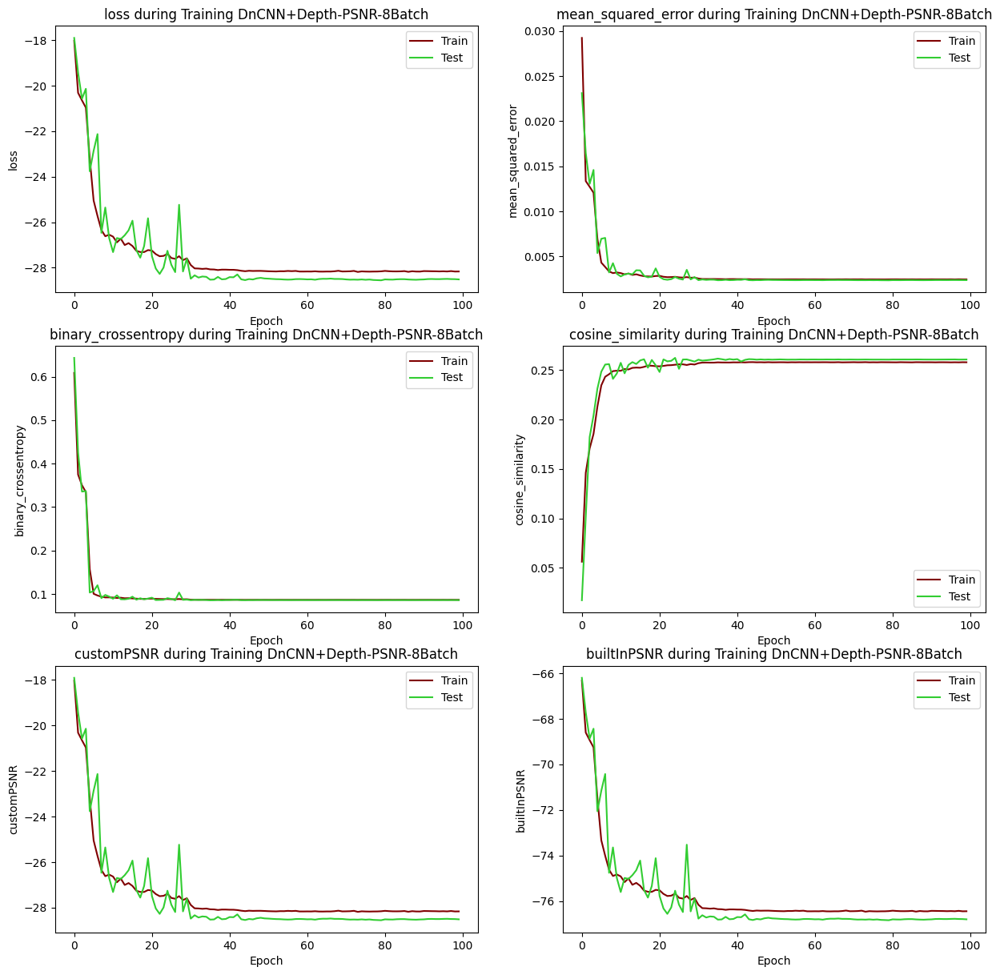

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

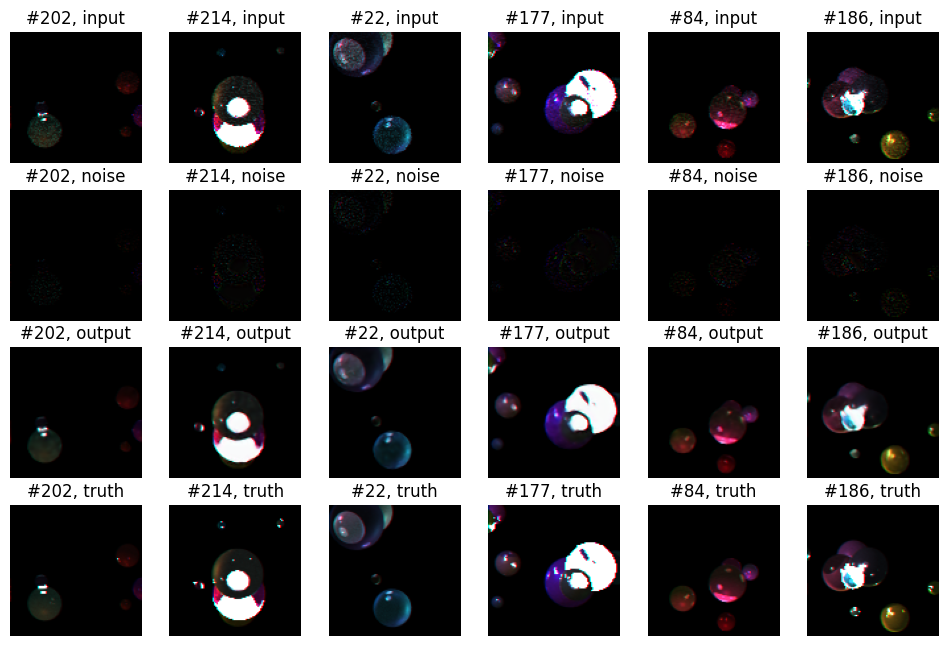

CPU times: total: 4min 41s
Wall time: 3min 35s


In [4]:
%%time

# Similar to "DnCNNPlusDepthPSNR", but with batch size being reduced again by half, to 8
# Performs slightly better than above model, 8 100x100x4 images is a reasonable size 


def optimalModelTrial2(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = optimalModelTrial2(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'DnCNN+Depth-PSNR-8Batch', epochs = 100, batch_size = 8)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 internalConv0 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 internalConv1 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/100
188/188 [==============================] - 3s 15ms/step - loss: -26.8435 - mean_squared_error: 0.0030 - binary_crossentropy: 0.0902 - cosine_similarity: 0.2515 - customPSNR: -26.8435 - builtInPSNR: -75.1303 - val_loss: -26.8691 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0886 - val_cosine_similarity: 0.2559 - val_customPSNR: -26.8691 - val_builtInPSNR: -75.1629 - lr: 0.0010
Epoch 15/100
188/188 [==============================] - 3s 15ms/step - loss: -26.8664 - mean_squared_error: 0.0030 - binary_crossentropy: 0.0901 - cosine_similarity: 0.2520 - customPSNR: -26.8664 - builtInPSNR: -75.1532 - val_loss: -27.5661 - val_mean_squared_error: 0.0027 - val_binary_crossentropy: 0.0876 - val_cosine_similarity: 0.2610 - val_customPSNR: -27.5661 - val_builtInPSNR: -75.8599 - lr: 0.0010
Epoch 16/100
188/188 [==============================] - 3s 15ms/step - loss: -26.9729 - mean_squared_error: 0.0030 - binary_crossentropy: 0.0896 - cosine_similarity: 0.2526 - customPSN

Epoch 52/100
186/188 [============================>.] - ETA: 0s - loss: -27.8707 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2571 - customPSNR: -27.8707 - builtInPSNR: -76.1587
Epoch 52: ReduceLROnPlateau reducing learning rate to 1.0000001111620805e-07.
188/188 [==============================] - 3s 14ms/step - loss: -27.8788 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0870 - cosine_similarity: 0.2568 - customPSNR: -27.8788 - builtInPSNR: -76.1656 - val_loss: -28.1069 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0865 - val_cosine_similarity: 0.2605 - val_customPSNR: -28.1069 - val_builtInPSNR: -76.4007 - lr: 1.0000e-06
Epoch 53/100
188/188 [==============================] - 3s 14ms/step - loss: -27.8710 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0870 - cosine_similarity: 0.2569 - customPSNR: -27.8710 - builtInPSNR: -76.1578 - val_loss: -28.0472 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0867 

Epoch 70/100
188/188 [==============================] - 3s 13ms/step - loss: -27.8826 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0870 - cosine_similarity: 0.2570 - customPSNR: -27.8826 - builtInPSNR: -76.1693 - val_loss: -28.1179 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0865 - val_cosine_similarity: 0.2603 - val_customPSNR: -28.1179 - val_builtInPSNR: -76.4117 - lr: 1.0000e-09
Epoch 71/100
188/188 [==============================] - 3s 13ms/step - loss: -27.8961 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0870 - cosine_similarity: 0.2568 - customPSNR: -27.8961 - builtInPSNR: -76.1829 - val_loss: -28.0359 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0867 - val_cosine_similarity: 0.2603 - val_customPSNR: -28.0359 - val_builtInPSNR: -76.3297 - lr: 1.0000e-09
Epoch 72/100
188/188 [==============================] - 3s 14ms/step - loss: -27.9026 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0869 - cosine_similarity: 0.2570 - c

Epoch 88/100
188/188 [==============================] - 2s 13ms/step - loss: -27.8817 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0869 - cosine_similarity: 0.2569 - customPSNR: -27.8817 - builtInPSNR: -76.1684 - val_loss: -28.0639 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2605 - val_customPSNR: -28.0639 - val_builtInPSNR: -76.3577 - lr: 1.0000e-12
Epoch 89/100
188/188 [==============================] - 3s 14ms/step - loss: -27.9089 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0869 - cosine_similarity: 0.2570 - customPSNR: -27.9089 - builtInPSNR: -76.1957 - val_loss: -28.1403 - val_mean_squared_error: 0.0025 - val_binary_crossentropy: 0.0865 - val_cosine_similarity: 0.2604 - val_customPSNR: -28.1403 - val_builtInPSNR: -76.4341 - lr: 1.0000e-12
Epoch 90/100
188/188 [==============================] - 3s 15ms/step - loss: -27.8729 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0870 - cosine_similarity: 0.2569 - c

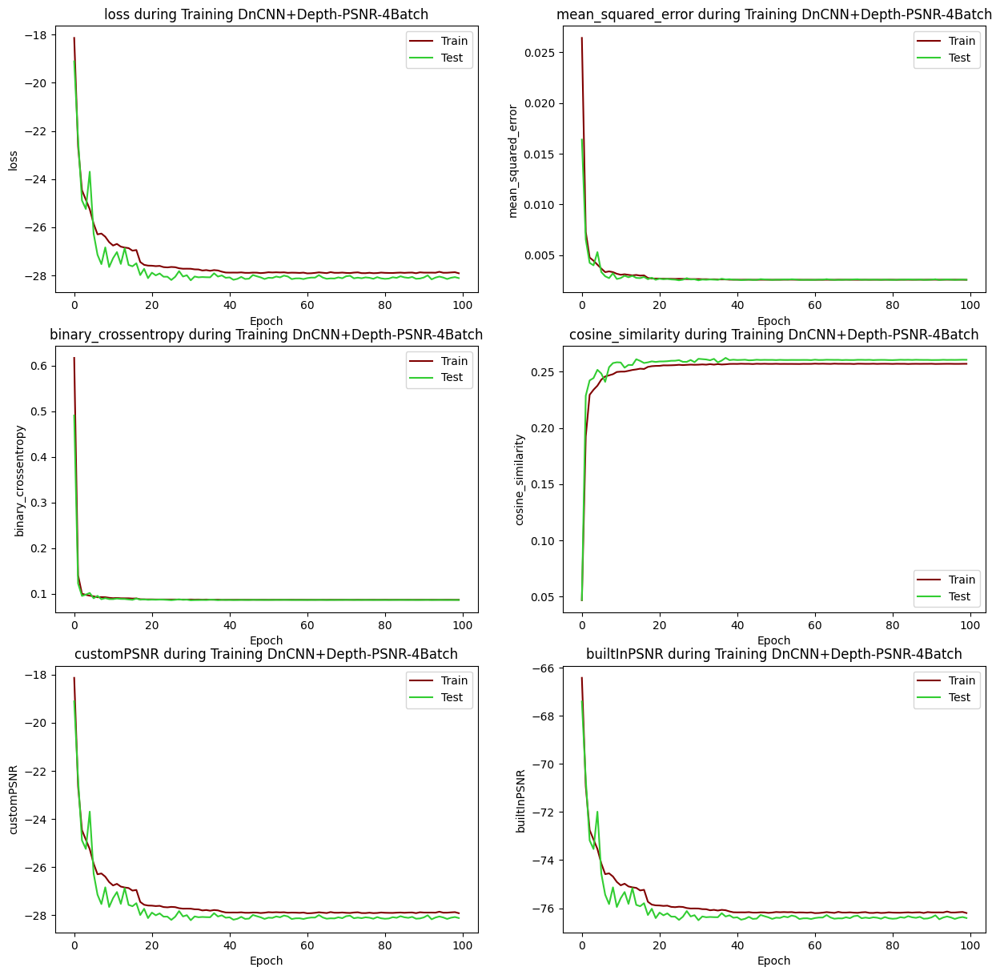

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

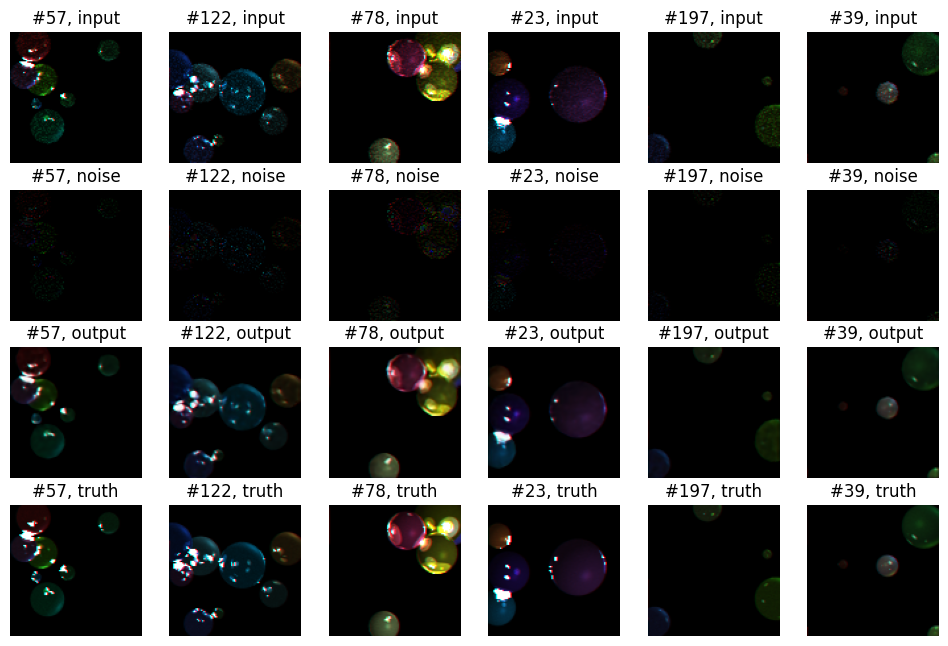

CPU times: total: 6min 3s
Wall time: 4min 30s


In [4]:
%%time

# Similar to "DnCNNPlusDepthPSNR", but with batch size being reduced again by half, to 2
# Performs similarly to above network.
# Thus, we will use batch size 8 in our optimal network.

def optimalModelTrial3(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = optimalModelTrial3(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'DnCNN+Depth-PSNR-4Batch', epochs = 100, batch_size = 4)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 internalConv0 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 internalConv1 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/1000
94/94 [==============================] - 2s 20ms/step - loss: -26.5406 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0918 - cosine_similarity: 0.2487 - customPSNR: -26.5406 - builtInPSNR: -74.8274 - val_loss: -25.7702 - val_mean_squared_error: 0.0035 - val_binary_crossentropy: 0.0891 - val_cosine_similarity: 0.2586 - val_customPSNR: -25.7702 - val_builtInPSNR: -74.0640 - lr: 0.0010
Epoch 15/1000
94/94 [==============================] - 2s 21ms/step - loss: -26.8807 - mean_squared_error: 0.0030 - binary_crossentropy: 0.0907 - cosine_similarity: 0.2497 - customPSNR: -26.8807 - builtInPSNR: -75.1674 - val_loss: -27.6387 - val_mean_squared_error: 0.0027 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2480 - val_customPSNR: -27.6387 - val_builtInPSNR: -75.9325 - lr: 0.0010
Epoch 16/1000
94/94 [==============================] - 2s 20ms/step - loss: -26.7877 - mean_squared_error: 0.0031 - binary_crossentropy: 0.0907 - cosine_similarity: 0.2507 - customPSNR: 

94/94 [==============================] - 2s 22ms/step - loss: -28.0380 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0869 - cosine_similarity: 0.2565 - customPSNR: -28.0380 - builtInPSNR: -76.3248 - val_loss: -28.4577 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0862 - val_cosine_similarity: 0.2595 - val_customPSNR: -28.4577 - val_builtInPSNR: -76.7515 - lr: 1.0000e-05
Epoch 53/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0366 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0868 - cosine_similarity: 0.2566 - customPSNR: -28.0366 - builtInPSNR: -76.3234 - val_loss: -28.4450 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0862 - val_cosine_similarity: 0.2595 - val_customPSNR: -28.4450 - val_builtInPSNR: -76.7387 - lr: 1.0000e-05
Epoch 54/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0607 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0868 - cosine_similarity: 0.2567 - customPSNR: -28.06

Epoch 71/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0359 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0868 - cosine_similarity: 0.2568 - customPSNR: -28.0359 - builtInPSNR: -76.3226 - val_loss: -28.4649 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0860 - val_cosine_similarity: 0.2597 - val_customPSNR: -28.4649 - val_builtInPSNR: -76.7587 - lr: 1.0000e-07
Epoch 72/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0476 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2568 - customPSNR: -28.0476 - builtInPSNR: -76.3344 - val_loss: -28.4906 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0860 - val_cosine_similarity: 0.2597 - val_customPSNR: -28.4906 - val_builtInPSNR: -76.7844 - lr: 1.0000e-07
Epoch 73/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0530 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2568 - cust

Epoch 108/1000
94/94 [==============================] - 2s 24ms/step - loss: -28.0789 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2568 - customPSNR: -28.0789 - builtInPSNR: -76.3656 - val_loss: -28.4818 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0860 - val_cosine_similarity: 0.2597 - val_customPSNR: -28.4818 - val_builtInPSNR: -76.7756 - lr: 1.0000e-11
Epoch 109/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0764 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2569 - customPSNR: -28.0764 - builtInPSNR: -76.3631 - val_loss: -28.5002 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0859 - val_cosine_similarity: 0.2598 - val_customPSNR: -28.5002 - val_builtInPSNR: -76.7941 - lr: 1.0000e-11
Epoch 110/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0276 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0868 - cosine_similarity: 0.2568 - c

Epoch 126/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0588 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2567 - customPSNR: -28.0588 - builtInPSNR: -76.3456 - val_loss: -28.4715 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0860 - val_cosine_similarity: 0.2597 - val_customPSNR: -28.4715 - val_builtInPSNR: -76.7653 - lr: 1.0000e-14
Epoch 127/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0577 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2569 - customPSNR: -28.0577 - builtInPSNR: -76.3445 - val_loss: -28.4742 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0860 - val_cosine_similarity: 0.2597 - val_customPSNR: -28.4742 - val_builtInPSNR: -76.7680 - lr: 1.0000e-14
Epoch 128/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0818 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2569 - c

Epoch 145/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0542 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2568 - customPSNR: -28.0542 - builtInPSNR: -76.3409 - val_loss: -28.4643 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0860 - val_cosine_similarity: 0.2598 - val_customPSNR: -28.4643 - val_builtInPSNR: -76.7581 - lr: 1.0000e-16
Epoch 146/1000
94/94 [==============================] - ETA: 0s - loss: -28.0698 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2568 - customPSNR: -28.0698 - builtInPSNR: -76.3566
Epoch 146: ReduceLROnPlateau reducing learning rate to 1.0000000830368326e-17.
94/94 [==============================] - 2s 22ms/step - loss: -28.0698 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2568 - customPSNR: -28.0698 - builtInPSNR: -76.3566 - val_loss: -28.4662 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0860 -

Epoch 163/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0657 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2568 - customPSNR: -28.0657 - builtInPSNR: -76.3525 - val_loss: -28.4969 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0860 - val_cosine_similarity: 0.2597 - val_customPSNR: -28.4969 - val_builtInPSNR: -76.7907 - lr: 1.0000e-19
Epoch 164/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0611 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2568 - customPSNR: -28.0611 - builtInPSNR: -76.3479 - val_loss: -28.4752 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0860 - val_cosine_similarity: 0.2597 - val_customPSNR: -28.4752 - val_builtInPSNR: -76.7690 - lr: 1.0000e-19
Epoch 165/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0773 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0866 - cosine_similarity: 0.2569 - c

94/94 [==============================] - 2s 22ms/step - loss: -28.0466 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0868 - cosine_similarity: 0.2568 - customPSNR: -28.0466 - builtInPSNR: -76.3334 - val_loss: -28.4461 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0861 - val_cosine_similarity: 0.2598 - val_customPSNR: -28.4461 - val_builtInPSNR: -76.7399 - lr: 1.0000e-21
Epoch 182/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0733 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2568 - customPSNR: -28.0733 - builtInPSNR: -76.3600 - val_loss: -28.4532 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0860 - val_cosine_similarity: 0.2598 - val_customPSNR: -28.4532 - val_builtInPSNR: -76.7470 - lr: 1.0000e-22
Epoch 183/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0609 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0867 - cosine_similarity: 0.2569 - customPSNR: -28.

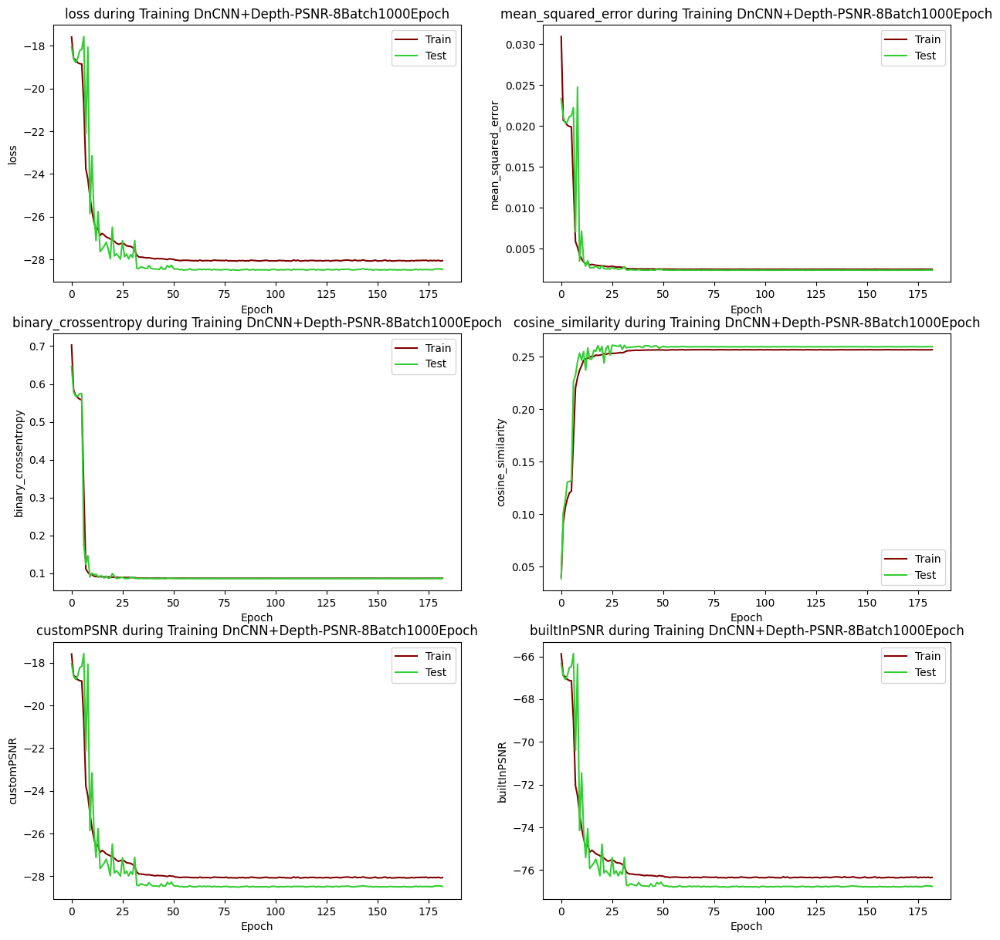

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

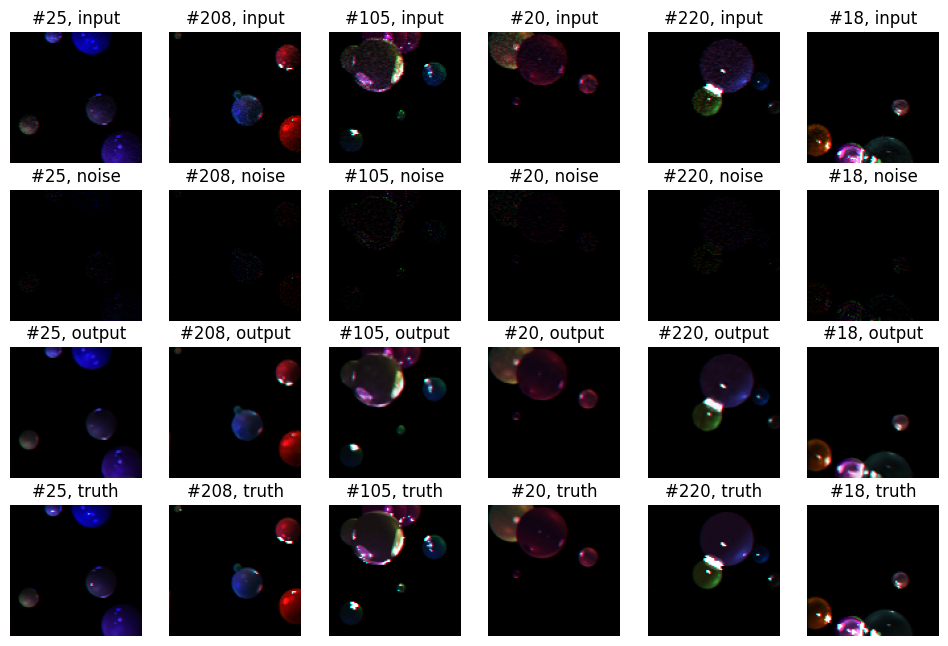

CPU times: total: 8min 29s
Wall time: 6min 32s


In [4]:
%%time

# Attempt with batch size = 8, but with an absurdly high epoch upper bound (1000)
# 183 epochs were completed before no more improvement occurred.

def optimalModelTrial4(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = optimalModelTrial4(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer='adam',
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'DnCNN+Depth-PSNR-8Batch1000Epoch', epochs = 1000, batch_size = 8)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 internalConv0 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_2 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                                 
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 internalConv1 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_3 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                      

Epoch 14/1000
94/94 [==============================] - 2s 21ms/step - loss: -26.6405 - mean_squared_error: 0.0031 - binary_crossentropy: 0.0928 - cosine_similarity: 0.2493 - customPSNR: -26.6405 - builtInPSNR: -74.9273 - val_loss: -27.2252 - val_mean_squared_error: 0.0028 - val_binary_crossentropy: 0.0874 - val_cosine_similarity: 0.2573 - val_customPSNR: -27.2252 - val_builtInPSNR: -75.5190 - lr: 3.0000e-04
Epoch 15/1000
94/94 [==============================] - 2s 21ms/step - loss: -26.6724 - mean_squared_error: 0.0031 - binary_crossentropy: 0.0923 - cosine_similarity: 0.2492 - customPSNR: -26.6724 - builtInPSNR: -74.9591 - val_loss: -26.4985 - val_mean_squared_error: 0.0032 - val_binary_crossentropy: 0.0897 - val_cosine_similarity: 0.2545 - val_customPSNR: -26.4985 - val_builtInPSNR: -74.7923 - lr: 3.0000e-04
Epoch 16/1000
94/94 [==============================] - 2s 21ms/step - loss: -26.8831 - mean_squared_error: 0.0030 - binary_crossentropy: 0.0914 - cosine_similarity: 0.2503 - cust

Epoch 34/1000
94/94 [==============================] - 2s 21ms/step - loss: -27.6060 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0881 - cosine_similarity: 0.2548 - customPSNR: -27.6060 - builtInPSNR: -75.8928 - val_loss: -23.2209 - val_mean_squared_error: 0.0050 - val_binary_crossentropy: 0.1187 - val_cosine_similarity: 0.2602 - val_customPSNR: -23.2209 - val_builtInPSNR: -71.5147 - lr: 3.0000e-04
Epoch 35/1000
94/94 [==============================] - -0s -450us/step - loss: -27.5919 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0884 - cosine_similarity: 0.2547 - customPSNR: -27.5919 - builtInPSNR: -75.8786 - val_loss: -27.8068 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0885 - val_cosine_similarity: 0.2552 - val_customPSNR: -27.8068 - val_builtInPSNR: -76.1006 - lr: 3.0000e-04
Epoch 36/1000
94/94 [==============================] - 2s 21ms/step - loss: -27.5998 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0880 - cosine_similarity: 0.2552 - c

Epoch 54/1000
94/94 [==============================] - 2s 21ms/step - loss: -27.8346 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0877 - cosine_similarity: 0.2554 - customPSNR: -27.8346 - builtInPSNR: -76.1213 - val_loss: -24.1812 - val_mean_squared_error: 0.0041 - val_binary_crossentropy: 0.1147 - val_cosine_similarity: 0.2614 - val_customPSNR: -24.1812 - val_builtInPSNR: -72.4750 - lr: 3.0000e-04
Epoch 55/1000
94/94 [==============================] - 2s 21ms/step - loss: -27.8422 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0876 - cosine_similarity: 0.2557 - customPSNR: -27.8422 - builtInPSNR: -76.1290 - val_loss: -28.2818 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0863 - val_cosine_similarity: 0.2582 - val_customPSNR: -28.2818 - val_builtInPSNR: -76.5756 - lr: 3.0000e-04
Epoch 56/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.0020 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2561 - cust

Epoch 74/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.2473 - mean_squared_error: 0.0024 - binary_crossentropy: 0.0870 - cosine_similarity: 0.2563 - customPSNR: -28.2473 - builtInPSNR: -76.5341 - val_loss: -28.4702 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0863 - val_cosine_similarity: 0.2582 - val_customPSNR: -28.4702 - val_builtInPSNR: -76.7640 - lr: 3.0000e-04
Epoch 75/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.2545 - mean_squared_error: 0.0024 - binary_crossentropy: 0.0869 - cosine_similarity: 0.2564 - customPSNR: -28.2545 - builtInPSNR: -76.5413 - val_loss: -28.4484 - val_mean_squared_error: 0.0023 - val_binary_crossentropy: 0.0862 - val_cosine_similarity: 0.2596 - val_customPSNR: -28.4484 - val_builtInPSNR: -76.7422 - lr: 3.0000e-04
Epoch 76/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.0947 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0873 - cosine_similarity: 0.2561 - cust

Epoch 111/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.7091 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - customPSNR: -28.7091 - builtInPSNR: -76.9958 - val_loss: -28.5116 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2592 - val_customPSNR: -28.5116 - val_builtInPSNR: -76.8054 - lr: 3.0000e-08
Epoch 112/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.7008 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - customPSNR: -28.7008 - builtInPSNR: -76.9876 - val_loss: -28.5131 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2592 - val_customPSNR: -28.5131 - val_builtInPSNR: -76.8069 - lr: 3.0000e-08
Epoch 113/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.7088 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - c

Epoch 129/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.7077 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - customPSNR: -28.7077 - builtInPSNR: -76.9945 - val_loss: -28.5114 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2593 - val_customPSNR: -28.5114 - val_builtInPSNR: -76.8051 - lr: 3.0000e-11
Epoch 130/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.7087 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - customPSNR: -28.7087 - builtInPSNR: -76.9955 - val_loss: -28.5102 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2593 - val_customPSNR: -28.5102 - val_builtInPSNR: -76.8040 - lr: 3.0000e-11
Epoch 131/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.7114 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2570 - c

Epoch 148/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.7073 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - customPSNR: -28.7073 - builtInPSNR: -76.9941 - val_loss: -28.5077 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2592 - val_customPSNR: -28.5077 - val_builtInPSNR: -76.8015 - lr: 3.0000e-13
Epoch 149/1000
91/94 [============================>.] - ETA: 0s - loss: -28.7506 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0858 - cosine_similarity: 0.2560 - customPSNR: -28.7506 - builtInPSNR: -77.0310
Epoch 149: ReduceLROnPlateau reducing learning rate to 3.0000001506429173e-14.
94/94 [==============================] - 2s 21ms/step - loss: -28.7044 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2570 - customPSNR: -28.7044 - builtInPSNR: -76.9912 - val_loss: -28.5076 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 -

Epoch 166/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.7061 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - customPSNR: -28.7061 - builtInPSNR: -76.9929 - val_loss: -28.5086 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2593 - val_customPSNR: -28.5086 - val_builtInPSNR: -76.8024 - lr: 3.0000e-16
Epoch 167/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.6989 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - customPSNR: -28.6989 - builtInPSNR: -76.9857 - val_loss: -28.5049 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2593 - val_customPSNR: -28.5049 - val_builtInPSNR: -76.7987 - lr: 3.0000e-16
Epoch 168/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.7031 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - c

94/94 [==============================] - 2s 21ms/step - loss: -28.7072 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - customPSNR: -28.7072 - builtInPSNR: -76.9939 - val_loss: -28.5039 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2593 - val_customPSNR: -28.5039 - val_builtInPSNR: -76.7977 - lr: 3.0000e-18
Epoch 185/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.7060 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - customPSNR: -28.7060 - builtInPSNR: -76.9928 - val_loss: -28.5115 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2593 - val_customPSNR: -28.5115 - val_builtInPSNR: -76.8054 - lr: 3.0000e-19
Epoch 186/1000
94/94 [==============================] - 2s 21ms/step - loss: -28.7096 - mean_squared_error: 0.0023 - binary_crossentropy: 0.0863 - cosine_similarity: 0.2571 - customPSNR: -28.

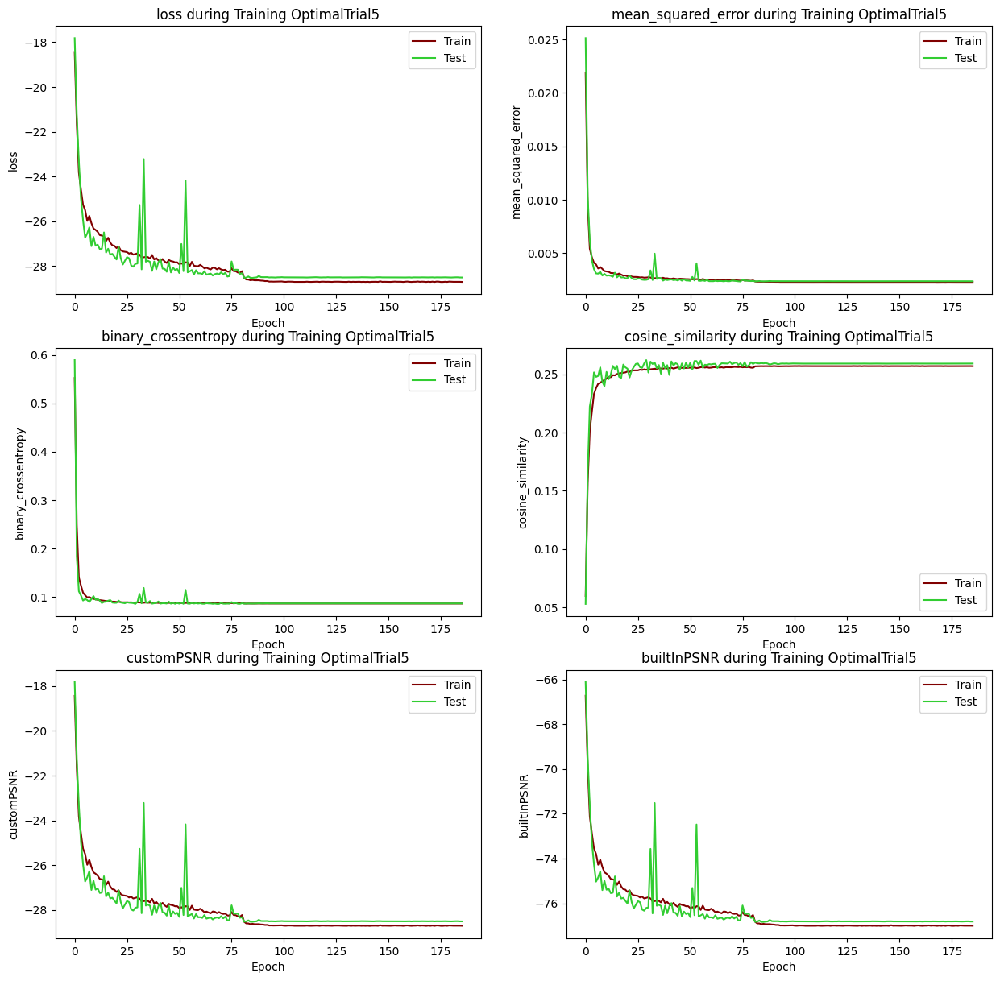

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

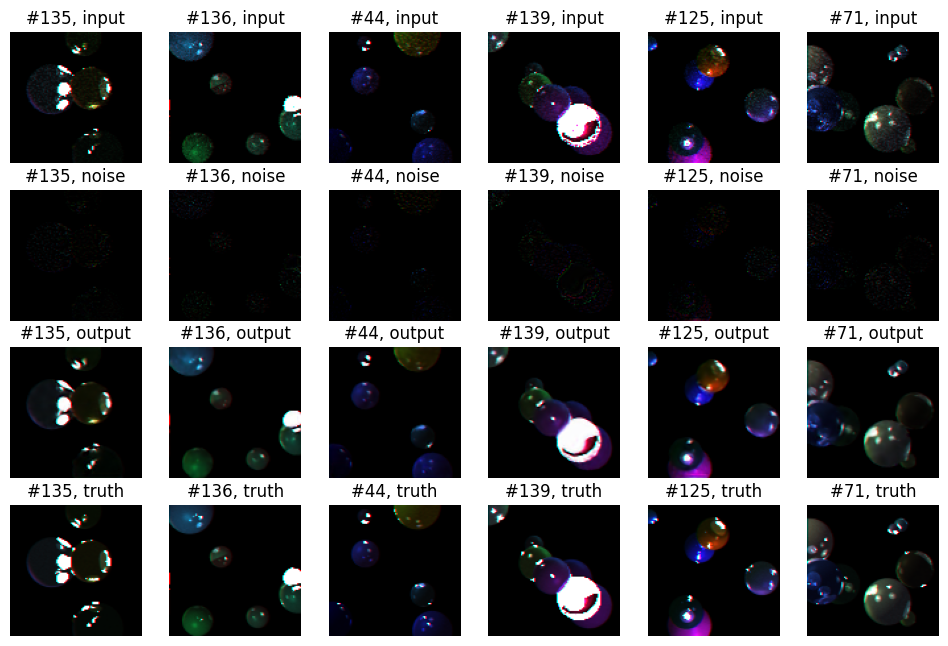

CPU times: total: 8min 4s
Wall time: 6min 8s


In [5]:
%%time

# Now, we will attempt to find the optimal settings for the optimizer
# Until now, we have been using Adam with default parameters.
# Let's try Adam with a different, lower learning rate

# Since the architecture of the network is unchanged, it is unneccessary to create a new compiling method
# However, we will create a new one anyway as to not break the mold.

def optimalModelTrial5(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))

    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = optimalModelTrial5(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer=tf.keras.optimizers.Adam(learning_rate=0.0003),
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'OptimalTrial5', epochs = 1000, batch_size = 8)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 internalConv0 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 internalConv1 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/1000
94/94 [==============================] - 2s 23ms/step - loss: -23.5289 - mean_squared_error: 0.0057 - binary_crossentropy: 0.1723 - cosine_similarity: 0.1818 - customPSNR: -23.5289 - builtInPSNR: -71.8157 - val_loss: -24.1800 - val_mean_squared_error: 0.0048 - val_binary_crossentropy: 0.1777 - val_cosine_similarity: 0.1754 - val_customPSNR: -24.1800 - val_builtInPSNR: -72.4738 - lr: 3.0000e-04
Epoch 15/1000
94/94 [==============================] - 2s 23ms/step - loss: -23.6778 - mean_squared_error: 0.0055 - binary_crossentropy: 0.1655 - cosine_similarity: 0.1872 - customPSNR: -23.6778 - builtInPSNR: -71.9645 - val_loss: -24.0754 - val_mean_squared_error: 0.0049 - val_binary_crossentropy: 0.1718 - val_cosine_similarity: 0.1818 - val_customPSNR: -24.0754 - val_builtInPSNR: -72.3692 - lr: 3.0000e-04
Epoch 16/1000
94/94 [==============================] - 2s 24ms/step - loss: -23.8538 - mean_squared_error: 0.0053 - binary_crossentropy: 0.1595 - cosine_similarity: 0.1909 - cust

Epoch 34/1000
94/94 [==============================] - 2s 23ms/step - loss: -25.2754 - mean_squared_error: 0.0040 - binary_crossentropy: 0.1130 - cosine_similarity: 0.2280 - customPSNR: -25.2754 - builtInPSNR: -73.5622 - val_loss: -25.0782 - val_mean_squared_error: 0.0039 - val_binary_crossentropy: 0.0970 - val_cosine_similarity: 0.2441 - val_customPSNR: -25.0782 - val_builtInPSNR: -73.3720 - lr: 3.0000e-04
Epoch 35/1000
94/94 [==============================] - 2s 24ms/step - loss: -25.3454 - mean_squared_error: 0.0039 - binary_crossentropy: 0.1115 - cosine_similarity: 0.2292 - customPSNR: -25.3454 - builtInPSNR: -73.6322 - val_loss: -25.6782 - val_mean_squared_error: 0.0038 - val_binary_crossentropy: 0.1148 - val_cosine_similarity: 0.2299 - val_customPSNR: -25.6782 - val_builtInPSNR: -73.9720 - lr: 3.0000e-04
Epoch 36/1000
94/94 [==============================] - 2s 24ms/step - loss: -25.3879 - mean_squared_error: 0.0039 - binary_crossentropy: 0.1102 - cosine_similarity: 0.2301 - cust

Epoch 54/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.2552 - mean_squared_error: 0.0033 - binary_crossentropy: 0.0975 - cosine_similarity: 0.2412 - customPSNR: -26.2552 - builtInPSNR: -74.5419 - val_loss: -27.0412 - val_mean_squared_error: 0.0030 - val_binary_crossentropy: 0.0935 - val_cosine_similarity: 0.2459 - val_customPSNR: -27.0412 - val_builtInPSNR: -75.3350 - lr: 3.0000e-05
Epoch 55/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.3884 - mean_squared_error: 0.0033 - binary_crossentropy: 0.0962 - cosine_similarity: 0.2423 - customPSNR: -26.3884 - builtInPSNR: -74.6752 - val_loss: -27.0464 - val_mean_squared_error: 0.0030 - val_binary_crossentropy: 0.0932 - val_cosine_similarity: 0.2468 - val_customPSNR: -27.0464 - val_builtInPSNR: -75.3402 - lr: 3.0000e-05
Epoch 56/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.3220 - mean_squared_error: 0.0033 - binary_crossentropy: 0.0966 - cosine_similarity: 0.2420 - cust

Epoch 74/1000
94/94 [==============================] - 2s 24ms/step - loss: -26.4429 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0957 - cosine_similarity: 0.2426 - customPSNR: -26.4429 - builtInPSNR: -74.7297 - val_loss: -27.0300 - val_mean_squared_error: 0.0030 - val_binary_crossentropy: 0.0949 - val_cosine_similarity: 0.2448 - val_customPSNR: -27.0300 - val_builtInPSNR: -75.3238 - lr: 3.0000e-05
Epoch 75/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4332 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0953 - cosine_similarity: 0.2433 - customPSNR: -26.4332 - builtInPSNR: -74.7200 - val_loss: -27.0788 - val_mean_squared_error: 0.0030 - val_binary_crossentropy: 0.0933 - val_cosine_similarity: 0.2472 - val_customPSNR: -27.0788 - val_builtInPSNR: -75.3726 - lr: 3.0000e-05
Epoch 76/1000
94/94 [==============================] - 2s 24ms/step - loss: -26.4296 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0952 - cosine_similarity: 0.2434 - cust

Epoch 111/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4849 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0950 - cosine_similarity: 0.2438 - customPSNR: -26.4849 - builtInPSNR: -74.7717 - val_loss: -27.1475 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0927 - val_cosine_similarity: 0.2473 - val_customPSNR: -27.1475 - val_builtInPSNR: -75.4413 - lr: 3.0000e-09
Epoch 112/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4857 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0949 - cosine_similarity: 0.2439 - customPSNR: -26.4857 - builtInPSNR: -74.7725 - val_loss: -27.1418 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0929 - val_cosine_similarity: 0.2471 - val_customPSNR: -27.1418 - val_builtInPSNR: -75.4356 - lr: 3.0000e-09
Epoch 113/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4807 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0948 - cosine_similarity: 0.2438 - c

Epoch 130/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4922 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0949 - cosine_similarity: 0.2437 - customPSNR: -26.4922 - builtInPSNR: -74.7790 - val_loss: -27.1369 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0930 - val_cosine_similarity: 0.2470 - val_customPSNR: -27.1369 - val_builtInPSNR: -75.4307 - lr: 3.0000e-11
Epoch 131/1000
94/94 [==============================] - ETA: 0s - loss: -26.4736 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0952 - cosine_similarity: 0.2437 - customPSNR: -26.4736 - builtInPSNR: -74.7604
Epoch 131: ReduceLROnPlateau reducing learning rate to 3.0000002482211132e-12.
94/94 [==============================] - 2s 23ms/step - loss: -26.4736 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0952 - cosine_similarity: 0.2437 - customPSNR: -26.4736 - builtInPSNR: -74.7604 - val_loss: -27.1429 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0929 -

Epoch 148/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4794 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0948 - cosine_similarity: 0.2437 - customPSNR: -26.4794 - builtInPSNR: -74.7662 - val_loss: -27.1377 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2472 - val_customPSNR: -27.1377 - val_builtInPSNR: -75.4315 - lr: 3.0000e-14
Epoch 149/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.5086 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0948 - cosine_similarity: 0.2439 - customPSNR: -26.5086 - builtInPSNR: -74.7954 - val_loss: -27.1474 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2472 - val_customPSNR: -27.1474 - val_builtInPSNR: -75.4412 - lr: 3.0000e-14
Epoch 150/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4816 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0948 - cosine_similarity: 0.2438 - c

94/94 [==============================] - 2s 23ms/step - loss: -26.4756 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0947 - cosine_similarity: 0.2439 - customPSNR: -26.4756 - builtInPSNR: -74.7624 - val_loss: -27.1458 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0927 - val_cosine_similarity: 0.2475 - val_customPSNR: -27.1458 - val_builtInPSNR: -75.4396 - lr: 3.0000e-16
Epoch 167/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4891 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0951 - cosine_similarity: 0.2436 - customPSNR: -26.4891 - builtInPSNR: -74.7759 - val_loss: -27.1402 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2474 - val_customPSNR: -27.1402 - val_builtInPSNR: -75.4340 - lr: 3.0000e-17
Epoch 168/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4606 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0948 - cosine_similarity: 0.2438 - customPSNR: -26.

Epoch 185/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.5025 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0949 - cosine_similarity: 0.2440 - customPSNR: -26.5025 - builtInPSNR: -74.7893 - val_loss: -27.1418 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2473 - val_customPSNR: -27.1418 - val_builtInPSNR: -75.4356 - lr: 3.0000e-19
Epoch 186/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4917 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0950 - cosine_similarity: 0.2436 - customPSNR: -26.4917 - builtInPSNR: -74.7785 - val_loss: -27.1449 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0927 - val_cosine_similarity: 0.2474 - val_customPSNR: -27.1449 - val_builtInPSNR: -75.4387 - lr: 3.0000e-19
Epoch 187/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4634 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0950 - cosine_similarity: 0.2437 - c

Epoch 204/1000
94/94 [==============================] - ETA: 0s - loss: -26.4670 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0950 - cosine_similarity: 0.2438 - customPSNR: -26.4670 - builtInPSNR: -74.7538
Epoch 204: ReduceLROnPlateau reducing learning rate to 3.000000510641743e-22.
94/94 [==============================] - 2s 23ms/step - loss: -26.4670 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0950 - cosine_similarity: 0.2438 - customPSNR: -26.4670 - builtInPSNR: -74.7538 - val_loss: -27.1478 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2474 - val_customPSNR: -27.1478 - val_builtInPSNR: -75.4416 - lr: 3.0000e-21
Epoch 205/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.5151 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0946 - cosine_similarity: 0.2441 - customPSNR: -26.5151 - builtInPSNR: -74.8019 - val_loss: -27.1400 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0928 - 

Epoch 222/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4549 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0952 - cosine_similarity: 0.2435 - customPSNR: -26.4549 - builtInPSNR: -74.7417 - val_loss: -27.1455 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2472 - val_customPSNR: -27.1455 - val_builtInPSNR: -75.4393 - lr: 3.0000e-24
Epoch 223/1000
94/94 [==============================] - 2s 24ms/step - loss: -26.4846 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0949 - cosine_similarity: 0.2439 - customPSNR: -26.4846 - builtInPSNR: -74.7714 - val_loss: -27.1422 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2472 - val_customPSNR: -27.1422 - val_builtInPSNR: -75.4360 - lr: 3.0000e-24
Epoch 224/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4628 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0948 - cosine_similarity: 0.2441 - c

Epoch 240/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4592 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0951 - cosine_similarity: 0.2437 - customPSNR: -26.4592 - builtInPSNR: -74.7460 - val_loss: -27.1410 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0929 - val_cosine_similarity: 0.2472 - val_customPSNR: -27.1410 - val_builtInPSNR: -75.4348 - lr: 3.0000e-27
Epoch 241/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.5097 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0948 - cosine_similarity: 0.2438 - customPSNR: -26.5097 - builtInPSNR: -74.7965 - val_loss: -27.1453 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2474 - val_customPSNR: -27.1453 - val_builtInPSNR: -75.4391 - lr: 3.0000e-27
Epoch 242/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.5178 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0946 - cosine_similarity: 0.2441 - c

Epoch 259/1000
94/94 [==============================] - 2s 23ms/step - loss: -26.4634 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0950 - cosine_similarity: 0.2438 - customPSNR: -26.4634 - builtInPSNR: -74.7502 - val_loss: -27.1397 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0928 - val_cosine_similarity: 0.2473 - val_customPSNR: -27.1397 - val_builtInPSNR: -75.4335 - lr: 3.0000e-29
Epoch 260/1000
94/94 [==============================] - ETA: 0s - loss: -26.4815 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0951 - cosine_similarity: 0.2434 - customPSNR: -26.4815 - builtInPSNR: -74.7683
Epoch 260: ReduceLROnPlateau reducing learning rate to 3.0000003104397846e-30.
94/94 [==============================] - 2s 23ms/step - loss: -26.4815 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0951 - cosine_similarity: 0.2434 - customPSNR: -26.4815 - builtInPSNR: -74.7683 - val_loss: -27.1429 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0929 -

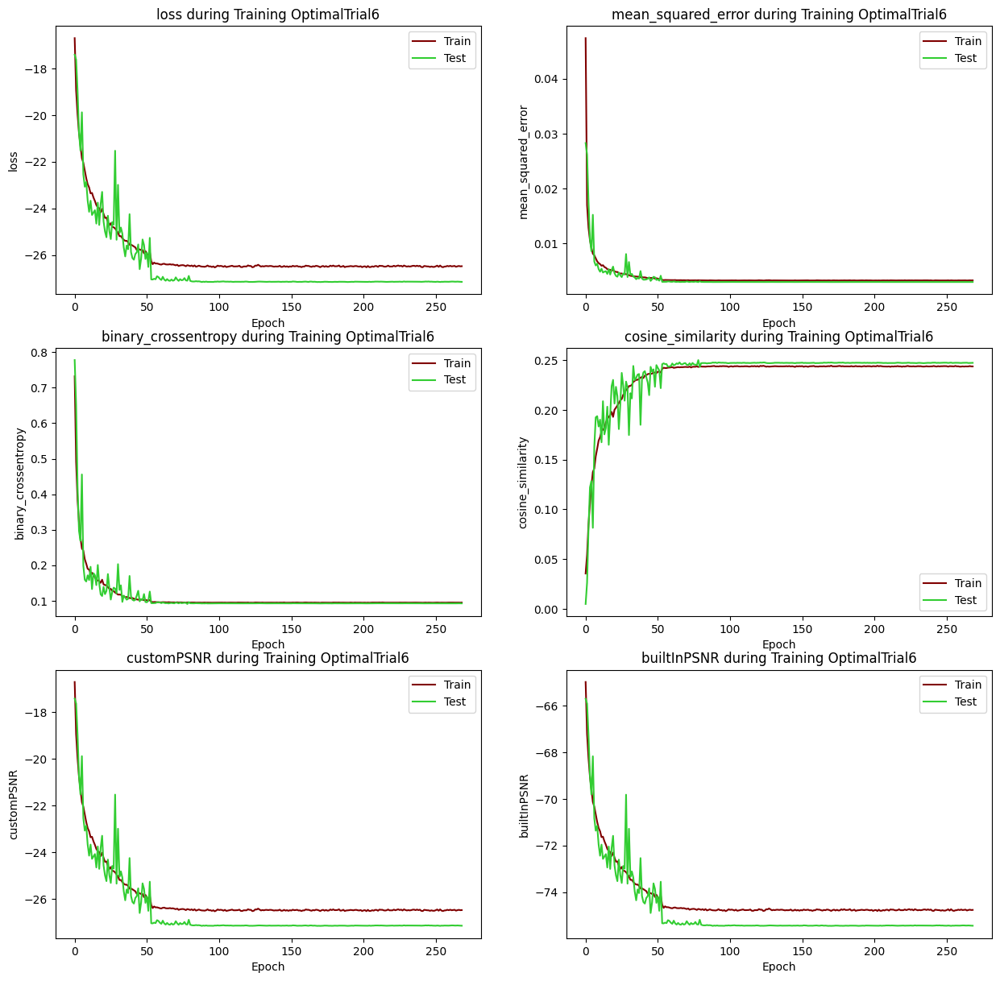

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

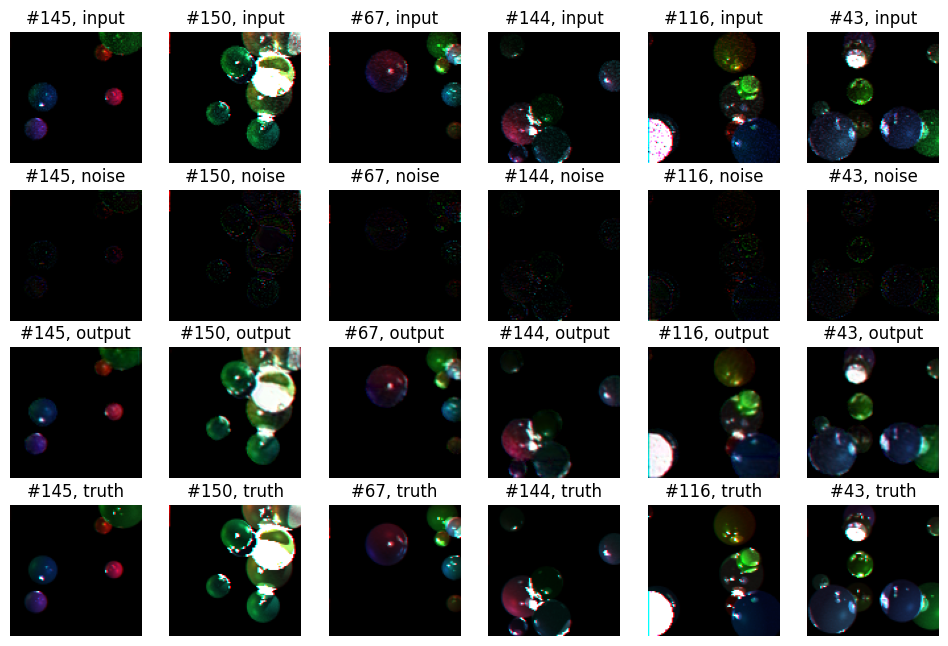

CPU times: total: 12min 55s
Wall time: 9min 56s


In [4]:
%%time

# Let's try using SGD (Stochastic gradient descent) instead. SGD tends to converge slower, but can produce better results
# The lower learning rate greatly helped Adam. Maybe it will work even better with SGD!

def optimalModelTrial6(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = optimalModelTrial6(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer=tf.keras.optimizers.SGD(
                                learning_rate=0.0003, momentum=0.0, nesterov=False),
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'OptimalTrial6', epochs = 1000, batch_size = 8)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 internalConv0 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 internalConv1 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                        

Epoch 14/1000
94/94 [==============================] - 2s 24ms/step - loss: -26.4281 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0977 - cosine_similarity: 0.2432 - customPSNR: -26.4281 - builtInPSNR: -74.7148 - val_loss: -26.8400 - val_mean_squared_error: 0.0030 - val_binary_crossentropy: 0.0943 - val_cosine_similarity: 0.2491 - val_customPSNR: -26.8400 - val_builtInPSNR: -75.1338 - lr: 3.0000e-04
Epoch 15/1000
94/94 [==============================] - 2s 24ms/step - loss: -26.4269 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0970 - cosine_similarity: 0.2439 - customPSNR: -26.4269 - builtInPSNR: -74.7137 - val_loss: -27.0225 - val_mean_squared_error: 0.0029 - val_binary_crossentropy: 0.0931 - val_cosine_similarity: 0.2504 - val_customPSNR: -27.0225 - val_builtInPSNR: -75.3163 - lr: 3.0000e-04
Epoch 16/1000
94/94 [==============================] - 2s 25ms/step - loss: -26.3607 - mean_squared_error: 0.0033 - binary_crossentropy: 0.0969 - cosine_similarity: 0.2441 - cust

Epoch 34/1000
94/94 [==============================] - 2s 24ms/step - loss: -27.3439 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0898 - cosine_similarity: 0.2520 - customPSNR: -27.3439 - builtInPSNR: -75.6307 - val_loss: -27.7887 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0882 - val_cosine_similarity: 0.2543 - val_customPSNR: -27.7887 - val_builtInPSNR: -76.0825 - lr: 3.0000e-04
Epoch 35/1000
94/94 [==============================] - ETA: 0s - loss: -27.4652 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0891 - cosine_similarity: 0.2526 - customPSNR: -27.4652 - builtInPSNR: -75.7519
Epoch 35: ReduceLROnPlateau reducing learning rate to 3.000000142492354e-05.
94/94 [==============================] - 2s 24ms/step - loss: -27.4652 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0891 - cosine_similarity: 0.2526 - customPSNR: -27.4652 - builtInPSNR: -75.7519 - val_loss: -27.7786 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0891 - val

Epoch 73/1000
94/94 [==============================] - 2s 24ms/step - loss: -27.8581 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0876 - cosine_similarity: 0.2550 - customPSNR: -27.8581 - builtInPSNR: -76.1449 - val_loss: -28.2413 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0872 - val_cosine_similarity: 0.2567 - val_customPSNR: -28.2413 - val_builtInPSNR: -76.5351 - lr: 3.0000e-05
Epoch 74/1000
94/94 [==============================] - 2s 24ms/step - loss: -27.8398 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0875 - cosine_similarity: 0.2550 - customPSNR: -27.8398 - builtInPSNR: -76.1266 - val_loss: -28.2128 - val_mean_squared_error: 0.0025 - val_binary_crossentropy: 0.0872 - val_cosine_similarity: 0.2571 - val_customPSNR: -28.2128 - val_builtInPSNR: -76.5066 - lr: 3.0000e-05
Epoch 75/1000
94/94 [==============================] - 2s 23ms/step - loss: -27.8719 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0876 - cosine_similarity: 0.2549 - cust

Epoch 110/1000
94/94 [==============================] - 2s 24ms/step - loss: -27.9071 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0874 - cosine_similarity: 0.2552 - customPSNR: -27.9071 - builtInPSNR: -76.1939 - val_loss: -28.2585 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0868 - val_cosine_similarity: 0.2576 - val_customPSNR: -28.2585 - val_builtInPSNR: -76.5523 - lr: 3.0000e-09
Epoch 111/1000
94/94 [==============================] - 2s 24ms/step - loss: -27.8946 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0874 - cosine_similarity: 0.2551 - customPSNR: -27.8946 - builtInPSNR: -76.1814 - val_loss: -28.2569 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0868 - val_cosine_similarity: 0.2577 - val_customPSNR: -28.2569 - val_builtInPSNR: -76.5507 - lr: 3.0000e-09
Epoch 112/1000
94/94 [==============================] - 2s 24ms/step - loss: -27.8968 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0874 - cosine_similarity: 0.2552 - c

Epoch 129/1000
94/94 [==============================] - 2s 24ms/step - loss: -27.9132 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0873 - cosine_similarity: 0.2552 - customPSNR: -27.9132 - builtInPSNR: -76.2000 - val_loss: -28.2574 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0867 - val_cosine_similarity: 0.2577 - val_customPSNR: -28.2574 - val_builtInPSNR: -76.5512 - lr: 3.0000e-11
Epoch 130/1000
94/94 [==============================] - ETA: 0s - loss: -27.8924 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0875 - cosine_similarity: 0.2550 - customPSNR: -27.8924 - builtInPSNR: -76.1792
Epoch 130: ReduceLROnPlateau reducing learning rate to 3.0000002482211132e-12.
94/94 [==============================] - 2s 24ms/step - loss: -27.8924 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0875 - cosine_similarity: 0.2550 - customPSNR: -27.8924 - builtInPSNR: -76.1792 - val_loss: -28.2534 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0868 -

Epoch 147/1000
94/94 [==============================] - 2s 24ms/step - loss: -27.8957 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0875 - cosine_similarity: 0.2551 - customPSNR: -27.8957 - builtInPSNR: -76.1825 - val_loss: -28.2537 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0868 - val_cosine_similarity: 0.2576 - val_customPSNR: -28.2537 - val_builtInPSNR: -76.5475 - lr: 3.0000e-14
Epoch 148/1000
94/94 [==============================] - 2s 23ms/step - loss: -27.9009 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0874 - cosine_similarity: 0.2552 - customPSNR: -27.9009 - builtInPSNR: -76.1877 - val_loss: -28.2562 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0868 - val_cosine_similarity: 0.2576 - val_customPSNR: -28.2562 - val_builtInPSNR: -76.5500 - lr: 3.0000e-14
Epoch 149/1000
94/94 [==============================] - 2s 24ms/step - loss: -27.9081 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0874 - cosine_similarity: 0.2551 - c

94/94 [==============================] - 2s 24ms/step - loss: -27.8981 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0875 - cosine_similarity: 0.2552 - customPSNR: -27.8981 - builtInPSNR: -76.1849 - val_loss: -28.2505 - val_mean_squared_error: 0.0025 - val_binary_crossentropy: 0.0868 - val_cosine_similarity: 0.2577 - val_customPSNR: -28.2505 - val_builtInPSNR: -76.5443 - lr: 3.0000e-16
Epoch 166/1000
94/94 [==============================] - 2s 23ms/step - loss: -27.9155 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0874 - cosine_similarity: 0.2552 - customPSNR: -27.9155 - builtInPSNR: -76.2022 - val_loss: -28.2503 - val_mean_squared_error: 0.0025 - val_binary_crossentropy: 0.0868 - val_cosine_similarity: 0.2577 - val_customPSNR: -28.2503 - val_builtInPSNR: -76.5441 - lr: 3.0000e-17
Epoch 167/1000
94/94 [==============================] - 2s 24ms/step - loss: -27.9054 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0874 - cosine_similarity: 0.2552 - customPSNR: -27.

Epoch 184/1000
94/94 [==============================] - 2s 24ms/step - loss: -27.9091 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0874 - cosine_similarity: 0.2552 - customPSNR: -27.9091 - builtInPSNR: -76.1958 - val_loss: -28.2551 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0868 - val_cosine_similarity: 0.2577 - val_customPSNR: -28.2551 - val_builtInPSNR: -76.5489 - lr: 3.0000e-19
Epoch 185/1000
94/94 [==============================] - 2s 23ms/step - loss: -27.9152 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0874 - cosine_similarity: 0.2553 - customPSNR: -27.9152 - builtInPSNR: -76.2020 - val_loss: -28.2595 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0867 - val_cosine_similarity: 0.2577 - val_customPSNR: -28.2595 - val_builtInPSNR: -76.5533 - lr: 3.0000e-19
Epoch 186/1000
93/94 [============================>.] - ETA: 0s - loss: -27.9130 - mean_squared_error: 0.0026 - binary_crossentropy: 0.0874 - cosine_similarity: 0.2552 - custom

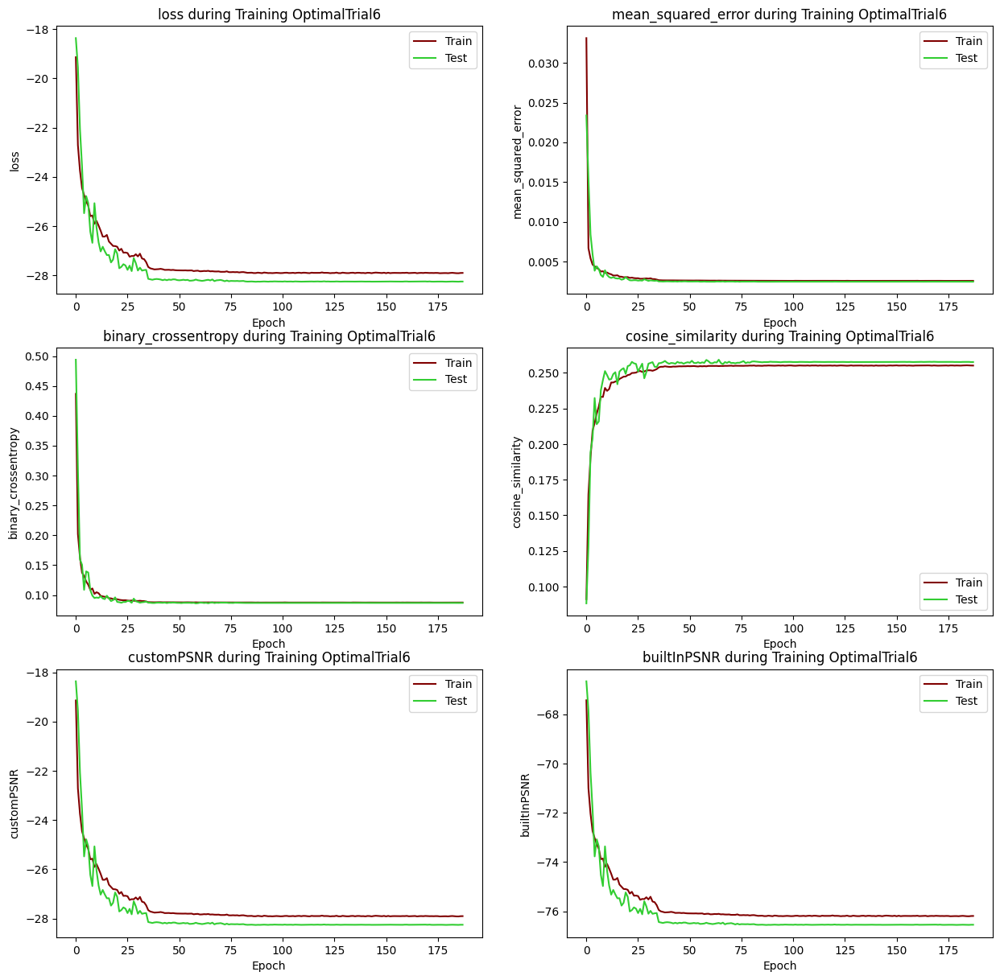

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

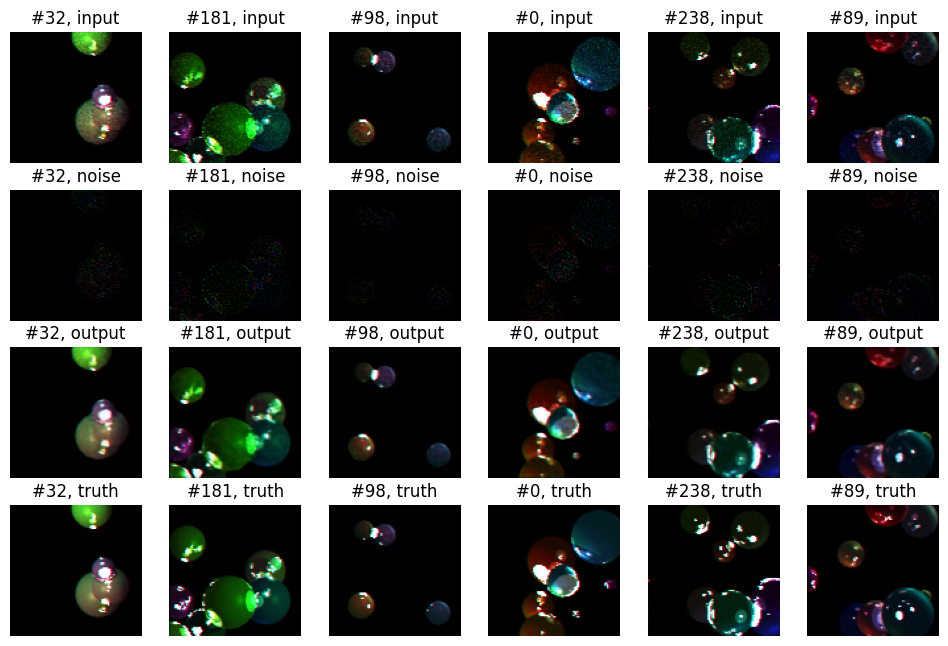

CPU times: total: 9min 13s
Wall time: 7min 8s


In [4]:
%%time

# SGD got trapped in a valley and didn't perform too well.
# Especially in the example images, it is clear noise wasn't correctly learned.
# Thus, let's look into modifying Adam, fist by enabling :AMSGrad from "On the Convergence of Adam and Beyond"

def optimalModelTrial6(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = optimalModelTrial6(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer=tf.keras.optimizers.Adam(learning_rate=0.0003, amsgrad = True),
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'OptimalTrial6', epochs = 1000, batch_size = 8)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 internalConv0 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_5 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                                 
                                                                 
 activation_5 (Activation)   (None, 100, 100, 64)      0         
                                                                 
 internalConv1 (Conv2D)      (None, 100, 100, 64)      36864     
                                                                 
 batch_normalization_6 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                      

Epoch 14/1000
94/94 [==============================] - 2s 21ms/step - loss: -24.8589 - mean_squared_error: 0.0046 - binary_crossentropy: 0.1048 - cosine_similarity: 0.2329 - customPSNR: -24.8589 - builtInPSNR: -73.1457 - val_loss: -24.5051 - val_mean_squared_error: 0.0047 - val_binary_crossentropy: 0.1221 - val_cosine_similarity: 0.2136 - val_customPSNR: -24.5051 - val_builtInPSNR: -72.7989 - lr: 3.0000e-04
Epoch 15/1000
94/94 [==============================] - 2s 21ms/step - loss: -25.2369 - mean_squared_error: 0.0043 - binary_crossentropy: 0.1006 - cosine_similarity: 0.2372 - customPSNR: -25.2369 - builtInPSNR: -73.5237 - val_loss: -24.2054 - val_mean_squared_error: 0.0048 - val_binary_crossentropy: 0.0966 - val_cosine_similarity: 0.2371 - val_customPSNR: -24.2054 - val_builtInPSNR: -72.4992 - lr: 3.0000e-04
Epoch 16/1000
94/94 [==============================] - 2s 21ms/step - loss: -25.3025 - mean_squared_error: 0.0042 - binary_crossentropy: 0.1000 - cosine_similarity: 0.2379 - cust

Epoch 53/1000
94/94 [==============================] - 2s 21ms/step - loss: -27.2282 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0890 - cosine_similarity: 0.2518 - customPSNR: -27.2282 - builtInPSNR: -75.5150 - val_loss: -27.5354 - val_mean_squared_error: 0.0027 - val_binary_crossentropy: 0.0874 - val_cosine_similarity: 0.2566 - val_customPSNR: -27.5354 - val_builtInPSNR: -75.8292 - lr: 3.0000e-05
Epoch 54/1000
94/94 [==============================] - 2s 21ms/step - loss: -27.2075 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0890 - cosine_similarity: 0.2513 - customPSNR: -27.2075 - builtInPSNR: -75.4943 - val_loss: -27.9307 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0870 - val_cosine_similarity: 0.2565 - val_customPSNR: -27.9307 - val_builtInPSNR: -76.2245 - lr: 3.0000e-05
Epoch 55/1000
94/94 [==============================] - 2s 21ms/step - loss: -27.2725 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0889 - cosine_similarity: 0.2521 - cust

94/94 [==============================] - 2s 21ms/step - loss: -27.3630 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2522 - customPSNR: -27.3630 - builtInPSNR: -75.6498 - val_loss: -27.9580 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0875 - val_cosine_similarity: 0.2557 - val_customPSNR: -27.9580 - val_builtInPSNR: -76.2518 - lr: 3.0000e-08
Epoch 91/1000
94/94 [==============================] - 2s 21ms/step - loss: -27.3628 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2523 - customPSNR: -27.3628 - builtInPSNR: -75.6496 - val_loss: -27.9620 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0874 - val_cosine_similarity: 0.2557 - val_customPSNR: -27.9620 - val_builtInPSNR: -76.2558 - lr: 3.0000e-09
Epoch 92/1000
94/94 [==============================] - 2s 21ms/step - loss: -27.3760 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2523 - customPSNR: -27.37

Epoch 109/1000
94/94 [==============================] - 2s 21ms/step - loss: -27.3535 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2523 - customPSNR: -27.3535 - builtInPSNR: -75.6402 - val_loss: -27.9615 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0875 - val_cosine_similarity: 0.2556 - val_customPSNR: -27.9615 - val_builtInPSNR: -76.2553 - lr: 3.0000e-11
Epoch 110/1000
94/94 [==============================] - 2s 23ms/step - loss: -27.3786 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0885 - cosine_similarity: 0.2525 - customPSNR: -27.3786 - builtInPSNR: -75.6654 - val_loss: -27.9639 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0874 - val_cosine_similarity: 0.2558 - val_customPSNR: -27.9639 - val_builtInPSNR: -76.2577 - lr: 3.0000e-11
Epoch 111/1000
94/94 [==============================] - ETA: 0s - loss: -27.3863 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2522 - custom

Epoch 127/1000
94/94 [==============================] - 2s 21ms/step - loss: -27.3779 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2522 - customPSNR: -27.3779 - builtInPSNR: -75.6647 - val_loss: -27.9592 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0875 - val_cosine_similarity: 0.2557 - val_customPSNR: -27.9592 - val_builtInPSNR: -76.2530 - lr: 3.0000e-14
Epoch 128/1000
94/94 [==============================] - 2s 20ms/step - loss: -27.3605 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0887 - cosine_similarity: 0.2521 - customPSNR: -27.3605 - builtInPSNR: -75.6473 - val_loss: -27.9564 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0875 - val_cosine_similarity: 0.2557 - val_customPSNR: -27.9564 - val_builtInPSNR: -76.2502 - lr: 3.0000e-14
Epoch 129/1000
94/94 [==============================] - 2s 20ms/step - loss: -27.3883 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0885 - cosine_similarity: 0.2525 - c

Epoch 146/1000
94/94 [==============================] - ETA: 0s - loss: -27.3701 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2523 - customPSNR: -27.3701 - builtInPSNR: -75.6568
Epoch 146: ReduceLROnPlateau reducing learning rate to 3.000000381459396e-17.
94/94 [==============================] - 2s 20ms/step - loss: -27.3701 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2523 - customPSNR: -27.3701 - builtInPSNR: -75.6568 - val_loss: -27.9595 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0875 - val_cosine_similarity: 0.2555 - val_customPSNR: -27.9595 - val_builtInPSNR: -76.2533 - lr: 3.0000e-16
Epoch 147/1000
94/94 [==============================] - 2s 20ms/step - loss: -27.3776 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2523 - customPSNR: -27.3776 - builtInPSNR: -75.6644 - val_loss: -27.9612 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0874 - 

Epoch 164/1000
94/94 [==============================] - 2s 22ms/step - loss: -27.3793 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0885 - cosine_similarity: 0.2524 - customPSNR: -27.3793 - builtInPSNR: -75.6661 - val_loss: -27.9614 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0874 - val_cosine_similarity: 0.2557 - val_customPSNR: -27.9614 - val_builtInPSNR: -76.2552 - lr: 3.0000e-19
Epoch 165/1000
94/94 [==============================] - 2s 22ms/step - loss: -27.3645 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2522 - customPSNR: -27.3645 - builtInPSNR: -75.6513 - val_loss: -27.9608 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0875 - val_cosine_similarity: 0.2557 - val_customPSNR: -27.9608 - val_builtInPSNR: -76.2546 - lr: 3.0000e-19
Epoch 166/1000
94/94 [==============================] - 2s 22ms/step - loss: -27.3855 - mean_squared_error: 0.0028 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2523 - c

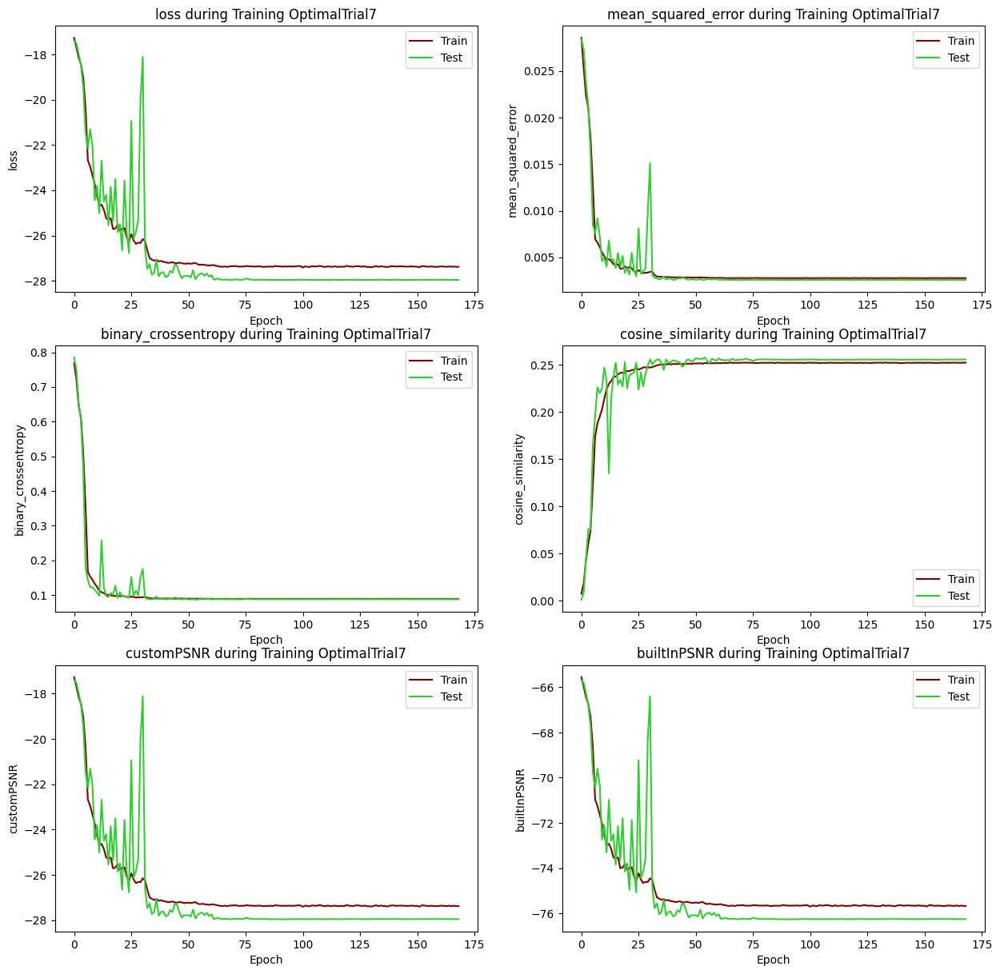

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

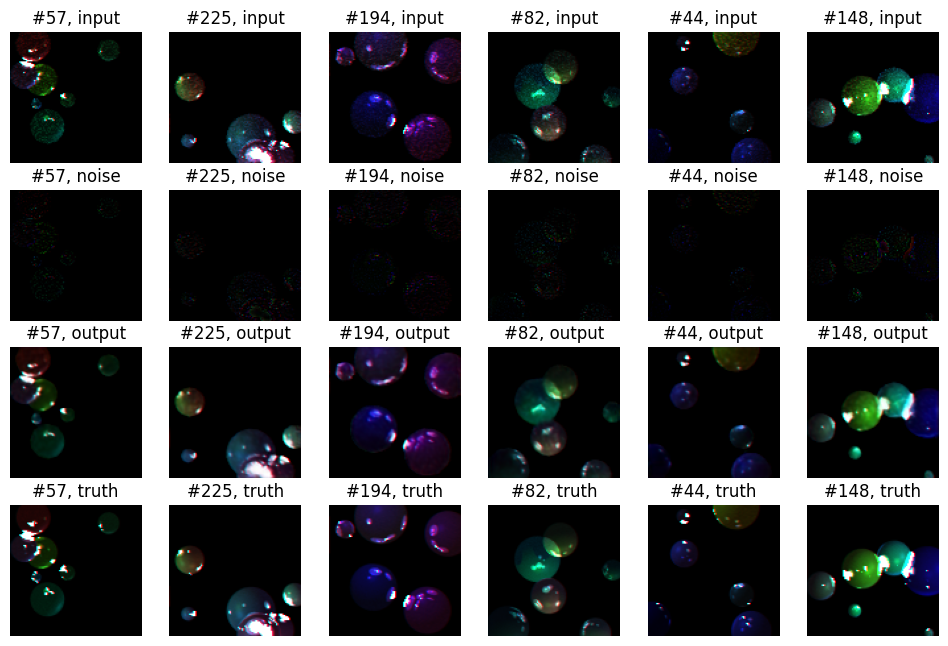

CPU times: total: 7min 32s
Wall time: 5min 39s


In [5]:
%%time

# That wasn't exactly an improvement. Let's move back to SGD, and this time implement momentum!
# We will use a dampening value of 0.9, as this is standard for momentum-based SGD

def optimalModelTrial7(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', name = 'internalConv{}'.format(i), use_bias=False))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=False))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = optimalModelTrial7(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer=tf.keras.optimizers.SGD(
                                learning_rate=0.0003, momentum=0.9, nesterov=False),
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'OptimalTrial7', epochs = 1000, batch_size = 8)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputConv (Conv2D)          (None, 100, 100, 64)      2368      
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 internalConv0 (Conv2D)      (None, 100, 100, 64)      36928     
                                                                 
 batch_normalization_1 (Batc  (None, 100, 100, 64)     256       
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 100, 100, 64)      0

Epoch 13/1000
94/94 [==============================] - 2s 24ms/step - loss: -26.4274 - mean_squared_error: 0.0033 - binary_crossentropy: 0.0943 - cosine_similarity: 0.2495 - customPSNR: -26.4274 - builtInPSNR: -74.6901 - val_loss: -26.9250 - val_mean_squared_error: 0.0030 - val_binary_crossentropy: 0.1003 - val_cosine_similarity: 0.2392 - val_customPSNR: -26.9250 - val_builtInPSNR: -75.2911 - lr: 3.0000e-04
Epoch 14/1000
94/94 [==============================] - 3s 27ms/step - loss: -26.5579 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0933 - cosine_similarity: 0.2506 - customPSNR: -26.5579 - builtInPSNR: -74.8206 - val_loss: -26.8525 - val_mean_squared_error: 0.0031 - val_binary_crossentropy: 0.0914 - val_cosine_similarity: 0.2473 - val_customPSNR: -26.8525 - val_builtInPSNR: -75.2186 - lr: 3.0000e-04
Epoch 15/1000
94/94 [==============================] - 2s 24ms/step - loss: -26.5729 - mean_squared_error: 0.0032 - binary_crossentropy: 0.0933 - cosine_similarity: 0.2507 - cust

Epoch 33/1000
94/94 [==============================] - 2s 22ms/step - loss: -27.5605 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0886 - cosine_similarity: 0.2557 - customPSNR: -27.5605 - builtInPSNR: -75.8232 - val_loss: -27.8099 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0862 - val_cosine_similarity: 0.2535 - val_customPSNR: -27.8099 - val_builtInPSNR: -76.1760 - lr: 3.0000e-04
Epoch 34/1000
94/94 [==============================] - 2s 22ms/step - loss: -27.5109 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0892 - cosine_similarity: 0.2548 - customPSNR: -27.5109 - builtInPSNR: -75.7736 - val_loss: -27.8733 - val_mean_squared_error: 0.0026 - val_binary_crossentropy: 0.0892 - val_cosine_similarity: 0.2518 - val_customPSNR: -27.8733 - val_builtInPSNR: -76.2394 - lr: 3.0000e-04
Epoch 35/1000
94/94 [==============================] - ETA: 0s - loss: -27.4883 - mean_squared_error: 0.0027 - binary_crossentropy: 0.0887 - cosine_similarity: 0.2559 - customPSN

94/94 [==============================] - 2s 22ms/step - loss: -28.0371 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0371 - builtInPSNR: -76.2998 - val_loss: -28.3439 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2515 - val_customPSNR: -28.3439 - val_builtInPSNR: -76.7100 - lr: 3.0000e-06
Epoch 72/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0088 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0872 - cosine_similarity: 0.2575 - customPSNR: -28.0088 - builtInPSNR: -76.2715 - val_loss: -28.3391 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0867 - val_cosine_similarity: 0.2512 - val_customPSNR: -28.3391 - val_builtInPSNR: -76.7052 - lr: 3.0000e-06
Epoch 73/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0353 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2577 - customPSNR: -28.03

Epoch 90/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0341 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0341 - builtInPSNR: -76.2968 - val_loss: -28.3435 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2514 - val_customPSNR: -28.3435 - val_builtInPSNR: -76.7096 - lr: 3.0000e-08
Epoch 91/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0223 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2575 - customPSNR: -28.0223 - builtInPSNR: -76.2850 - val_loss: -28.3416 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2513 - val_customPSNR: -28.3416 - val_builtInPSNR: -76.7077 - lr: 3.0000e-08
Epoch 92/1000
94/94 [==============================] - ETA: 0s - loss: -28.0407 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0872 - cosine_similarity: 0.2575 - customPSN

Epoch 108/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0386 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0386 - builtInPSNR: -76.3013 - val_loss: -28.3448 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2514 - val_customPSNR: -28.3448 - val_builtInPSNR: -76.7109 - lr: 3.0000e-11
Epoch 109/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0304 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2575 - customPSNR: -28.0304 - builtInPSNR: -76.2930 - val_loss: -28.3440 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2513 - val_customPSNR: -28.3440 - val_builtInPSNR: -76.7101 - lr: 3.0000e-11
Epoch 110/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0497 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - c

Epoch 127/1000
94/94 [==============================] - ETA: 0s - loss: -28.0301 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0301 - builtInPSNR: -76.2928
Epoch 127: ReduceLROnPlateau reducing learning rate to 3.0000001506429173e-14.
94/94 [==============================] - 2s 22ms/step - loss: -28.0301 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0301 - builtInPSNR: -76.2928 - val_loss: -28.3444 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2515 - val_customPSNR: -28.3444 - val_builtInPSNR: -76.7105 - lr: 3.0000e-13
Epoch 128/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0406 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0406 - builtInPSNR: -76.3033 - val_loss: -28.3453 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 -

Epoch 145/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0549 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0549 - builtInPSNR: -76.3176 - val_loss: -28.3440 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2513 - val_customPSNR: -28.3440 - val_builtInPSNR: -76.7101 - lr: 3.0000e-16
Epoch 146/1000
94/94 [==============================] - 2s 24ms/step - loss: -28.0443 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0443 - builtInPSNR: -76.3069 - val_loss: -28.3412 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2513 - val_customPSNR: -28.3412 - val_builtInPSNR: -76.7073 - lr: 3.0000e-16
Epoch 147/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0310 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2575 - c

Epoch 163/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0444 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0444 - builtInPSNR: -76.3071 - val_loss: -28.3466 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0865 - val_cosine_similarity: 0.2514 - val_customPSNR: -28.3466 - val_builtInPSNR: -76.7127 - lr: 3.0000e-19
Epoch 164/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0392 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0872 - cosine_similarity: 0.2576 - customPSNR: -28.0392 - builtInPSNR: -76.3019 - val_loss: -28.3437 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2513 - val_customPSNR: -28.3437 - val_builtInPSNR: -76.7098 - lr: 3.0000e-19
Epoch 165/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0342 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - c

Epoch 182/1000
94/94 [==============================] - 2s 24ms/step - loss: -28.0398 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2575 - customPSNR: -28.0398 - builtInPSNR: -76.3025 - val_loss: -28.3453 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2514 - val_customPSNR: -28.3453 - val_builtInPSNR: -76.7114 - lr: 3.0000e-21
Epoch 183/1000
94/94 [==============================] - ETA: 0s - loss: -28.0436 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0436 - builtInPSNR: -76.3064
Epoch 183: ReduceLROnPlateau reducing learning rate to 3.000000510641743e-22.
94/94 [==============================] - 2s 24ms/step - loss: -28.0436 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0436 - builtInPSNR: -76.3064 - val_loss: -28.3443 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - 

Epoch 201/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0317 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2575 - customPSNR: -28.0317 - builtInPSNR: -76.2944 - val_loss: -28.3426 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2513 - val_customPSNR: -28.3426 - val_builtInPSNR: -76.7087 - lr: 3.0000e-23
Epoch 202/1000
94/94 [==============================] - ETA: 0s - loss: -28.0414 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0872 - cosine_similarity: 0.2576 - customPSNR: -28.0414 - builtInPSNR: -76.3041
Epoch 202: ReduceLROnPlateau reducing learning rate to 3.0000004727764197e-24.
94/94 [==============================] - 2s 23ms/step - loss: -28.0414 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0872 - cosine_similarity: 0.2576 - customPSNR: -28.0414 - builtInPSNR: -76.3041 - val_loss: -28.3467 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 -

Epoch 219/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0370 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0872 - cosine_similarity: 0.2576 - customPSNR: -28.0370 - builtInPSNR: -76.2996 - val_loss: -28.3411 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2514 - val_customPSNR: -28.3411 - val_builtInPSNR: -76.7072 - lr: 3.0000e-26
Epoch 220/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0327 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0327 - builtInPSNR: -76.2953 - val_loss: -28.3437 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2515 - val_customPSNR: -28.3437 - val_builtInPSNR: -76.7098 - lr: 3.0000e-26
Epoch 221/1000
94/94 [==============================] - 2s 24ms/step - loss: -28.0417 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - c

94/94 [==============================] - 2s 23ms/step - loss: -28.0370 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0370 - builtInPSNR: -76.2996 - val_loss: -28.3416 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2513 - val_customPSNR: -28.3416 - val_builtInPSNR: -76.7077 - lr: 3.0000e-28
Epoch 238/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0407 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0407 - builtInPSNR: -76.3034 - val_loss: -28.3410 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2513 - val_customPSNR: -28.3410 - val_builtInPSNR: -76.7071 - lr: 3.0000e-29
Epoch 239/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0417 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.

Epoch 256/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0455 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0455 - builtInPSNR: -76.3082 - val_loss: -28.3420 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2512 - val_customPSNR: -28.3420 - val_builtInPSNR: -76.7081 - lr: 3.0000e-31
Epoch 257/1000
94/94 [==============================] - 2s 22ms/step - loss: -28.0397 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0397 - builtInPSNR: -76.3023 - val_loss: -28.3458 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2513 - val_customPSNR: -28.3458 - val_builtInPSNR: -76.7119 - lr: 3.0000e-31
Epoch 258/1000
94/94 [==============================] - ETA: 0s - loss: -28.0364 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0872 - cosine_similarity: 0.2575 - custom

Epoch 274/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0204 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0872 - cosine_similarity: 0.2575 - customPSNR: -28.0204 - builtInPSNR: -76.2831 - val_loss: -28.3400 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2513 - val_customPSNR: -28.3400 - val_builtInPSNR: -76.7061 - lr: 3.0000e-34
Epoch 275/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0404 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - customPSNR: -28.0404 - builtInPSNR: -76.3031 - val_loss: -28.3426 - val_mean_squared_error: 0.0024 - val_binary_crossentropy: 0.0866 - val_cosine_similarity: 0.2513 - val_customPSNR: -28.3426 - val_builtInPSNR: -76.7087 - lr: 3.0000e-34
Epoch 276/1000
94/94 [==============================] - 2s 23ms/step - loss: -28.0452 - mean_squared_error: 0.0025 - binary_crossentropy: 0.0871 - cosine_similarity: 0.2576 - c

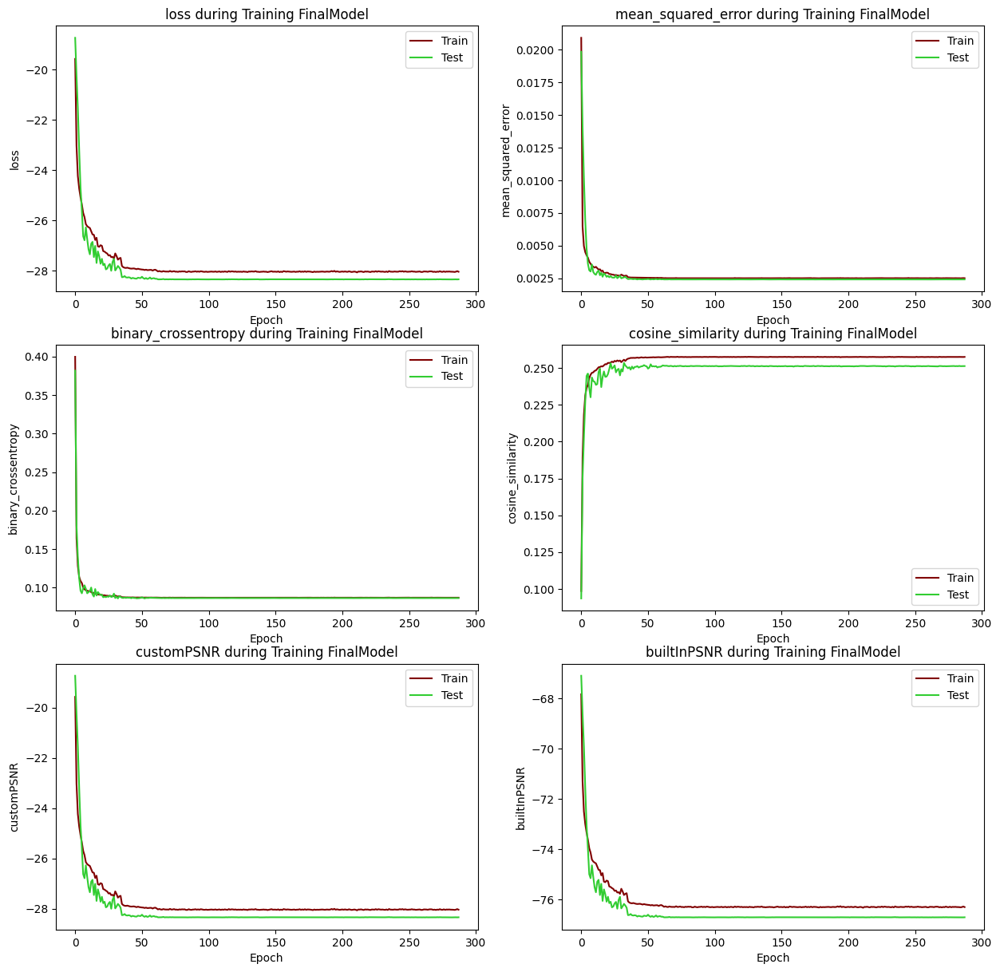

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

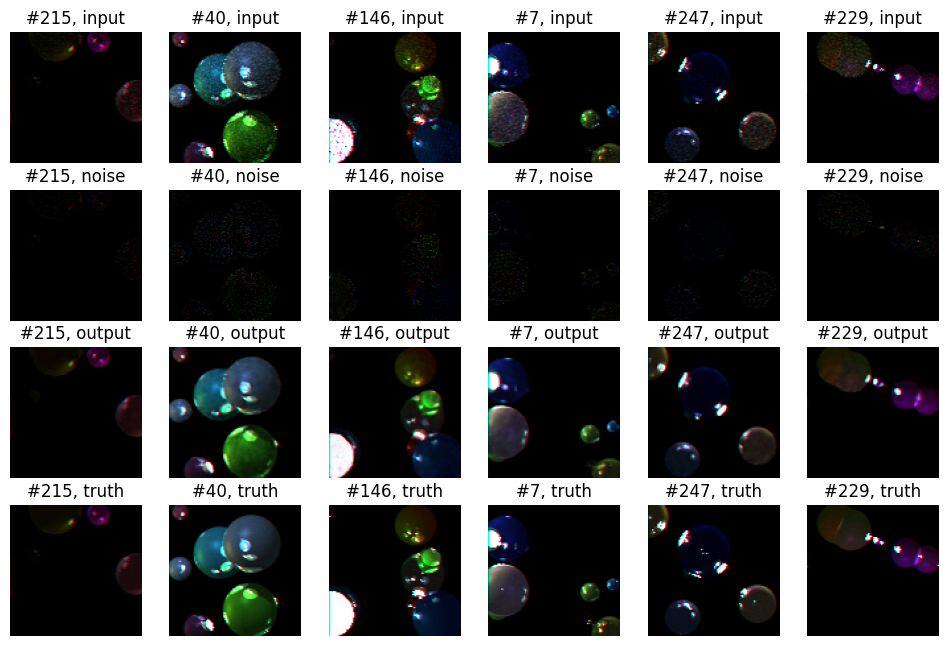

CPU times: total: 13min
Wall time: 10min 26s


In [4]:
%%time

# Of the above tests, OptimalTrail5 performed the best.
# Thus, we will use it as the basis for our final trial,
# Adding BN+relu after final layer and adding bias to all layers but input

# Finally, we will adjust out use of bias (and add BN after the first CNN layer)

def finalTrial(loss,optimizer,metrics):
    model = tf.keras.Sequential()
    
    
    # Input convolution layer
    # 4D pixels (RGBD, D = depth)
    model.add(tf.keras.layers.Conv2D(64, 3, padding='same', input_shape = (100,100,4), activation = 'relu', name = 'inputConv'))
    
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    
    # 5 hidden convolution layers without bias
    for i in range(5):
        model.add(tf.keras.layers.Conv2D(64, 3, padding='same', name = 'internalConv{}'.format(i), use_bias=True))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
       
    # Final output layer, with 3d pixels, same resolution as input image
    model.add(tf.keras.layers.Conv2D(3, 3, padding='same', activation = 'relu', name = 'convOut', use_bias=True))
    
    

    # finally, compile with the provided optimizer to optimize the given loss object.
    # Also, list of metrics are going to be computed during each epoch.
    model.compile(loss=loss, 
                  optimizer=optimizer,
                  metrics=metrics)
    return model


# Actually create above model
model = finalTrial(loss = customPSNR, # 'mean_squared_error' , builtInPSNR, customPSNR
                           optimizer=tf.keras.optimizers.Adam(learning_rate=0.0003),
                           metrics=['mean_squared_error','binary_crossentropy', 'cosine_similarity', customPSNR, builtInPSNR]
                          )

# Define both x and y for training and test sets
test_size = 750

x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

history, model = trainAndRenderModel(model, x_train, y_train, x_test, y_test, 'FinalModel', epochs = 1000, batch_size = 8)

## Conclusions

Several of the attempted optimal models produces great results, and the best one is up to personal interpretation.

For the purposes of this project, however, I selected optimalModelTrial5, which resulted in a final loss of -28.7096, to be the best model, as in addition to having the lowest loss value, it also looks the most visually appealing. However, please investigate the other models if you wish.

For more information on this project, please read my paper, "Denoising Monte Carlo Path-Traced Images using Convolutional Neural Networks".

In [11]:
# Now, we will generate images for our optimal model
model = load_model('saved_models/OptimalTrial5.sav')


In [14]:
# Define both x and y for training and test sets
test_size = 750

# For this setup, x is the noisy image and y is the 'noiseless' image
# Alternatively, you can set y as the residual noise, by subtracting the input from the noiseless image
x_train =x_set[:test_size] #[:,:,:,:-1]
y_train = y_set[:test_size] # x_set[:test_size][:,:,:,:-1] - y_set[:test_size] # y_set[:test_size] # 
x_test = x_set[test_size:] #[:,:,:,:-1]
y_test = y_set[test_size:] # x_set[test_size:][:,:,:,:-1] - y_set[test_size:] # y_set[test_size:] # 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

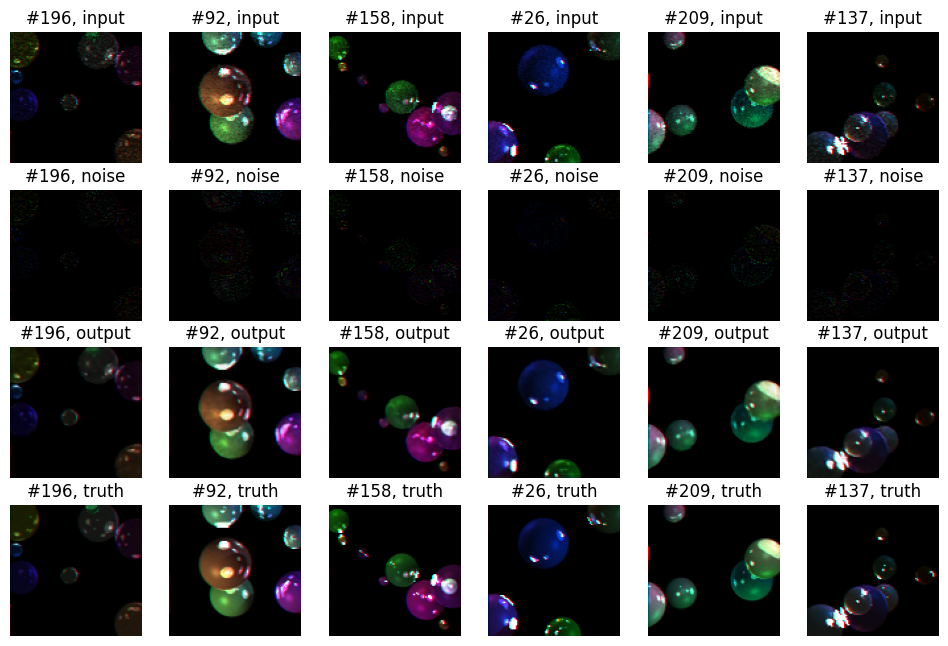

In [11]:
# Use model to de-noise test set   
predictions = model.predict(x_test)
# Find residual noise by subtracting prediction from input
noise = x_test[:,:,:,:3] - predictions
# Then render a comparison of all image classes
renderComparison(   [ x_test[:,:,:,:3], noise, predictions, y_test ], 
                        subtitles = ['input','noise','output', 'truth'],
                        count = 6)

In [12]:
%%time
# Time to de-noise 1000 images

predictions = model.predict(x_set)

CPU times: total: 797 ms
Wall time: 796 ms


In [100]:
%%time
# Time to de-noise 1000 images

predictions = model.predict(x_set[:1])

CPU times: total: 31.2 ms
Wall time: 32 ms


In [101]:
# Setting variables of how long it took to create training data (seconds)
xAvg = 4.990144673347473
xTotal = 4990.144673347473

yAvg = 241.93829142284395
yTotal = 241938.29142284393

networkTrain = 780
networkPred = 0.797

In [142]:
# Comparison of varying hidden layer sizes
modelsToTest = ['X Render Time\nAvg', 'X Render Time\nTotal\n(1000 images)', 'y Render Time\n Avg', 
                'y Render Time\nTotal\n(1000 images)', 'Denoising\n(1000 images)', 'Network\nTraining', 
                'Render X set\n+ Denoise\n(1000 images)',
                'Render X set\n+ Train Network\n+ Denoise\n(1000 images)'
                ]
modelResults = [ xAvg, xTotal, yAvg, yTotal, networkPred, networkTrain, (xTotal+networkPred), (xTotal+networkPred+networkTrain) ]
#colorMap = ['blue','blue','red','red','green','green']
colorMap = [ 'cornflowerblue', 'cornflowerblue', 'lightcoral', 'lightcoral', 'palegreen', 'palegreen', 'palegoldenrod', 'palegoldenrod' ]

Text(0.5, 1.0, 'Execution Time (logarithmic) of All Components of the Implementation')

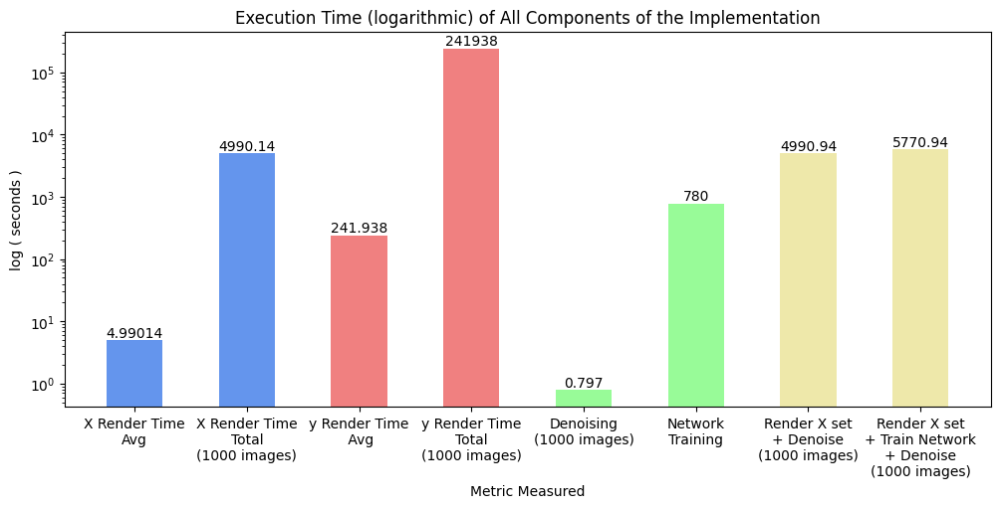

In [145]:
fig, ax = plt.subplots(dpi=100)
bars = ax.bar(modelsToTest, modelResults, 0.5, color = colorMap)
ax.bar_label(bars)
ax.set_yscale('log')
ax.set_xlabel('Metric Measured')
ax.set_ylabel('log ( seconds )')
fig.set_size_inches(12, 5)
ax.set_title('Execution Time (logarithmic) of All Components of the Implementation')